In [1]:
from __future__ import division
import utils
import pandas as pd
import numpy as np
import math
import datetime as dt

# from sklearn.preprocessing import MinMaxScaler
# from sklearn.feature_selection import VarianceThreshold
# from catboost import CatBoostClassifier, Pool, cv
from sklearn.model_selection import  GridSearchCV, RandomizedSearchCV, train_test_split, StratifiedKFold, cross_val_score
from sklearn.pipeline import Pipeline 
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score, roc_curve, f1_score, confusion_matrix, precision_score, recall_score
from imblearn.under_sampling import RandomUnderSampler
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from sklearn.externals import joblib
import lightgbm as lgb

from lightgbm import LGBMClassifier

from matplotlib import pyplot as plt
%matplotlib inline

import seaborn as sns
# from sklearn import preprocessing

from hyperopt import hp, fmin, tpe, STATUS_OK, Trials

pd.options.display.float_format = "{:.2f}".format
pd.set_option('display.max_columns', None)  # or 1000
pd.set_option('display.max_rows', None)  # or 1000
pd.set_option('display.max_colwidth', -1)  # or 199
# np.set_printoptions(threshold=np.nan)  

#####################################################################################

def stratify_sampling(df, tot_out_rows, strat_col):
    rowspercol=round(tot_out_rows/df[strat_col].nunique())
    a=pd.DataFrame()
    
    for strata in range(0,df[strat_col].nunique()):
        print(strata)
        a=a.append(df[df[strat_col]==strata].sample(rowspercol))
        print (a.shape)
    return a.sample(tot_out_rows)

# Read dataset

In [126]:
df=pd.read_pickle('/home/gjain/df_cat_enc_part1.pkl')

In [97]:
df.isnull().sum()

timestamp                       0
order_number                    0
pay_id                          0
affiliate                       0
channelcode                     0
local_trans_amt                 0
trans_currency                  0
nonmor                          0
payment_method                  0
eci                             0
card_cvvmatch                   0
card_avsmatch                   0
customer_title                  0
website_language                0
brand_continent                 0
HasTicketInsurance              0
HasInsurance                    0
HasBaggage                      0
HasBaggage_Sale                 0
HasAirhelpPlus                  0
UsedVoucher                     0
HasSP                           0
gender                          0
BookerCity                      0
BookerCountry_Name              0
TotalAmountEUR                  0
airline                         0
Consolidator                    0
OriginAirportCode               0
OriginCityName

In [98]:
df.target.value_counts()

0    1386632
1    2570   
Name: target, dtype: int64

In [99]:
#target, timestamp, order_number, pay_id not included below
#72 cols
all_cols=['affiliate','channelcode',
       'local_trans_amt', 'trans_currency', 'nonmor', 'payment_method', 'eci',
       'card_cvvmatch', 'card_avsmatch', 'customer_title', 'website_language',
       'brand_continent', 'HasTicketInsurance', 'HasInsurance', 'HasBaggage',
       'HasBaggage_Sale', 'HasAirhelpPlus', 'UsedVoucher', 'HasSP', 'gender',
       'BookerCity', 'BookerCountry_Name', 'TotalAmountEUR', 'airline',
       'Consolidator', 'OriginAirportCode', 'OriginCityName',
       'OriginCountryName', 'OriginWorldPartName', 'OriginRegion',
       'OriginSubRegion', 'DestinationAirportCode', 'DestinationCityName',
       'DestinationCountryName', 'DestinationWorldPartName',
       'DestinationRegion', 'DestinationSubRegion', 'Supplier',
       'DomesticOrInternational', 'Haul', 'OneWayOrReturn', 'IsCombinedOneWay',
       'IsITFare', 'TotalNumberOfPassengers', 'TotalNumberOfAdults',
       'TotalNumberOfChildren', 'TotalNumberOfInfants', 'COW_NumberOfSegments',
       'COW_NumberOfInboundSegments', 'COW_NumberOfOutboundSegments',
       'NumberOfTickets', 'FareBaseAmount', 'HasSplitPnr', 'DeviceType',
#        'OrderDateBrandTime_Month',
        'IsLowCost', 'email_user_id_len',
       'email_domain', 'dob_month', 'bookerIsTravelAgency',
       'successful_attempt_no', 'country_ip_flight_MatchScore',
       'flight_distance', 'days_to_departure', 'vacation_length',
       'cities_in_itinerary', 'cabin_class', 'name_len', 'weekend_booking',
       'booking_daytime', 'bookerAgeBracket', 'email_sanity_score',
          #new ad
         'OrderDateBrandTime_DayOfWeek',
         'ordermonth_sin','ordermonth_cos','departuremonth_sin','departuremonth_cos']

all_cat_cols=['affiliate','channelcode','trans_currency','nonmor','payment_method','eci','card_cvvmatch','card_avsmatch',
              'customer_title','website_language','brand_continent','HasTicketInsurance','HasInsurance','HasBaggage',
              'HasBaggage_Sale','HasAirhelpPlus','UsedVoucher','HasSP','gender','BookerCity','BookerCountry_Name','airline',
              'Consolidator','OriginAirportCode','OriginCityName','OriginCountryName','OriginWorldPartName','OriginRegion',
          'OriginSubRegion','DestinationAirportCode','DestinationCityName','DestinationCountryName','DestinationWorldPartName',
              'DestinationRegion','DestinationSubRegion','Supplier','DomesticOrInternational','Haul','OneWayOrReturn',
              'IsCombinedOneWay','IsITFare','HasSplitPnr','DeviceType','IsLowCost','email_domain','cabin_class',
              'bookerIsTravelAgency','weekend_booking','dob_month','booking_daytime', 'bookerAgeBracket',
          'OrderDateBrandTime_DayOfWeek']

#Get location of loo_cols, our categorical columns, in df[all_cols], to feed in Pool
df2=df[all_cols]
categorical_features_pos=[df2.columns.get_loc(c) for c in all_cat_cols]
categorical_features_pos

[0,
 1,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 52,
 53,
 54,
 56,
 65,
 58,
 67,
 57,
 68,
 69,
 71]

# Random under-sampling

In [100]:
sampler = RandomUnderSampler({1: 2570, 0: 50000}, random_state=16)

X, y = sampler.fit_sample(df[all_cols], df.target)
X=pd.DataFrame(X, columns=[all_cols])

# GMM sampling

In [16]:
gmm_data=df[all_cols][df.target==0].copy()

scaler = StandardScaler()
gmm_data_arr=scaler.fit_transform(gmm_data)

classifier = GaussianMixture(n_components=5,covariance_type='full', random_state=50,n_init=1, verbose=1,max_iter=100)
classifier.fit(gmm_data_arr)
ll = classifier.score(gmm_data_arr)
print (ll)

gmm_data['cluster']=classifier.predict(gmm_data_arr)
del gmm_data_arr
sampled_good_bookings=stratify_sampling(gmm_data, 50000, 'cluster')

gmm_data=df[all_cols][df.target==1].copy()
gmm_data['target']=1
sampled_good_bookings.drop(['cluster'],axis=1,inplace=True)
sampled_good_bookings['target']=0
sampled_data=gmm_data.append(sampled_good_bookings)

del gmm_data
del sampled_good_bookings

train=sampled_data.iloc[:,:-1]
target=sampled_data.iloc[:,-1]

del sampled_data

train.to_csv('/home/gjain/train.csv')
target.to_csv('/home/gjain/target.csv')

# train=pd.read_csv('/home/gjain/train.csv')
# target=pd.read_csv('/home/gjain/target.csv')

/root/.local/lib/python3.5/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/root/.local/lib/python3.5/site-packages/sklearn/base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


# No sampling

In [127]:
y=df.target
X=df[all_cols]

# Train

In [129]:
train=X.as_matrix()
target=np.array(y)

test=pd.read_pickle('/home/gjain/test_data.pkl')
X_test=test[all_cols].as_matrix()
y_test=np.array(test.target)

print (X.shape)
print (X_test.shape)

/home/ubuntu/yes/lib/python3.5/site-packages/ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.
/home/ubuntu/yes/lib/python3.5/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """


(1389202, 76)
(267688, 76)


In [ ]:
space ={
        'max_depth': 3,
        'learning_rate': hp.loguniform('learning_rate', np.log(0.08), np.log(0.1)),
        'n_estimators': 4000, #to be decided by early stopping
        'subsample': hp.uniform('subsample', 0.3, 1.0),
        'colsample_bytree': hp.uniform('colsample_bytree', 0.6, 0.7),
        'reg_alpha': hp.uniform('reg_alpha', 0.1, 0.3),
        'reg_lambda': hp.uniform('reg_lambda', 0.5, 0.7),
        'min_child_samples': hp.choice('min_child_samples',range(80,100)),
        'num_leaves': hp.quniform('num_leaves', 130, 300, 1),
        'scale_pos_weight': hp.quniform('scale_pos_weight', 15, 1000, 1)
       }

#     'class_weight': hp.choice('class_weight', [None, 'balanced']),  

def get_lgb_params(space):
    lgb_params = dict()
    lgb_params['boosting_type'] = 'gbdt'
    lgb_params['objective'] = 'binary'
    lgb_params['max_depth'] = -1
    lgb_params['learning_rate'] = space['learning_rate']
    lgb_params['n_estimators'] = space['n_estimators']
    lgb_params['subsample'] = space['subsample']
#     lgb_params['class_weight'] = {0:1, 1:18}
    lgb_params['colsample_bytree'] = space['colsample_bytree']
    lgb_params['reg_alpha'] = space['reg_alpha'] 
    lgb_params['reg_lambda'] = space['reg_lambda'] 
    lgb_params['random_state'] = 33
    lgb_params['min_child_samples'] = space['min_child_samples']
    lgb_params['importance_type'] = 'gain'
    lgb_params['num_leaves'] = int(space['num_leaves'])
    lgb_params['scale_pos_weight'] = int(space['scale_pos_weight'])    
    return lgb_params


def acc_model(space):
    
    params=get_lgb_params(space)
    
    clf = LGBMClassifier(**params)
    
    fit_params={'eval_set':[(X_test,y_test)],
            'eval_metric':'f1_score', 
            'early_stopping_rounds':40,
            'verbose':True,
            'categorical_feature':categorical_features_pos}
    
    return cross_val_score(clf, train, target, scoring='f1', cv=10, fit_params=fit_params).mean()

best = 0
def f(params):
    global best
    acc = acc_model(params)
    if acc > best:
        best = acc
    print ('new best:', best, params)
    return {'loss': acc, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space, algo=tpe.suggest, max_evals=10, trials=trials)
print ('best:')
print (best)


  0%|          | 0/10 [00:00<?, ?it/s, best loss: ?]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.903663              
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.900011              
[3]	valid_0's binary_logloss: 0.916635              
[4]	valid_0's binary_logloss: 0.898003              
[5]	valid_0's binary_logloss: 0.803489              
[6]	valid_0's binary_logloss: 0.69213               
[7]	valid_0's binary_logloss: 0.62982               
[8]	valid_0's binary_logloss: 0.614271              
[9]	valid_0's binary_logloss: 0.534532              
[10]	valid_0's binary_logloss: 0.534856             
[11]	valid_0's binary_logloss: 0.519096             
[12]	valid_0's binary_logloss: 0.507336             
[13]	valid_0's binary_logloss: 0.447366             
[14]	valid_0's binary_logloss: 0.368376             
[15]	valid_0's binary_logloss: 0.316169             
[16]	valid_0's binary_logloss: 0.314917             
[17]	valid_0's binary_logloss: 0.297682             
[18]	valid_0's binary_logloss: 0.2468

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 2.12871               
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 2.1207                
[3]	valid_0's binary_logloss: 2.09142               
[4]	valid_0's binary_logloss: 2.06795               
[5]	valid_0's binary_logloss: 2.00378               
[6]	valid_0's binary_logloss: 1.76212               
[7]	valid_0's binary_logloss: 1.70002               
[8]	valid_0's binary_logloss: 1.59952               
[9]	valid_0's binary_logloss: 1.16387               
[10]	valid_0's binary_logloss: 1.01967              
[11]	valid_0's binary_logloss: 0.969141             
[12]	valid_0's binary_logloss: 0.893545             
[13]	valid_0's binary_logloss: 8.08736              
[14]	valid_0's binary_logloss: 24.4799              
[15]	valid_0's binary_logloss: 23.9227              
[16]	valid_0's binary_logloss: 21.1661              
[17]	valid_0's binary_logloss: 25.6348              
[18]	valid_0's binary_logloss: 24.375

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.00740267            
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.0073351             
[3]	valid_0's binary_logloss: 0.00758743            
[4]	valid_0's binary_logloss: 0.00726627            
[5]	valid_0's binary_logloss: 0.007868              
[6]	valid_0's binary_logloss: 0.00801956            
[7]	valid_0's binary_logloss: 0.00862942            
[8]	valid_0's binary_logloss: 0.0112869             
[9]	valid_0's binary_logloss: 0.0117994             
[10]	valid_0's binary_logloss: 0.0129714            
[11]	valid_0's binary_logloss: 0.0131049            
[12]	valid_0's binary_logloss: 0.013354             
[13]	valid_0's binary_logloss: 0.0134158            
[14]	valid_0's binary_logloss: 0.01342              
[15]	valid_0's binary_logloss: 0.013501             
[16]	valid_0's binary_logloss: 0.0135311            
[17]	valid_0's binary_logloss: 0.0135933            
[18]	valid_0's binary_logloss: 0.0152

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.861619              
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.858125              
[3]	valid_0's binary_logloss: 0.87041               
[4]	valid_0's binary_logloss: 0.873072              
[5]	valid_0's binary_logloss: 0.857178              
[6]	valid_0's binary_logloss: 0.831898              
[7]	valid_0's binary_logloss: 0.77691               
[8]	valid_0's binary_logloss: 0.692921              
[9]	valid_0's binary_logloss: 0.659071              
[10]	valid_0's binary_logloss: 0.560774             
[11]	valid_0's binary_logloss: 0.502359             
[12]	valid_0's binary_logloss: 0.42494              
[13]	valid_0's binary_logloss: 0.423972             
[14]	valid_0's binary_logloss: 0.381777             
[15]	valid_0's binary_logloss: 0.360828             
[16]	valid_0's binary_logloss: 0.333786             
[17]	valid_0's binary_logloss: 0.334467             
[18]	valid_0's binary_logloss: 0.3345

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.905092              
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.901936              
[3]	valid_0's binary_logloss: 34.5079               
[4]	valid_0's binary_logloss: 34.5079               
[5]	valid_0's binary_logloss: 34.5079               
[6]	valid_0's binary_logloss: 34.5079               
[7]	valid_0's binary_logloss: 34.5079               
[8]	valid_0's binary_logloss: 34.5079               
[9]	valid_0's binary_logloss: 34.5079               
[10]	valid_0's binary_logloss: 34.5079              
[11]	valid_0's binary_logloss: 34.5079              
[12]	valid_0's binary_logloss: 34.5079              
[13]	valid_0's binary_logloss: 34.5079              
[14]	valid_0's binary_logloss: 34.5079              
[15]	valid_0's binary_logloss: 34.5079              
[16]	valid_0's binary_logloss: 34.3525              
[17]	valid_0's binary_logloss: 34.3425              
[18]	valid_0's binary_logloss: 34.228

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 1.92429               
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 1.91805               
[3]	valid_0's binary_logloss: 1.95427               
[4]	valid_0's binary_logloss: 1.93173               
[5]	valid_0's binary_logloss: 1.91788               
[6]	valid_0's binary_logloss: 1.89874               
[7]	valid_0's binary_logloss: 1.88372               
[8]	valid_0's binary_logloss: 1.86999               
[9]	valid_0's binary_logloss: 1.85014               
[10]	valid_0's binary_logloss: 1.74294              
[11]	valid_0's binary_logloss: 1.67624              
[12]	valid_0's binary_logloss: 1.6674               
[13]	valid_0's binary_logloss: 1.58642              
[14]	valid_0's binary_logloss: 1.53393              
[15]	valid_0's binary_logloss: 1.43111              
[16]	valid_0's binary_logloss: 1.30927              
[17]	valid_0's binary_logloss: 1.30415              
[18]	valid_0's binary_logloss: 1.1484

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.628552              
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.625303              
[3]	valid_0's binary_logloss: 0.637152              
[4]	valid_0's binary_logloss: 0.624218              
[5]	valid_0's binary_logloss: 0.579742              
[6]	valid_0's binary_logloss: 0.558986              
[7]	valid_0's binary_logloss: 0.546082              
[8]	valid_0's binary_logloss: 0.512                 
[9]	valid_0's binary_logloss: 0.503857              
[10]	valid_0's binary_logloss: 0.468779             
[11]	valid_0's binary_logloss: 0.428114             
[12]	valid_0's binary_logloss: 0.425081             
[13]	valid_0's binary_logloss: 0.353551             
[14]	valid_0's binary_logloss: 0.316469             
[15]	valid_0's binary_logloss: 0.284336             
[16]	valid_0's binary_logloss: 0.259952             
[17]	valid_0's binary_logloss: 0.251275             
[18]	valid_0's binary_logloss: 0.2406

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 1.67377               
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 1.667                 
[3]	valid_0's binary_logloss: 1.69466               
[4]	valid_0's binary_logloss: 1.90659               
[5]	valid_0's binary_logloss: 1.87243               
[6]	valid_0's binary_logloss: 1.82061               
[7]	valid_0's binary_logloss: 1.73965               
[8]	valid_0's binary_logloss: 1.71393               
[9]	valid_0's binary_logloss: 1.6291                
[10]	valid_0's binary_logloss: 1.54341              
[11]	valid_0's binary_logloss: 1.4281               
[12]	valid_0's binary_logloss: 1.41252              
[13]	valid_0's binary_logloss: 1.41158              
[14]	valid_0's binary_logloss: 1.4078               
[15]	valid_0's binary_logloss: 4.03889              
[16]	valid_0's binary_logloss: 3.88219              
[17]	valid_0's binary_logloss: 3.84413              
[18]	valid_0's binary_logloss: 3.7830

In [ ]:
space ={
        'max_depth': hp.choice('max_depth',range(3,10)),
        'learning_rate': hp.loguniform('learning_rate', np.log(0.01), np.log(0.2)),
        'n_estimators': 4000, #to be decided by early stopping
        'subsample': hp.uniform('subsample', 0.8, 1.0),
        'colsample_bytree': hp.uniform('colsample_bytree', 0.3, 1.0),
        'reg_alpha': hp.uniform('reg_alpha', 0.0, 1.0),
        'reg_lambda': hp.uniform('reg_lambda', 0.0, 1.0),
        'min_child_samples': hp.choice('min_child_samples',range(10,2000)),
        'num_leaves': hp.quniform('num_leaves', 30, 150, 1),
        'scale_pos_weight': hp.quniform('scale_pos_weight', 15, 1000, 1)
       }

#     'class_weight': hp.choice('class_weight', [None, 'balanced']),  

def get_lgb_params(space):
    lgb_params = dict()
    lgb_params['boosting_type'] = 'gbdt'
    lgb_params['objective'] = 'binary'
    lgb_params['max_depth'] = -1
    lgb_params['learning_rate'] = space['learning_rate']
    lgb_params['n_estimators'] = space['n_estimators']
    lgb_params['subsample'] = space['subsample']
#     lgb_params['class_weight'] = {0:1, 1:18}
    lgb_params['colsample_bytree'] = space['colsample_bytree']
    lgb_params['reg_alpha'] = space['reg_alpha'] 
    lgb_params['reg_lambda'] = space['reg_lambda'] 
    lgb_params['random_state'] = 26
    lgb_params['min_child_samples'] = space['min_child_samples']
    lgb_params['importance_type'] = 'gain'
    lgb_params['num_leaves'] = int(space['num_leaves'])
    lgb_params['scale_pos_weight'] = int(space['scale_pos_weight']) 
    return lgb_params


def acc_model(space):
    
    params=get_lgb_params(space)
    
    clf = LGBMClassifier(**params)
    
    fit_params={'eval_set':[(X_test,y_test)],
            'eval_metric':'f1_score', 
            'early_stopping_rounds':40,
            'verbose':True,
            'categorical_feature':categorical_features_pos}
    
    return cross_val_score(clf, train, target, scoring='f1', cv=10, fit_params=fit_params).mean()

best = 0
def f(params):
    global best
    acc = acc_model(params)
    if acc > best:
        best = acc
    print ('new best:', best, params)
    return {'loss': acc, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space, algo=tpe.suggest, max_evals=100, trials=trials)
print ('best:')
print (best)


  0%|          | 0/100 [00:00<?, ?it/s, best loss: ?]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.55467                
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.594667               
[3]	valid_0's binary_logloss: 0.500021               
[4]	valid_0's binary_logloss: 0.439587               
[5]	valid_0's binary_logloss: 0.394846               
[6]	valid_0's binary_logloss: 0.407359               
[7]	valid_0's binary_logloss: 0.404197               
[8]	valid_0's binary_logloss: 0.423401               
[9]	valid_0's binary_logloss: 0.403227               
[10]	valid_0's binary_logloss: 0.346777              
[11]	valid_0's binary_logloss: 0.298966              
[12]	valid_0's binary_logloss: 0.307988              
[13]	valid_0's binary_logloss: 0.312702              
[14]	valid_0's binary_logloss: 0.294557              
[15]	valid_0's binary_logloss: 0.254458              
[16]	valid_0's binary_logloss: 0.262867              
[17]	valid_0's binary_logloss: 0.226593              
[18]	valid_0's binar

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.549671               
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.475176               
[3]	valid_0's binary_logloss: 0.51611                
[4]	valid_0's binary_logloss: 0.563058               
[5]	valid_0's binary_logloss: 0.47918                
[6]	valid_0's binary_logloss: 0.431954               
[7]	valid_0's binary_logloss: 0.43242                
[8]	valid_0's binary_logloss: 0.443658               
[9]	valid_0's binary_logloss: 0.44354                
[10]	valid_0's binary_logloss: 0.470951              
[11]	valid_0's binary_logloss: 0.401429              
[12]	valid_0's binary_logloss: 0.401532              
[13]	valid_0's binary_logloss: 0.349362              
[14]	valid_0's binary_logloss: 0.287233              
[15]	valid_0's binary_logloss: 0.24764               
[16]	valid_0's binary_logloss: 0.21374               
[17]	valid_0's binary_logloss: 0.183083              
[18]	valid_0's binar

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.546128               
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.459729               
[3]	valid_0's binary_logloss: 0.391681               
[4]	valid_0's binary_logloss: 0.331351               
[5]	valid_0's binary_logloss: 0.349233               
[6]	valid_0's binary_logloss: 0.346388               
[7]	valid_0's binary_logloss: 0.297747               
[8]	valid_0's binary_logloss: 0.257394               
[9]	valid_0's binary_logloss: 0.243673               
[10]	valid_0's binary_logloss: 0.231236              
[11]	valid_0's binary_logloss: 0.195768              
[12]	valid_0's binary_logloss: 0.184942              
[13]	valid_0's binary_logloss: 0.160151              
[14]	valid_0's binary_logloss: 0.136574              
[15]	valid_0's binary_logloss: 0.152787              
[16]	valid_0's binary_logloss: 0.160548              
[17]	valid_0's binary_logloss: 0.138471              
[18]	valid_0's binar

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.559803               
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.48189                
[3]	valid_0's binary_logloss: 0.401152               
[4]	valid_0's binary_logloss: 0.334373               
[5]	valid_0's binary_logloss: 0.346972               
[6]	valid_0's binary_logloss: 0.322363               
[7]	valid_0's binary_logloss: 0.27754                
[8]	valid_0's binary_logloss: 0.285555               
[9]	valid_0's binary_logloss: 0.287893               
[10]	valid_0's binary_logloss: 0.243638              
[11]	valid_0's binary_logloss: 0.210703              
[12]	valid_0's binary_logloss: 0.219888              
[13]	valid_0's binary_logloss: 0.198266              
[14]	valid_0's binary_logloss: 0.202092              
[15]	valid_0's binary_logloss: 0.172339              
[16]	valid_0's binary_logloss: 0.182681              
[17]	valid_0's binary_logloss: 0.156052              
[18]	valid_0's binar

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.555067               
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.47588                
[3]	valid_0's binary_logloss: 0.392675               
[4]	valid_0's binary_logloss: 0.331748               
[5]	valid_0's binary_logloss: 0.301513               
[6]	valid_0's binary_logloss: 0.264466               
[7]	valid_0's binary_logloss: 0.254551               
[8]	valid_0's binary_logloss: 0.211763               
[9]	valid_0's binary_logloss: 0.218351               
[10]	valid_0's binary_logloss: 0.235901              
[11]	valid_0's binary_logloss: 0.219174              
[12]	valid_0's binary_logloss: 0.238072              
[13]	valid_0's binary_logloss: 0.202689              
[14]	valid_0's binary_logloss: 0.172424              
[15]	valid_0's binary_logloss: 0.147755              
[16]	valid_0's binary_logloss: 0.126796              
[17]	valid_0's binary_logloss: 0.108075              
[18]	valid_0's binar

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.533784               
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.595115               
[3]	valid_0's binary_logloss: 0.503089               
[4]	valid_0's binary_logloss: 0.483615               
[5]	valid_0's binary_logloss: 0.433894               
[6]	valid_0's binary_logloss: 0.40325                
[7]	valid_0's binary_logloss: 0.383336               
[8]	valid_0's binary_logloss: 0.411373               
[9]	valid_0's binary_logloss: 0.388794               
[10]	valid_0's binary_logloss: 0.338517              
[11]	valid_0's binary_logloss: 0.320784              
[12]	valid_0's binary_logloss: 0.333615              
[13]	valid_0's binary_logloss: 0.310287              
[14]	valid_0's binary_logloss: 0.270423              
[15]	valid_0's binary_logloss: 0.232665              
[16]	valid_0's binary_logloss: 0.200506              
[17]	valid_0's binary_logloss: 0.171453              
[18]	valid_0's binar

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.72255                
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.798973               
[3]	valid_0's binary_logloss: 0.807302               
[4]	valid_0's binary_logloss: 0.705427               
[5]	valid_0's binary_logloss: 0.673793               
[6]	valid_0's binary_logloss: 0.698323               
[7]	valid_0's binary_logloss: 0.597752               
[8]	valid_0's binary_logloss: 0.641335               
[9]	valid_0's binary_logloss: 0.5602                 
[10]	valid_0's binary_logloss: 0.481435              
[11]	valid_0's binary_logloss: 0.4059                
[12]	valid_0's binary_logloss: 0.348935              
[13]	valid_0's binary_logloss: 0.301711              
[14]	valid_0's binary_logloss: 0.256862              
[15]	valid_0's binary_logloss: 0.22141               
[16]	valid_0's binary_logloss: 0.19111               
[17]	valid_0's binary_logloss: 0.163435              
[18]	valid_0's binar

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.546896               
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.615685               
[3]	valid_0's binary_logloss: 0.518148               
[4]	valid_0's binary_logloss: 0.564496               
[5]	valid_0's binary_logloss: 0.483211               
[6]	valid_0's binary_logloss: 0.406138               
[7]	valid_0's binary_logloss: 0.352595               
[8]	valid_0's binary_logloss: 0.380731               
[9]	valid_0's binary_logloss: 0.38945                
[10]	valid_0's binary_logloss: 0.415802              
[11]	valid_0's binary_logloss: 0.359603              
[12]	valid_0's binary_logloss: 0.334992              
[13]	valid_0's binary_logloss: 0.288667              
[14]	valid_0's binary_logloss: 0.248881              
[15]	valid_0's binary_logloss: 0.22322               
[16]	valid_0's binary_logloss: 0.192174              
[17]	valid_0's binary_logloss: 0.166096              
[18]	valid_0's binar

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.55781                
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.466694               
[3]	valid_0's binary_logloss: 0.506805               
[4]	valid_0's binary_logloss: 0.535751               
[5]	valid_0's binary_logloss: 0.571488               
[6]	valid_0's binary_logloss: 0.608969               
[7]	valid_0's binary_logloss: 0.541411               
[8]	valid_0's binary_logloss: 0.509089               
[9]	valid_0's binary_logloss: 0.477759               
[10]	valid_0's binary_logloss: 0.434831              
[11]	valid_0's binary_logloss: 0.370969              
[12]	valid_0's binary_logloss: 0.372263              
[13]	valid_0's binary_logloss: 0.320109              
[14]	valid_0's binary_logloss: 0.3462                
[15]	valid_0's binary_logloss: 0.2974                
[16]	valid_0's binary_logloss: 0.257179              
[17]	valid_0's binary_logloss: 0.220517              
[18]	valid_0's binar

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.551161               
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.570896               
[3]	valid_0's binary_logloss: 0.484398               
[4]	valid_0's binary_logloss: 0.453831               
[5]	valid_0's binary_logloss: 0.473652               
[6]	valid_0's binary_logloss: 0.486911               
[7]	valid_0's binary_logloss: 0.416439               
[8]	valid_0's binary_logloss: 0.445949               
[9]	valid_0's binary_logloss: 0.460248               
[10]	valid_0's binary_logloss: 0.380849              
[11]	valid_0's binary_logloss: 0.329006              
[12]	valid_0's binary_logloss: 0.301421              
[13]	valid_0's binary_logloss: 0.25907               
[14]	valid_0's binary_logloss: 0.255485              
[15]	valid_0's binary_logloss: 0.218486              
[16]	valid_0's binary_logloss: 0.188587              
[17]	valid_0's binary_logloss: 0.161389              
[18]	valid_0's binar

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.621249                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.644671                                           
[3]	valid_0's binary_logloss: 0.597258                                           
[4]	valid_0's binary_logloss: 0.603579                                           
[5]	valid_0's binary_logloss: 0.561929                                           
[6]	valid_0's binary_logloss: 0.58919                                            
[7]	valid_0's binary_logloss: 0.595694                                           
[8]	valid_0's binary_logloss: 0.592218                                           
[9]	valid_0's binary_logloss: 0.552781                                           
[10]	valid_0's binary_logloss: 0.575952                                          
[11]	valid_0's binary_logloss: 0.555953                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.669149                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.628043                                           
[3]	valid_0's binary_logloss: 0.642459                                           
[4]	valid_0's binary_logloss: 0.649937                                           
[5]	valid_0's binary_logloss: 0.64552                                            
[6]	valid_0's binary_logloss: 0.648357                                           
[7]	valid_0's binary_logloss: 0.607999                                           
[8]	valid_0's binary_logloss: 0.576684                                           
[9]	valid_0's binary_logloss: 0.594169                                           
[10]	valid_0's binary_logloss: 0.59968                                           
[11]	valid_0's binary_logloss: 0.578                                             
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.603249                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.614134                                           
[3]	valid_0's binary_logloss: 0.566591                                           
[4]	valid_0's binary_logloss: 0.589628                                           
[5]	valid_0's binary_logloss: 0.552981                                           
[6]	valid_0's binary_logloss: 0.517668                                           
[7]	valid_0's binary_logloss: 0.486626                                           
[8]	valid_0's binary_logloss: 0.457777                                           
[9]	valid_0's binary_logloss: 0.432847                                           
[10]	valid_0's binary_logloss: 0.436227                                          
[11]	valid_0's binary_logloss: 0.4172                                            
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.604301                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.56791                                            
[3]	valid_0's binary_logloss: 0.528677                                           
[4]	valid_0's binary_logloss: 0.545228                                           
[5]	valid_0's binary_logloss: 0.504105                                           
[6]	valid_0's binary_logloss: 0.498421                                           
[7]	valid_0's binary_logloss: 0.465937                                           
[8]	valid_0's binary_logloss: 0.457599                                           
[9]	valid_0's binary_logloss: 0.445705                                           
[10]	valid_0's binary_logloss: 0.430499                                          
[11]	valid_0's binary_logloss: 0.408915                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.620409                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.584472                                           
[3]	valid_0's binary_logloss: 0.552112                                           
[4]	valid_0's binary_logloss: 0.569997                                           
[5]	valid_0's binary_logloss: 0.579453                                           
[6]	valid_0's binary_logloss: 0.592727                                           
[7]	valid_0's binary_logloss: 0.563052                                           
[8]	valid_0's binary_logloss: 0.564544                                           
[9]	valid_0's binary_logloss: 0.53676                                            
[10]	valid_0's binary_logloss: 0.518084                                          
[11]	valid_0's binary_logloss: 0.493195                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.598543                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.621635                                           
[3]	valid_0's binary_logloss: 0.573757                                           
[4]	valid_0's binary_logloss: 0.590085                                           
[5]	valid_0's binary_logloss: 0.547976                                           
[6]	valid_0's binary_logloss: 0.564082                                           
[7]	valid_0's binary_logloss: 0.548168                                           
[8]	valid_0's binary_logloss: 0.510613                                           
[9]	valid_0's binary_logloss: 0.483369                                           
[10]	valid_0's binary_logloss: 0.462187                                          
[11]	valid_0's binary_logloss: 0.443121                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.623735                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.63304                                            
[3]	valid_0's binary_logloss: 0.63756                                            
[4]	valid_0's binary_logloss: 0.654102                                           
[5]	valid_0's binary_logloss: 0.653057                                           
[6]	valid_0's binary_logloss: 0.664346                                           
[7]	valid_0's binary_logloss: 0.659466                                           
[8]	valid_0's binary_logloss: 0.663973                                           
[9]	valid_0's binary_logloss: 0.63019                                            
[10]	valid_0's binary_logloss: 0.652955                                          
[11]	valid_0's binary_logloss: 0.620054                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.603072                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.569672                                           
[3]	valid_0's binary_logloss: 0.523411                                           
[4]	valid_0's binary_logloss: 0.534016                                           
[5]	valid_0's binary_logloss: 0.499575                                           
[6]	valid_0's binary_logloss: 0.511099                                           
[7]	valid_0's binary_logloss: 0.504581                                           
[8]	valid_0's binary_logloss: 0.475772                                           
[9]	valid_0's binary_logloss: 0.443322                                           
[10]	valid_0's binary_logloss: 0.432494                                          
[11]	valid_0's binary_logloss: 0.421437                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.632502                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.658289                                           
[3]	valid_0's binary_logloss: 0.676096                                           
[4]	valid_0's binary_logloss: 0.687812                                           
[5]	valid_0's binary_logloss: 0.703955                                           
[6]	valid_0's binary_logloss: 0.722381                                           
[7]	valid_0's binary_logloss: 0.690842                                           
[8]	valid_0's binary_logloss: 0.678179                                           
[9]	valid_0's binary_logloss: 0.64626                                            
[10]	valid_0's binary_logloss: 0.641804                                          
[11]	valid_0's binary_logloss: 0.619544                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.632964                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.658467                                           
[3]	valid_0's binary_logloss: 0.61022                                            
[4]	valid_0's binary_logloss: 0.621097                                           
[5]	valid_0's binary_logloss: 0.577028                                           
[6]	valid_0's binary_logloss: 0.594334                                           
[7]	valid_0's binary_logloss: 0.578355                                           
[8]	valid_0's binary_logloss: 0.541483                                           
[9]	valid_0's binary_logloss: 0.517949                                           
[10]	valid_0's binary_logloss: 0.532494                                          
[11]	valid_0's binary_logloss: 0.518416                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.52512                                            
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.568548                                           
[3]	valid_0's binary_logloss: 0.450246                                           
[4]	valid_0's binary_logloss: 0.385034                                           
[5]	valid_0's binary_logloss: 0.312202                                           
[6]	valid_0's binary_logloss: 0.320328                                           
[7]	valid_0's binary_logloss: 0.253192                                           
[8]	valid_0's binary_logloss: 0.200753                                           
[9]	valid_0's binary_logloss: 0.166442                                           
[10]	valid_0's binary_logloss: 0.134695                                          
[11]	valid_0's binary_logloss: 0.106746                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.519842                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.600929                                           
[3]	valid_0's binary_logloss: 0.673458                                           
[4]	valid_0's binary_logloss: 0.573305                                           
[5]	valid_0's binary_logloss: 0.600125                                           
[6]	valid_0's binary_logloss: 0.642                                              
[7]	valid_0's binary_logloss: 0.600698                                           
[8]	valid_0's binary_logloss: 0.520405                                           
[9]	valid_0's binary_logloss: 0.548185                                           
[10]	valid_0's binary_logloss: 0.452543                                          
[11]	valid_0's binary_logloss: 0.372586                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.515895                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.412241                                           
[3]	valid_0's binary_logloss: 0.461353                                           
[4]	valid_0's binary_logloss: 0.4007                                             
[5]	valid_0's binary_logloss: 0.418664                                           
[6]	valid_0's binary_logloss: 0.35079                                            
[7]	valid_0's binary_logloss: 0.284291                                           
[8]	valid_0's binary_logloss: 0.230972                                           
[9]	valid_0's binary_logloss: 0.167668                                           
[10]	valid_0's binary_logloss: 0.134728                                          
[11]	valid_0's binary_logloss: 0.11122                                           
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.52939                                            
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.404786                                           
[3]	valid_0's binary_logloss: 0.322977                                           
[4]	valid_0's binary_logloss: 0.268062                                           
[5]	valid_0's binary_logloss: 0.269867                                           
[6]	valid_0's binary_logloss: 0.277235                                           
[7]	valid_0's binary_logloss: 0.280269                                           
[8]	valid_0's binary_logloss: 0.219586                                           
[9]	valid_0's binary_logloss: 0.199106                                           
[10]	valid_0's binary_logloss: 0.214446                                          
[11]	valid_0's binary_logloss: 0.194015                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.526763                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.43429                                            
[3]	valid_0's binary_logloss: 0.348194                                           
[4]	valid_0's binary_logloss: 0.316235                                           
[5]	valid_0's binary_logloss: 0.362287                                           
[6]	valid_0's binary_logloss: 0.302598                                           
[7]	valid_0's binary_logloss: 0.288444                                           
[8]	valid_0's binary_logloss: 0.235283                                           
[9]	valid_0's binary_logloss: 0.260107                                           
[10]	valid_0's binary_logloss: 0.21229                                           
[11]	valid_0's binary_logloss: 0.168138                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.585548                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.503922                                           
[3]	valid_0's binary_logloss: 0.553046                                           
[4]	valid_0's binary_logloss: 0.546331                                           
[5]	valid_0's binary_logloss: 0.511736                                           
[6]	valid_0's binary_logloss: 0.554691                                           
[7]	valid_0's binary_logloss: 0.537931                                           
[8]	valid_0's binary_logloss: 0.444497                                           
[9]	valid_0's binary_logloss: 0.356835                                           
[10]	valid_0's binary_logloss: 0.291223                                          
[11]	valid_0's binary_logloss: 0.261278                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.769545                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.620578                                           
[3]	valid_0's binary_logloss: 0.689789                                           
[4]	valid_0's binary_logloss: 0.741037                                           
[5]	valid_0's binary_logloss: 0.675423                                           
[6]	valid_0's binary_logloss: 0.561932                                           
[7]	valid_0's binary_logloss: 0.575169                                           
[8]	valid_0's binary_logloss: 0.491726                                           
[9]	valid_0's binary_logloss: 0.440429                                           
[10]	valid_0's binary_logloss: 0.463455                                          
[11]	valid_0's binary_logloss: 0.486557                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.526141                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.609952                                           
[3]	valid_0's binary_logloss: 0.675514                                           
[4]	valid_0's binary_logloss: 0.555535                                           
[5]	valid_0's binary_logloss: 0.461032                                           
[6]	valid_0's binary_logloss: 0.443935                                           
[7]	valid_0's binary_logloss: 0.430805                                           
[8]	valid_0's binary_logloss: 0.406735                                           
[9]	valid_0's binary_logloss: 0.304188                                           
[10]	valid_0's binary_logloss: 0.260995                                          
[11]	valid_0's binary_logloss: 0.207096                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.533823                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.4393                                             
[3]	valid_0's binary_logloss: 0.466035                                           
[4]	valid_0's binary_logloss: 0.511203                                           
[5]	valid_0's binary_logloss: 0.464874                                           
[6]	valid_0's binary_logloss: 0.509977                                           
[7]	valid_0's binary_logloss: 0.49526                                            
[8]	valid_0's binary_logloss: 0.406748                                           
[9]	valid_0's binary_logloss: 0.350559                                           
[10]	valid_0's binary_logloss: 0.283547                                          
[11]	valid_0's binary_logloss: 0.226834                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.523943                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.429103                                           
[3]	valid_0's binary_logloss: 0.491834                                           
[4]	valid_0's binary_logloss: 0.426027                                           
[5]	valid_0's binary_logloss: 0.416037                                           
[6]	valid_0's binary_logloss: 0.376821                                           
[7]	valid_0's binary_logloss: 0.406935                                           
[8]	valid_0's binary_logloss: 0.334535                                           
[9]	valid_0's binary_logloss: 0.341377                                           
[10]	valid_0's binary_logloss: 0.291014                                          
[11]	valid_0's binary_logloss: 0.238562                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.658705                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.662239                                           
[3]	valid_0's binary_logloss: 0.665228                                           
[4]	valid_0's binary_logloss: 0.668512                                           
[5]	valid_0's binary_logloss: 0.671992                                           
[6]	valid_0's binary_logloss: 0.671319                                           
[7]	valid_0's binary_logloss: 0.674675                                           
[8]	valid_0's binary_logloss: 0.678614                                           
[9]	valid_0's binary_logloss: 0.681802                                           
[10]	valid_0's binary_logloss: 0.68493                                           
[11]	valid_0's binary_logloss: 0.682727                                          
[12]	valid_0's b

/root/.local/lib/python3.5/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67

[1]	valid_0's binary_logloss: 0.653552                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.656846                                           
[3]	valid_0's binary_logloss: 0.658071                                           
[4]	valid_0's binary_logloss: 0.656469                                           
[5]	valid_0's binary_logloss: 0.659956                                           
[6]	valid_0's binary_logloss: 0.663418                                           
[7]	valid_0's binary_logloss: 0.666855                                           
[8]	valid_0's binary_logloss: 0.668223                                           
[9]	valid_0's binary_logloss: 0.671694                                           
[10]	valid_0's binary_logloss: 0.675184                                          
[11]	valid_0's binary_logloss: 0.678648                                          
[12]	valid_0's b

/root/.local/lib/python3.5/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67

[1]	valid_0's binary_logloss: 0.658673                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.66222                                            
[3]	valid_0's binary_logloss: 0.666664                                           
[4]	valid_0's binary_logloss: 0.666362                                           
[5]	valid_0's binary_logloss: 0.667896                                           
[6]	valid_0's binary_logloss: 0.669421                                           
[7]	valid_0's binary_logloss: 0.669194                                           
[8]	valid_0's binary_logloss: 0.663372                                           
[9]	valid_0's binary_logloss: 0.664882                                           
[10]	valid_0's binary_logloss: 0.666382                                          
[11]	valid_0's binary_logloss: 0.669694                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.653384                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.651733                                           
[3]	valid_0's binary_logloss: 0.653534                                           
[4]	valid_0's binary_logloss: 0.651817                                           
[5]	valid_0's binary_logloss: 0.650158                                           
[6]	valid_0's binary_logloss: 0.648373                                           
[7]	valid_0's binary_logloss: 0.651791                                           
[8]	valid_0's binary_logloss: 0.646358                                           
[9]	valid_0's binary_logloss: 0.649763                                           
[10]	valid_0's binary_logloss: 0.647943                                          
[11]	valid_0's binary_logloss: 0.646144                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.653385                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.652528                                           
[3]	valid_0's binary_logloss: 0.655375                                           
[4]	valid_0's binary_logloss: 0.654453                                           
[5]	valid_0's binary_logloss: 0.653602                                           
[6]	valid_0's binary_logloss: 0.651894                                           
[7]	valid_0's binary_logloss: 0.649284                                           
[8]	valid_0's binary_logloss: 0.65041                                            
[9]	valid_0's binary_logloss: 0.649282                                           
[10]	valid_0's binary_logloss: 0.648655                                          
[11]	valid_0's binary_logloss: 0.646224                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.658613                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.658035                                           
[3]	valid_0's binary_logloss: 0.662581                                           
[4]	valid_0's binary_logloss: 0.662028                                           
[5]	valid_0's binary_logloss: 0.665434                                           
[6]	valid_0's binary_logloss: 0.664825                                           
[7]	valid_0's binary_logloss: 0.668171                                           
[8]	valid_0's binary_logloss: 0.662906                                           
[9]	valid_0's binary_logloss: 0.662426                                           
[10]	valid_0's binary_logloss: 0.665717                                          
[11]	valid_0's binary_logloss: 0.665437                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.6566                                             
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.658093                                           
[3]	valid_0's binary_logloss: 0.662769                                           
[4]	valid_0's binary_logloss: 0.664152                                           
[5]	valid_0's binary_logloss: 0.665502                                           
[6]	valid_0's binary_logloss: 0.669097                                           
[7]	valid_0's binary_logloss: 0.672666                                           
[8]	valid_0's binary_logloss: 0.677044                                           
[9]	valid_0's binary_logloss: 0.678319                                           
[10]	valid_0's binary_logloss: 0.679718                                          
[11]	valid_0's binary_logloss: 0.683209                                          
[12]	valid_0's b

/root/.local/lib/python3.5/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67

[1]	valid_0's binary_logloss: 0.654318                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.652371                                           
[3]	valid_0's binary_logloss: 0.653549                                           
[4]	valid_0's binary_logloss: 0.651616                                           
[5]	valid_0's binary_logloss: 0.649707                                           
[6]	valid_0's binary_logloss: 0.648911                                           
[7]	valid_0's binary_logloss: 0.64807                                            
[8]	valid_0's binary_logloss: 0.642533                                           
[9]	valid_0's binary_logloss: 0.640449                                           
[10]	valid_0's binary_logloss: 0.635586                                          
[11]	valid_0's binary_logloss: 0.634673                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.654809                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.65415                                            
[3]	valid_0's binary_logloss: 0.655201                                           
[4]	valid_0's binary_logloss: 0.654361                                           
[5]	valid_0's binary_logloss: 0.654039                                           
[6]	valid_0's binary_logloss: 0.653495                                           
[7]	valid_0's binary_logloss: 0.653193                                           
[8]	valid_0's binary_logloss: 0.657408                                           
[9]	valid_0's binary_logloss: 0.658844                                           
[10]	valid_0's binary_logloss: 0.658328                                          
[11]	valid_0's binary_logloss: 0.65794                                           
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.656716                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.658057                                           
[3]	valid_0's binary_logloss: 0.661119                                           
[4]	valid_0's binary_logloss: 0.662416                                           
[5]	valid_0's binary_logloss: 0.663706                                           
[6]	valid_0's binary_logloss: 0.66499                                            
[7]	valid_0's binary_logloss: 0.668521                                           
[8]	valid_0's binary_logloss: 0.663562                                           
[9]	valid_0's binary_logloss: 0.664828                                           
[10]	valid_0's binary_logloss: 0.666075                                          
[11]	valid_0's binary_logloss: 0.663873                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.634381                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.613256                                           
[3]	valid_0's binary_logloss: 0.612888                                           
[4]	valid_0's binary_logloss: 0.594962                                           
[5]	valid_0's binary_logloss: 0.601403                                           
[6]	valid_0's binary_logloss: 0.584151                                           
[7]	valid_0's binary_logloss: 0.567793                                           
[8]	valid_0's binary_logloss: 0.552336                                           
[9]	valid_0's binary_logloss: 0.548788                                           
[10]	valid_0's binary_logloss: 0.543648                                          
[11]	valid_0's binary_logloss: 0.549548                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.634292                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.638779                                           
[3]	valid_0's binary_logloss: 0.619187                                           
[4]	valid_0's binary_logloss: 0.600421                                           
[5]	valid_0's binary_logloss: 0.589371                                           
[6]	valid_0's binary_logloss: 0.589888                                           
[7]	valid_0's binary_logloss: 0.593449                                           
[8]	valid_0's binary_logloss: 0.578225                                           
[9]	valid_0's binary_logloss: 0.562302                                           
[10]	valid_0's binary_logloss: 0.556894                                          
[11]	valid_0's binary_logloss: 0.541912                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.636897                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.616478                                           
[3]	valid_0's binary_logloss: 0.599818                                           
[4]	valid_0's binary_logloss: 0.583893                                           
[5]	valid_0's binary_logloss: 0.567802                                           
[6]	valid_0's binary_logloss: 0.549838                                           
[7]	valid_0's binary_logloss: 0.535769                                           
[8]	valid_0's binary_logloss: 0.540903                                           
[9]	valid_0's binary_logloss: 0.555416                                           
[10]	valid_0's binary_logloss: 0.565698                                          
[11]	valid_0's binary_logloss: 0.552089                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.634321                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.613241                                           
[3]	valid_0's binary_logloss: 0.594225                                           
[4]	valid_0's binary_logloss: 0.600324                                           
[5]	valid_0's binary_logloss: 0.612747                                           
[6]	valid_0's binary_logloss: 0.59469                                            
[7]	valid_0's binary_logloss: 0.577358                                           
[8]	valid_0's binary_logloss: 0.56065                                            
[9]	valid_0's binary_logloss: 0.550704                                           
[10]	valid_0's binary_logloss: 0.550067                                          
[11]	valid_0's binary_logloss: 0.535333                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.634231                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.617079                                           
[3]	valid_0's binary_logloss: 0.610405                                           
[4]	valid_0's binary_logloss: 0.591601                                           
[5]	valid_0's binary_logloss: 0.574231                                           
[6]	valid_0's binary_logloss: 0.556778                                           
[7]	valid_0's binary_logloss: 0.540139                                           
[8]	valid_0's binary_logloss: 0.524192                                           
[9]	valid_0's binary_logloss: 0.508807                                           
[10]	valid_0's binary_logloss: 0.50106                                           
[11]	valid_0's binary_logloss: 0.487658                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.634279                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.613806                                           
[3]	valid_0's binary_logloss: 0.594738                                           
[4]	valid_0's binary_logloss: 0.576465                                           
[5]	valid_0's binary_logloss: 0.558959                                           
[6]	valid_0's binary_logloss: 0.545168                                           
[7]	valid_0's binary_logloss: 0.529701                                           
[8]	valid_0's binary_logloss: 0.535741                                           
[9]	valid_0's binary_logloss: 0.545184                                           
[10]	valid_0's binary_logloss: 0.557157                                          
[11]	valid_0's binary_logloss: 0.544665                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.668208                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.667251                                           
[3]	valid_0's binary_logloss: 0.677537                                           
[4]	valid_0's binary_logloss: 0.69012                                            
[5]	valid_0's binary_logloss: 0.696761                                           
[6]	valid_0's binary_logloss: 0.709119                                           
[7]	valid_0's binary_logloss: 0.703402                                           
[8]	valid_0's binary_logloss: 0.714801                                           
[9]	valid_0's binary_logloss: 0.719645                                           
[10]	valid_0's binary_logloss: 0.722961                                          
[11]	valid_0's binary_logloss: 0.722388                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.634843                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.613428                                           
[3]	valid_0's binary_logloss: 0.599819                                           
[4]	valid_0's binary_logloss: 0.611376                                           
[5]	valid_0's binary_logloss: 0.615414                                           
[6]	valid_0's binary_logloss: 0.597387                                           
[7]	valid_0's binary_logloss: 0.579696                                           
[8]	valid_0's binary_logloss: 0.563663                                           
[9]	valid_0's binary_logloss: 0.562869                                           
[10]	valid_0's binary_logloss: 0.55726                                           
[11]	valid_0's binary_logloss: 0.549637                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.635174                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.636731                                           
[3]	valid_0's binary_logloss: 0.632744                                           
[4]	valid_0's binary_logloss: 0.613515                                           
[5]	valid_0's binary_logloss: 0.594807                                           
[6]	valid_0's binary_logloss: 0.576876                                           
[7]	valid_0's binary_logloss: 0.560488                                           
[8]	valid_0's binary_logloss: 0.545587                                           
[9]	valid_0's binary_logloss: 0.529259                                           
[10]	valid_0's binary_logloss: 0.52295                                           
[11]	valid_0's binary_logloss: 0.529314                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.633547                                           
Training until validation scores don't improve for 40 rounds.                    
[2]	valid_0's binary_logloss: 0.612713                                           
[3]	valid_0's binary_logloss: 0.594389                                           
[4]	valid_0's binary_logloss: 0.592194                                           
[5]	valid_0's binary_logloss: 0.587224                                           
[6]	valid_0's binary_logloss: 0.597335                                           
[7]	valid_0's binary_logloss: 0.59693                                            
[8]	valid_0's binary_logloss: 0.582913                                           
[9]	valid_0's binary_logloss: 0.569195                                           
[10]	valid_0's binary_logloss: 0.564104                                          
[11]	valid_0's binary_logloss: 0.551027                                          
[12]	valid_0's b

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.646168                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.639042                                            
[3]	valid_0's binary_logloss: 0.629808                                            
[4]	valid_0's binary_logloss: 0.626994                                            
[5]	valid_0's binary_logloss: 0.623145                                            
[6]	valid_0's binary_logloss: 0.625036                                            
[7]	valid_0's binary_logloss: 0.626132                                            
[8]	valid_0's binary_logloss: 0.619169                                            
[9]	valid_0's binary_logloss: 0.619463                                            
[10]	valid_0's binary_logloss: 0.621686                                           
[11]	valid_0's binary_logloss: 0.615332                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.645875                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.638452                                            
[3]	valid_0's binary_logloss: 0.633494                                            
[4]	valid_0's binary_logloss: 0.626438                                            
[5]	valid_0's binary_logloss: 0.62918                                             
[6]	valid_0's binary_logloss: 0.625296                                            
[7]	valid_0's binary_logloss: 0.617006                                            
[8]	valid_0's binary_logloss: 0.609705                                            
[9]	valid_0's binary_logloss: 0.610392                                            
[10]	valid_0's binary_logloss: 0.615785                                           
[11]	valid_0's binary_logloss: 0.609213                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.647078                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.639015                                            
[3]	valid_0's binary_logloss: 0.631397                                            
[4]	valid_0's binary_logloss: 0.626363                                            
[5]	valid_0's binary_logloss: 0.626899                                            
[6]	valid_0's binary_logloss: 0.624853                                            
[7]	valid_0's binary_logloss: 0.62483                                             
[8]	valid_0's binary_logloss: 0.61957                                             
[9]	valid_0's binary_logloss: 0.624642                                            
[10]	valid_0's binary_logloss: 0.621436                                           
[11]	valid_0's binary_logloss: 0.614399                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.646415                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.650499                                            
[3]	valid_0's binary_logloss: 0.641659                                            
[4]	valid_0's binary_logloss: 0.632357                                            
[5]	valid_0's binary_logloss: 0.631364                                            
[6]	valid_0's binary_logloss: 0.627492                                            
[7]	valid_0's binary_logloss: 0.626648                                            
[8]	valid_0's binary_logloss: 0.619624                                            
[9]	valid_0's binary_logloss: 0.623305                                            
[10]	valid_0's binary_logloss: 0.625977                                           
[11]	valid_0's binary_logloss: 0.616902                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.646725                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.652009                                            
[3]	valid_0's binary_logloss: 0.643548                                            
[4]	valid_0's binary_logloss: 0.644315                                            
[5]	valid_0's binary_logloss: 0.644757                                            
[6]	valid_0's binary_logloss: 0.643258                                            
[7]	valid_0's binary_logloss: 0.640799                                            
[8]	valid_0's binary_logloss: 0.633422                                            
[9]	valid_0's binary_logloss: 0.639124                                            
[10]	valid_0's binary_logloss: 0.634925                                           
[11]	valid_0's binary_logloss: 0.627496                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.64775                                             
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.640776                                            
[3]	valid_0's binary_logloss: 0.631662                                            
[4]	valid_0's binary_logloss: 0.622085                                            
[5]	valid_0's binary_logloss: 0.626835                                            
[6]	valid_0's binary_logloss: 0.625959                                            
[7]	valid_0's binary_logloss: 0.621789                                            
[8]	valid_0's binary_logloss: 0.61407                                             
[9]	valid_0's binary_logloss: 0.617038                                            
[10]	valid_0's binary_logloss: 0.613673                                           
[11]	valid_0's binary_logloss: 0.605685                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.646031                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.639512                                            
[3]	valid_0's binary_logloss: 0.630363                                            
[4]	valid_0's binary_logloss: 0.62077                                             
[5]	valid_0's binary_logloss: 0.620653                                            
[6]	valid_0's binary_logloss: 0.619048                                            
[7]	valid_0's binary_logloss: 0.615441                                            
[8]	valid_0's binary_logloss: 0.60715                                             
[9]	valid_0's binary_logloss: 0.607946                                            
[10]	valid_0's binary_logloss: 0.612967                                           
[11]	valid_0's binary_logloss: 0.608075                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.646374                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.639262                                            
[3]	valid_0's binary_logloss: 0.633196                                            
[4]	valid_0's binary_logloss: 0.62373                                             
[5]	valid_0's binary_logloss: 0.626729                                            
[6]	valid_0's binary_logloss: 0.625078                                            
[7]	valid_0's binary_logloss: 0.622223                                            
[8]	valid_0's binary_logloss: 0.615657                                            
[9]	valid_0's binary_logloss: 0.616462                                            
[10]	valid_0's binary_logloss: 0.622124                                           
[11]	valid_0's binary_logloss: 0.613509                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.646448                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.651907                                            
[3]	valid_0's binary_logloss: 0.642711                                            
[4]	valid_0's binary_logloss: 0.636577                                            
[5]	valid_0's binary_logloss: 0.640948                                            
[6]	valid_0's binary_logloss: 0.639616                                            
[7]	valid_0's binary_logloss: 0.638199                                            
[8]	valid_0's binary_logloss: 0.631296                                            
[9]	valid_0's binary_logloss: 0.636558                                            
[10]	valid_0's binary_logloss: 0.638324                                           
[11]	valid_0's binary_logloss: 0.630097                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.646171                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.639487                                            
[3]	valid_0's binary_logloss: 0.633125                                            
[4]	valid_0's binary_logloss: 0.623695                                            
[5]	valid_0's binary_logloss: 0.628087                                            
[6]	valid_0's binary_logloss: 0.631836                                            
[7]	valid_0's binary_logloss: 0.622692                                            
[8]	valid_0's binary_logloss: 0.615424                                            
[9]	valid_0's binary_logloss: 0.616804                                            
[10]	valid_0's binary_logloss: 0.619247                                           
[11]	valid_0's binary_logloss: 0.617512                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.621577                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.638023                                            
[3]	valid_0's binary_logloss: 0.572251                                            
[4]	valid_0's binary_logloss: 0.514464                                            
[5]	valid_0's binary_logloss: 0.459079                                            
[6]	valid_0's binary_logloss: 0.460002                                            
[7]	valid_0's binary_logloss: 0.426301                                            
[8]	valid_0's binary_logloss: 0.38423                                             
[9]	valid_0's binary_logloss: 0.402085                                            
[10]	valid_0's binary_logloss: 0.412352                                           
[11]	valid_0's binary_logloss: 0.36963                                            
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.688456                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.624772                                            
[3]	valid_0's binary_logloss: 0.656304                                            
[4]	valid_0's binary_logloss: 0.594262                                            
[5]	valid_0's binary_logloss: 0.549948                                            
[6]	valid_0's binary_logloss: 0.553566                                            
[7]	valid_0's binary_logloss: 0.525029                                            
[8]	valid_0's binary_logloss: 0.475439                                            
[9]	valid_0's binary_logloss: 0.496463                                            
[10]	valid_0's binary_logloss: 0.524967                                           
[11]	valid_0's binary_logloss: 0.490142                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.586752                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.529314                                            
[3]	valid_0's binary_logloss: 0.468734                                            
[4]	valid_0's binary_logloss: 0.422662                                            
[5]	valid_0's binary_logloss: 0.377537                                            
[6]	valid_0's binary_logloss: 0.34457                                             
[7]	valid_0's binary_logloss: 0.328191                                            
[8]	valid_0's binary_logloss: 0.294229                                            
[9]	valid_0's binary_logloss: 0.289184                                            
[10]	valid_0's binary_logloss: 0.2931                                             
[11]	valid_0's binary_logloss: 0.284747                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.584932                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.532572                                            
[3]	valid_0's binary_logloss: 0.475109                                            
[4]	valid_0's binary_logloss: 0.437563                                            
[5]	valid_0's binary_logloss: 0.393454                                            
[6]	valid_0's binary_logloss: 0.398718                                            
[7]	valid_0's binary_logloss: 0.362692                                            
[8]	valid_0's binary_logloss: 0.325979                                            
[9]	valid_0's binary_logloss: 0.340617                                            
[10]	valid_0's binary_logloss: 0.357697                                           
[11]	valid_0's binary_logloss: 0.34362                                            
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.57806                                             
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.525055                                            
[3]	valid_0's binary_logloss: 0.477873                                            
[4]	valid_0's binary_logloss: 0.424405                                            
[5]	valid_0's binary_logloss: 0.426231                                            
[6]	valid_0's binary_logloss: 0.418688                                            
[7]	valid_0's binary_logloss: 0.396348                                            
[8]	valid_0's binary_logloss: 0.356502                                            
[9]	valid_0's binary_logloss: 0.371645                                            
[10]	valid_0's binary_logloss: 0.365572                                           
[11]	valid_0's binary_logloss: 0.351598                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.648461                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.680379                                            
[3]	valid_0's binary_logloss: 0.611156                                            
[4]	valid_0's binary_logloss: 0.546457                                            
[5]	valid_0's binary_logloss: 0.49119                                             
[6]	valid_0's binary_logloss: 0.468403                                            
[7]	valid_0's binary_logloss: 0.427687                                            
[8]	valid_0's binary_logloss: 0.384758                                            
[9]	valid_0's binary_logloss: 0.408406                                            
[10]	valid_0's binary_logloss: 0.421244                                           
[11]	valid_0's binary_logloss: 0.417831                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.609471                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.654983                                            
[3]	valid_0's binary_logloss: 0.658513                                            
[4]	valid_0's binary_logloss: 0.585612                                            
[5]	valid_0's binary_logloss: 0.605486                                            
[6]	valid_0's binary_logloss: 0.634411                                            
[7]	valid_0's binary_logloss: 0.612437                                            
[8]	valid_0's binary_logloss: 0.556166                                            
[9]	valid_0's binary_logloss: 0.555083                                            
[10]	valid_0's binary_logloss: 0.563058                                           
[11]	valid_0's binary_logloss: 0.54892                                            
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.578502                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.528916                                            
[3]	valid_0's binary_logloss: 0.46762                                             
[4]	valid_0's binary_logloss: 0.429627                                            
[5]	valid_0's binary_logloss: 0.387994                                            
[6]	valid_0's binary_logloss: 0.411444                                            
[7]	valid_0's binary_logloss: 0.377392                                            
[8]	valid_0's binary_logloss: 0.338528                                            
[9]	valid_0's binary_logloss: 0.361559                                            
[10]	valid_0's binary_logloss: 0.35457                                            
[11]	valid_0's binary_logloss: 0.316735                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.64776                                             
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.613623                                            
[3]	valid_0's binary_logloss: 0.589818                                            
[4]	valid_0's binary_logloss: 0.525943                                            
[5]	valid_0's binary_logloss: 0.550827                                            
[6]	valid_0's binary_logloss: 0.584744                                            
[7]	valid_0's binary_logloss: 0.545183                                            
[8]	valid_0's binary_logloss: 0.493789                                            
[9]	valid_0's binary_logloss: 0.528925                                            
[10]	valid_0's binary_logloss: 0.554942                                           
[11]	valid_0's binary_logloss: 0.50033                                            
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.581558                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.530474                                            
[3]	valid_0's binary_logloss: 0.479323                                            
[4]	valid_0's binary_logloss: 0.447965                                            
[5]	valid_0's binary_logloss: 0.403421                                            
[6]	valid_0's binary_logloss: 0.417375                                            
[7]	valid_0's binary_logloss: 0.385915                                            
[8]	valid_0's binary_logloss: 0.347654                                            
[9]	valid_0's binary_logloss: 0.355104                                            
[10]	valid_0's binary_logloss: 0.355986                                           
[11]	valid_0's binary_logloss: 0.324412                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.573503                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.505152                                            
[3]	valid_0's binary_logloss: 0.4699                                              
[4]	valid_0's binary_logloss: 0.503346                                            
[5]	valid_0's binary_logloss: 0.52761                                             
[6]	valid_0's binary_logloss: 0.556741                                            
[7]	valid_0's binary_logloss: 0.564271                                            
[8]	valid_0's binary_logloss: 0.517132                                            
[9]	valid_0's binary_logloss: 0.479886                                            
[10]	valid_0's binary_logloss: 0.457276                                           
[11]	valid_0's binary_logloss: 0.475544                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.60299                                             
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.556018                                            
[3]	valid_0's binary_logloss: 0.542263                                            
[4]	valid_0's binary_logloss: 0.494993                                            
[5]	valid_0's binary_logloss: 0.518544                                            
[6]	valid_0's binary_logloss: 0.493612                                            
[7]	valid_0's binary_logloss: 0.516583                                            
[8]	valid_0's binary_logloss: 0.532206                                            
[9]	valid_0's binary_logloss: 0.563851                                            
[10]	valid_0's binary_logloss: 0.589952                                           
[11]	valid_0's binary_logloss: 0.624929                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.575217                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.508829                                            
[3]	valid_0's binary_logloss: 0.452645                                            
[4]	valid_0's binary_logloss: 0.487047                                            
[5]	valid_0's binary_logloss: 0.440104                                            
[6]	valid_0's binary_logloss: 0.448472                                            
[7]	valid_0's binary_logloss: 0.438245                                            
[8]	valid_0's binary_logloss: 0.395323                                            
[9]	valid_0's binary_logloss: 0.412454                                            
[10]	valid_0's binary_logloss: 0.39424                                            
[11]	valid_0's binary_logloss: 0.403505                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.576268                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.506139                                            
[3]	valid_0's binary_logloss: 0.543776                                            
[4]	valid_0's binary_logloss: 0.485825                                            
[5]	valid_0's binary_logloss: 0.435674                                            
[6]	valid_0's binary_logloss: 0.442118                                            
[7]	valid_0's binary_logloss: 0.399819                                            
[8]	valid_0's binary_logloss: 0.39496                                             
[9]	valid_0's binary_logloss: 0.366052                                            
[10]	valid_0's binary_logloss: 0.345921                                           
[11]	valid_0's binary_logloss: 0.365781                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.596638                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.538793                                            
[3]	valid_0's binary_logloss: 0.479353                                            
[4]	valid_0's binary_logloss: 0.512777                                            
[5]	valid_0's binary_logloss: 0.482831                                            
[6]	valid_0's binary_logloss: 0.432016                                            
[7]	valid_0's binary_logloss: 0.399174                                            
[8]	valid_0's binary_logloss: 0.363505                                            
[9]	valid_0's binary_logloss: 0.383051                                            
[10]	valid_0's binary_logloss: 0.365185                                           
[11]	valid_0's binary_logloss: 0.38336                                            
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.574978                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.507343                                            
[3]	valid_0's binary_logloss: 0.448416                                            
[4]	valid_0's binary_logloss: 0.481354                                            
[5]	valid_0's binary_logloss: 0.430644                                            
[6]	valid_0's binary_logloss: 0.451097                                            
[7]	valid_0's binary_logloss: 0.464715                                            
[8]	valid_0's binary_logloss: 0.417424                                            
[9]	valid_0's binary_logloss: 0.439466                                            
[10]	valid_0's binary_logloss: 0.463197                                           
[11]	valid_0's binary_logloss: 0.472868                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.657693                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.693297                                            
[3]	valid_0's binary_logloss: 0.737837                                            
[4]	valid_0's binary_logloss: 0.788823                                            
[5]	valid_0's binary_logloss: 0.828575                                            
[6]	valid_0's binary_logloss: 0.818563                                            
[7]	valid_0's binary_logloss: 0.852227                                            
[8]	valid_0's binary_logloss: 0.784008                                            
[9]	valid_0's binary_logloss: 0.820875                                            
[10]	valid_0's binary_logloss: 0.80426                                            
[11]	valid_0's binary_logloss: 0.833143                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.574465                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.507552                                            
[3]	valid_0's binary_logloss: 0.472565                                            
[4]	valid_0's binary_logloss: 0.505291                                            
[5]	valid_0's binary_logloss: 0.453079                                            
[6]	valid_0's binary_logloss: 0.480255                                            
[7]	valid_0's binary_logloss: 0.430554                                            
[8]	valid_0's binary_logloss: 0.388712                                            
[9]	valid_0's binary_logloss: 0.40825                                             
[10]	valid_0's binary_logloss: 0.420798                                           
[11]	valid_0's binary_logloss: 0.446021                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.631505                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.668607                                            
[3]	valid_0's binary_logloss: 0.702186                                            
[4]	valid_0's binary_logloss: 0.74787                                             
[5]	valid_0's binary_logloss: 0.777349                                            
[6]	valid_0's binary_logloss: 0.699113                                            
[7]	valid_0's binary_logloss: 0.743962                                            
[8]	valid_0's binary_logloss: 0.682367                                            
[9]	valid_0's binary_logloss: 0.719033                                            
[10]	valid_0's binary_logloss: 0.741627                                           
[11]	valid_0's binary_logloss: 0.773387                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.572359                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.50167                                             
[3]	valid_0's binary_logloss: 0.465618                                            
[4]	valid_0's binary_logloss: 0.494483                                            
[5]	valid_0's binary_logloss: 0.461626                                            
[6]	valid_0's binary_logloss: 0.469438                                            
[7]	valid_0's binary_logloss: 0.466104                                            
[8]	valid_0's binary_logloss: 0.422776                                            
[9]	valid_0's binary_logloss: 0.380129                                            
[10]	valid_0's binary_logloss: 0.37767                                            
[11]	valid_0's binary_logloss: 0.396891                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.649316                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.646215                                            
[3]	valid_0's binary_logloss: 0.643108                                            
[4]	valid_0's binary_logloss: 0.640107                                            
[5]	valid_0's binary_logloss: 0.636334                                            
[6]	valid_0's binary_logloss: 0.642425                                            
[7]	valid_0's binary_logloss: 0.642182                                            
[8]	valid_0's binary_logloss: 0.640013                                            
[9]	valid_0's binary_logloss: 0.643893                                            
[10]	valid_0's binary_logloss: 0.643784                                           
[11]	valid_0's binary_logloss: 0.640053                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.656067                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.652493                                            
[3]	valid_0's binary_logloss: 0.648962                                            
[4]	valid_0's binary_logloss: 0.645488                                            
[5]	valid_0's binary_logloss: 0.642481                                            
[6]	valid_0's binary_logloss: 0.648458                                            
[7]	valid_0's binary_logloss: 0.65033                                             
[8]	valid_0's binary_logloss: 0.647403                                            
[9]	valid_0's binary_logloss: 0.640899                                            
[10]	valid_0's binary_logloss: 0.640183                                           
[11]	valid_0's binary_logloss: 0.636918                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.645902                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.642761                                            
[3]	valid_0's binary_logloss: 0.639662                                            
[4]	valid_0's binary_logloss: 0.636637                                            
[5]	valid_0's binary_logloss: 0.636277                                            
[6]	valid_0's binary_logloss: 0.641075                                            
[7]	valid_0's binary_logloss: 0.636323                                            
[8]	valid_0's binary_logloss: 0.633969                                            
[9]	valid_0's binary_logloss: 0.634629                                            
[10]	valid_0's binary_logloss: 0.625899                                           
[11]	valid_0's binary_logloss: 0.623023                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.648162                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.644683                                            
[3]	valid_0's binary_logloss: 0.641294                                            
[4]	valid_0's binary_logloss: 0.637952                                            
[5]	valid_0's binary_logloss: 0.634977                                            
[6]	valid_0's binary_logloss: 0.637287                                            
[7]	valid_0's binary_logloss: 0.630728                                            
[8]	valid_0's binary_logloss: 0.627937                                            
[9]	valid_0's binary_logloss: 0.631628                                            
[10]	valid_0's binary_logloss: 0.63236                                            
[11]	valid_0's binary_logloss: 0.62915                                            
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.656465                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.652819                                            
[3]	valid_0's binary_logloss: 0.648568                                            
[4]	valid_0's binary_logloss: 0.645171                                            
[5]	valid_0's binary_logloss: 0.641072                                            
[6]	valid_0's binary_logloss: 0.646847                                            
[7]	valid_0's binary_logloss: 0.649877                                            
[8]	valid_0's binary_logloss: 0.64585                                             
[9]	valid_0's binary_logloss: 0.638549                                            
[10]	valid_0's binary_logloss: 0.637641                                           
[11]	valid_0's binary_logloss: 0.633906                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.650303                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.647221                                            
[3]	valid_0's binary_logloss: 0.644182                                            
[4]	valid_0's binary_logloss: 0.641154                                            
[5]	valid_0's binary_logloss: 0.637549                                            
[6]	valid_0's binary_logloss: 0.643481                                            
[7]	valid_0's binary_logloss: 0.637648                                            
[8]	valid_0's binary_logloss: 0.634839                                            
[9]	valid_0's binary_logloss: 0.639103                                            
[10]	valid_0's binary_logloss: 0.633491                                           
[11]	valid_0's binary_logloss: 0.630585                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.655526                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.65172                                             
[3]	valid_0's binary_logloss: 0.648015                                            
[4]	valid_0's binary_logloss: 0.650619                                            
[5]	valid_0's binary_logloss: 0.653148                                            
[6]	valid_0's binary_logloss: 0.657654                                            
[7]	valid_0's binary_logloss: 0.655098                                            
[8]	valid_0's binary_logloss: 0.656991                                            
[9]	valid_0's binary_logloss: 0.66105                                             
[10]	valid_0's binary_logloss: 0.662111                                           
[11]	valid_0's binary_logloss: 0.66473                                            
[12]

/root/.local/lib/python3.5/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67

[1]	valid_0's binary_logloss: 0.648502                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.644358                                            
[3]	valid_0's binary_logloss: 0.648698                                            
[4]	valid_0's binary_logloss: 0.645333                                            
[5]	valid_0's binary_logloss: 0.649599                                            
[6]	valid_0's binary_logloss: 0.6543                                              
[7]	valid_0's binary_logloss: 0.650392                                            
[8]	valid_0's binary_logloss: 0.647276                                            
[9]	valid_0's binary_logloss: 0.651028                                            
[10]	valid_0's binary_logloss: 0.64308                                            
[11]	valid_0's binary_logloss: 0.639793                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.650914                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.647916                                            
[3]	valid_0's binary_logloss: 0.646932                                            
[4]	valid_0's binary_logloss: 0.647986                                            
[5]	valid_0's binary_logloss: 0.643932                                            
[6]	valid_0's binary_logloss: 0.648445                                            
[7]	valid_0's binary_logloss: 0.646649                                            
[8]	valid_0's binary_logloss: 0.643479                                            
[9]	valid_0's binary_logloss: 0.647414                                            
[10]	valid_0's binary_logloss: 0.643304                                           
[11]	valid_0's binary_logloss: 0.640356                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.64867                                             
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.645026                                            
[3]	valid_0's binary_logloss: 0.641483                                            
[4]	valid_0's binary_logloss: 0.637704                                            
[5]	valid_0's binary_logloss: 0.640047                                            
[6]	valid_0's binary_logloss: 0.645088                                            
[7]	valid_0's binary_logloss: 0.637177                                            
[8]	valid_0's binary_logloss: 0.634619                                            
[9]	valid_0's binary_logloss: 0.641562                                            
[10]	valid_0's binary_logloss: 0.634211                                           
[11]	valid_0's binary_logloss: 0.630828                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.641804                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.649954                                            
[3]	valid_0's binary_logloss: 0.656293                                            
[4]	valid_0's binary_logloss: 0.651202                                            
[5]	valid_0's binary_logloss: 0.64386                                             
[6]	valid_0's binary_logloss: 0.657115                                            
[7]	valid_0's binary_logloss: 0.659426                                            
[8]	valid_0's binary_logloss: 0.661637                                            
[9]	valid_0's binary_logloss: 0.672184                                            
[10]	valid_0's binary_logloss: 0.670153                                           
[11]	valid_0's binary_logloss: 0.663436                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.657501                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.649391                                            
[3]	valid_0's binary_logloss: 0.642311                                            
[4]	valid_0's binary_logloss: 0.634754                                            
[5]	valid_0's binary_logloss: 0.629716                                            
[6]	valid_0's binary_logloss: 0.64276                                             
[7]	valid_0's binary_logloss: 0.646709                                            
[8]	valid_0's binary_logloss: 0.65394                                             
[9]	valid_0's binary_logloss: 0.66293                                             
[10]	valid_0's binary_logloss: 0.661219                                           
[11]	valid_0's binary_logloss: 0.655606                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.634363                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.640981                                            
[3]	valid_0's binary_logloss: 0.647505                                            
[4]	valid_0's binary_logloss: 0.656041                                            
[5]	valid_0's binary_logloss: 0.66262                                             
[6]	valid_0's binary_logloss: 0.675391                                            
[7]	valid_0's binary_logloss: 0.661583                                            
[8]	valid_0's binary_logloss: 0.656506                                            
[9]	valid_0's binary_logloss: 0.668314                                            
[10]	valid_0's binary_logloss: 0.649192                                           
[11]	valid_0's binary_logloss: 0.641339                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.639177                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.633197                                            
[3]	valid_0's binary_logloss: 0.627679                                            
[4]	valid_0's binary_logloss: 0.620025                                            
[5]	valid_0's binary_logloss: 0.618252                                            
[6]	valid_0's binary_logloss: 0.621617                                            
[7]	valid_0's binary_logloss: 0.602175                                            
[8]	valid_0's binary_logloss: 0.609161                                            
[9]	valid_0's binary_logloss: 0.612728                                            
[10]	valid_0's binary_logloss: 0.604164                                           
[11]	valid_0's binary_logloss: 0.599087                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.659289                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.650986                                            
[3]	valid_0's binary_logloss: 0.643245                                            
[4]	valid_0's binary_logloss: 0.634517                                            
[5]	valid_0's binary_logloss: 0.626045                                            
[6]	valid_0's binary_logloss: 0.635716                                            
[7]	valid_0's binary_logloss: 0.62985                                             
[8]	valid_0's binary_logloss: 0.623145                                            
[9]	valid_0's binary_logloss: 0.635215                                            
[10]	valid_0's binary_logloss: 0.624559                                           
[11]	valid_0's binary_logloss: 0.626651                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.640331                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.647018                                            
[3]	valid_0's binary_logloss: 0.653217                                            
[4]	valid_0's binary_logloss: 0.644282                                            
[5]	valid_0's binary_logloss: 0.650026                                            
[6]	valid_0's binary_logloss: 0.649612                                            
[7]	valid_0's binary_logloss: 0.632009                                            
[8]	valid_0's binary_logloss: 0.627092                                            
[9]	valid_0's binary_logloss: 0.63339                                             
[10]	valid_0's binary_logloss: 0.625204                                           
[11]	valid_0's binary_logloss: 0.620171                                           
[12]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[299]	valid_0's binary_logloss: 0.00718876
[300]	valid_0's binary_logloss: 0.00717684                                         
[301]	valid_0's binary_logloss: 0.00717258                                         
[302]	valid_0's binary_logloss: 0.00718983                                         
[303]	valid_0's binary_logloss: 0.00718929                                         
[304]	valid_0's binary_logloss: 0.00718116                                         
[305]	valid_0's binary_logloss: 0.00716205                                         
[306]	valid_0's binary_logloss: 0.00714293                                         
[307]	valid_0's binary_logloss: 0.00712775                                         
[308]	valid_0's binary_logloss: 0.00713089                                         
[309]	valid_0's binary_logloss: 0.00712041                                         
[310]	valid_0's binary_logloss: 0.00712548                                         
[311]	valid_0's binary_logloss: 0

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.667379                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.685539                                             
[3]	valid_0's binary_logloss: 0.666666                                             
[4]	valid_0's binary_logloss: 0.638653                                             
[5]	valid_0's binary_logloss: 0.660249                                             
[6]	valid_0's binary_logloss: 0.657153                                             
[7]	valid_0's binary_logloss: 0.629028                                             
[8]	valid_0's binary_logloss: 0.603859                                             
[9]	valid_0's binary_logloss: 0.580155                                             
[10]	valid_0's binary_logloss: 0.559422                                            
[11]	valid_0's binary_logloss: 0.534575                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.673514                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.645492                                             
[3]	valid_0's binary_logloss: 0.619514                                             
[4]	valid_0's binary_logloss: 0.599851                                             
[5]	valid_0's binary_logloss: 0.620438                                             
[6]	valid_0's binary_logloss: 0.626049                                             
[7]	valid_0's binary_logloss: 0.63268                                              
[8]	valid_0's binary_logloss: 0.62006                                              
[9]	valid_0's binary_logloss: 0.629615                                             
[10]	valid_0's binary_logloss: 0.612452                                            
[11]	valid_0's binary_logloss: 0.591787                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.627771                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.643393                                             
[3]	valid_0's binary_logloss: 0.617745                                             
[4]	valid_0's binary_logloss: 0.632067                                             
[5]	valid_0's binary_logloss: 0.608569                                             
[6]	valid_0's binary_logloss: 0.584277                                             
[7]	valid_0's binary_logloss: 0.579128                                             
[8]	valid_0's binary_logloss: 0.555836                                             
[9]	valid_0's binary_logloss: 0.537553                                             
[10]	valid_0's binary_logloss: 0.525374                                            
[11]	valid_0's binary_logloss: 0.53048                                      

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[339]	valid_0's binary_logloss: 0.00727714
[340]	valid_0's binary_logloss: 0.00728459                                         
[341]	valid_0's binary_logloss: 0.00729476                                         
[342]	valid_0's binary_logloss: 0.00729415                                         
[343]	valid_0's binary_logloss: 0.00728311                                         
[344]	valid_0's binary_logloss: 0.00727433                                         
[345]	valid_0's binary_logloss: 0.00727099                                         
[346]	valid_0's binary_logloss: 0.00726655                                         
[347]	valid_0's binary_logloss: 0.0072709                                          
[348]	valid_0's binary_logloss: 0.00726782                                         
[349]	valid_0's binary_logloss: 0.00726401                                         
[350]	valid_0's binary_logloss: 0.00727709                                         
[351]	valid_0's binary_logloss: 0

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.631127                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.604176                                             
[3]	valid_0's binary_logloss: 0.625519                                             
[4]	valid_0's binary_logloss: 0.60275                                              
[5]	valid_0's binary_logloss: 0.595647                                             
[6]	valid_0's binary_logloss: 0.568739                                             
[7]	valid_0's binary_logloss: 0.542988                                             
[8]	valid_0's binary_logloss: 0.556948                                             
[9]	valid_0's binary_logloss: 0.563028                                             
[10]	valid_0's binary_logloss: 0.557978                                            
[11]	valid_0's binary_logloss: 0.537629                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.673378                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.63914                                              
[3]	valid_0's binary_logloss: 0.63763                                              
[4]	valid_0's binary_logloss: 0.611938                                             
[5]	valid_0's binary_logloss: 0.629903                                             
[6]	valid_0's binary_logloss: 0.636591                                             
[7]	valid_0's binary_logloss: 0.644436                                             
[8]	valid_0's binary_logloss: 0.656145                                             
[9]	valid_0's binary_logloss: 0.671539                                             
[10]	valid_0's binary_logloss: 0.681249                                            
[11]	valid_0's binary_logloss: 0.651342                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[538]	valid_0's binary_logloss: 0.0826991
[539]	valid_0's binary_logloss: 0.0830511                                          
[540]	valid_0's binary_logloss: 0.0831472                                          
[541]	valid_0's binary_logloss: 0.0837133                                          
[542]	valid_0's binary_logloss: 0.0830534                                          
[543]	valid_0's binary_logloss: 0.0835701                                          
[544]	valid_0's binary_logloss: 0.0823605                                          
[545]	valid_0's binary_logloss: 0.0814244                                          
[546]	valid_0's binary_logloss: 0.0815197                                          
[547]	valid_0's binary_logloss: 0.0822629                                          
[548]	valid_0's binary_logloss: 0.0819182                                          
[549]	valid_0's binary_logloss: 0.0826351                                          
[550]	valid_0's binary_logloss: 0.

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[158]	valid_0's binary_logloss: 0.128745
[159]	valid_0's binary_logloss: 0.127897                                           
[160]	valid_0's binary_logloss: 0.125192                                           
[161]	valid_0's binary_logloss: 0.123431                                           
[162]	valid_0's binary_logloss: 0.123718                                           
[163]	valid_0's binary_logloss: 0.125815                                           
[164]	valid_0's binary_logloss: 0.12716                                            
[165]	valid_0's binary_logloss: 0.127013                                           
[166]	valid_0's binary_logloss: 0.12345                                            
[167]	valid_0's binary_logloss: 0.124111                                           
[168]	valid_0's binary_logloss: 0.123542                                           
[169]	valid_0's binary_logloss: 0.123006                                           
[170]	valid_0's binary_logloss: 0.1

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[68]	valid_0's binary_logloss: 0.417933                                            
[69]	valid_0's binary_logloss: 0.406748                                            
[70]	valid_0's binary_logloss: 0.393742                                            
[71]	valid_0's binary_logloss: 0.38848                                             
[72]	valid_0's binary_logloss: 0.378849                                            
[73]	valid_0's binary_logloss: 0.383484                                            
[74]	valid_0's binary_logloss: 0.387541                                            
[75]	valid_0's binary_logloss: 0.375155                                            
[76]	valid_0's binary_logloss: 0.366725                                            
[77]	valid_0's binary_logloss: 0.360623                                            
[78]	valid_0's binary_logloss: 0.356515                                            
[79]	valid_0's binary_logloss: 0.346839                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.637054                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.641346                                             
[3]	valid_0's binary_logloss: 0.648963                                             
[4]	valid_0's binary_logloss: 0.631712                                             
[5]	valid_0's binary_logloss: 0.638409                                             
[6]	valid_0's binary_logloss: 0.621167                                             
[7]	valid_0's binary_logloss: 0.624906                                             
[8]	valid_0's binary_logloss: 0.622985                                             
[9]	valid_0's binary_logloss: 0.608359                                             
[10]	valid_0's binary_logloss: 0.613208                                            
[11]	valid_0's binary_logloss: 0.613379                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.619321                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.626013                                             
[3]	valid_0's binary_logloss: 0.609655                                             
[4]	valid_0's binary_logloss: 0.606057                                             
[5]	valid_0's binary_logloss: 0.602121                                             
[6]	valid_0's binary_logloss: 0.610309                                             
[7]	valid_0's binary_logloss: 0.580464                                             
[8]	valid_0's binary_logloss: 0.556534                                             
[9]	valid_0's binary_logloss: 0.571591                                             
[10]	valid_0's binary_logloss: 0.572895                                            
[11]	valid_0's binary_logloss: 0.575903                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.636153                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.639017                                             
[3]	valid_0's binary_logloss: 0.623659                                             
[4]	valid_0's binary_logloss: 0.61347                                              
[5]	valid_0's binary_logloss: 0.582501                                             
[6]	valid_0's binary_logloss: 0.571024                                             
[7]	valid_0's binary_logloss: 0.565389                                             
[8]	valid_0's binary_logloss: 0.539283                                             
[9]	valid_0's binary_logloss: 0.541177                                             
[10]	valid_0's binary_logloss: 0.548315                                            
[11]	valid_0's binary_logloss: 0.555235                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[187]	valid_0's binary_logloss: 0.0453442                                          
[188]	valid_0's binary_logloss: 0.0442739                                          
[189]	valid_0's binary_logloss: 0.04448                                            
[190]	valid_0's binary_logloss: 0.044807                                           
[191]	valid_0's binary_logloss: 0.0445535                                          
[192]	valid_0's binary_logloss: 0.0446277                                          
[193]	valid_0's binary_logloss: 0.0452012                                          
[194]	valid_0's binary_logloss: 0.0435181                                          
[195]	valid_0's binary_logloss: 0.0430534                                          
[196]	valid_0's binary_logloss: 0.0431382                                          
[197]	valid_0's binary_logloss: 0.043544                                           
[198]	valid_0's binary_logloss: 0.0439423                                   

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.620935                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.627816                                             
[3]	valid_0's binary_logloss: 0.6063                                               
[4]	valid_0's binary_logloss: 0.606808                                             
[5]	valid_0's binary_logloss: 0.593108                                             
[6]	valid_0's binary_logloss: 0.581243                                             
[7]	valid_0's binary_logloss: 0.555972                                             
[8]	valid_0's binary_logloss: 0.529879                                             
[9]	valid_0's binary_logloss: 0.542437                                             
[10]	valid_0's binary_logloss: 0.542437                                            
[11]	valid_0's binary_logloss: 0.54843                                      

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[708]	valid_0's binary_logloss: 0.00699534                                         
[709]	valid_0's binary_logloss: 0.00699684                                         
[710]	valid_0's binary_logloss: 0.00699826                                         
[711]	valid_0's binary_logloss: 0.00700321                                         
[712]	valid_0's binary_logloss: 0.00700962                                         
[713]	valid_0's binary_logloss: 0.00701272                                         
[714]	valid_0's binary_logloss: 0.00701257                                         
[715]	valid_0's binary_logloss: 0.00701272                                         
[716]	valid_0's binary_logloss: 0.00701106                                         
[717]	valid_0's binary_logloss: 0.00701619                                         
[718]	valid_0's binary_logloss: 0.00701812                                         
[719]	valid_0's binary_logloss: 0.00701916                                  

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.639375                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.63674                                              
[3]	valid_0's binary_logloss: 0.629614                                             
[4]	valid_0's binary_logloss: 0.633986                                             
[5]	valid_0's binary_logloss: 0.601982                                             
[6]	valid_0's binary_logloss: 0.588834                                             
[7]	valid_0's binary_logloss: 0.565361                                             
[8]	valid_0's binary_logloss: 0.541629                                             
[9]	valid_0's binary_logloss: 0.554152                                             
[10]	valid_0's binary_logloss: 0.545203                                            
[11]	valid_0's binary_logloss: 0.540914                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.640024                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.633436                                             
[3]	valid_0's binary_logloss: 0.602871                                             
[4]	valid_0's binary_logloss: 0.605932                                             
[5]	valid_0's binary_logloss: 0.583855                                             
[6]	valid_0's binary_logloss: 0.568584                                             
[7]	valid_0's binary_logloss: 0.562315                                             
[8]	valid_0's binary_logloss: 0.538792                                             
[9]	valid_0's binary_logloss: 0.54091                                              
[10]	valid_0's binary_logloss: 0.53605                                             
[11]	valid_0's binary_logloss: 0.531417                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[407]	valid_0's binary_logloss: 0.0174433
[408]	valid_0's binary_logloss: 0.0172177                                          
[409]	valid_0's binary_logloss: 0.0170722                                          
[410]	valid_0's binary_logloss: 0.0169214                                          
[411]	valid_0's binary_logloss: 0.0166136                                          
[412]	valid_0's binary_logloss: 0.01621                                            
[413]	valid_0's binary_logloss: 0.0160185                                          
[414]	valid_0's binary_logloss: 0.0160489                                          
[415]	valid_0's binary_logloss: 0.0160713                                          
[416]	valid_0's binary_logloss: 0.01599                                            
[417]	valid_0's binary_logloss: 0.0158145                                          
[418]	valid_0's binary_logloss: 0.0158411                                          
[419]	valid_0's binary_logloss: 0.

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.636889                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.608529                                             
[3]	valid_0's binary_logloss: 0.585919                                             
[4]	valid_0's binary_logloss: 0.595145                                             
[5]	valid_0's binary_logloss: 0.585704                                             
[6]	valid_0's binary_logloss: 0.575238                                             
[7]	valid_0's binary_logloss: 0.550849                                             
[8]	valid_0's binary_logloss: 0.525672                                             
[9]	valid_0's binary_logloss: 0.5431                                               
[10]	valid_0's binary_logloss: 0.527268                                            
[11]	valid_0's binary_logloss: 0.514901                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[62]	valid_0's binary_logloss: 0.0415037
[63]	valid_0's binary_logloss: 0.0400419                                           
[64]	valid_0's binary_logloss: 0.0397995                                           
[65]	valid_0's binary_logloss: 0.0409882                                           
[66]	valid_0's binary_logloss: 0.041153                                            
[67]	valid_0's binary_logloss: 0.0360829                                           
[68]	valid_0's binary_logloss: 0.0348669                                           
[69]	valid_0's binary_logloss: 0.0355426                                           
[70]	valid_0's binary_logloss: 0.034595                                            
[71]	valid_0's binary_logloss: 0.0339744                                           
[72]	valid_0's binary_logloss: 0.0305802                                           
[73]	valid_0's binary_logloss: 0.0320774                                           
[74]	valid_0's binary_logloss: 0.03

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.670392                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.628278                                             
[3]	valid_0's binary_logloss: 0.584906                                             
[4]	valid_0's binary_logloss: 0.549722                                             
[5]	valid_0's binary_logloss: 0.567716                                             
[6]	valid_0's binary_logloss: 0.570656                                             
[7]	valid_0's binary_logloss: 0.525273                                             
[8]	valid_0's binary_logloss: 0.503263                                             
[9]	valid_0's binary_logloss: 0.523553                                             
[10]	valid_0's binary_logloss: 0.494542                                            
[11]	valid_0's binary_logloss: 0.480866                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.60524                                              
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.570931                                             
[3]	valid_0's binary_logloss: 0.543972                                             
[4]	valid_0's binary_logloss: 0.512104                                             
[5]	valid_0's binary_logloss: 0.508582                                             
[6]	valid_0's binary_logloss: 0.520895                                             
[7]	valid_0's binary_logloss: 0.502038                                             
[8]	valid_0's binary_logloss: 0.482859                                             
[9]	valid_0's binary_logloss: 0.429041                                             
[10]	valid_0's binary_logloss: 0.404029                                            
[11]	valid_0's binary_logloss: 0.3832                                       

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.643543                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.69172                                              
[3]	valid_0's binary_logloss: 0.648927                                             
[4]	valid_0's binary_logloss: 0.665214                                             
[5]	valid_0's binary_logloss: 0.620588                                             
[6]	valid_0's binary_logloss: 0.645778                                             
[7]	valid_0's binary_logloss: 0.595118                                             
[8]	valid_0's binary_logloss: 0.628452                                             
[9]	valid_0's binary_logloss: 0.633243                                             
[10]	valid_0's binary_logloss: 0.620169                                            
[11]	valid_0's binary_logloss: 0.634936                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.586349                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.54728                                              
[3]	valid_0's binary_logloss: 0.507557                                             
[4]	valid_0's binary_logloss: 0.476967                                             
[5]	valid_0's binary_logloss: 0.508121                                             
[6]	valid_0's binary_logloss: 0.534381                                             
[7]	valid_0's binary_logloss: 0.511972                                             
[8]	valid_0's binary_logloss: 0.526375                                             
[9]	valid_0's binary_logloss: 0.561947                                             
[10]	valid_0's binary_logloss: 0.518849                                            
[11]	valid_0's binary_logloss: 0.509753                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[260]	valid_0's binary_logloss: 0.079402
[261]	valid_0's binary_logloss: 0.079797                                           
[262]	valid_0's binary_logloss: 0.0802449                                          
[263]	valid_0's binary_logloss: 0.0804973                                          
[264]	valid_0's binary_logloss: 0.078905                                           
[265]	valid_0's binary_logloss: 0.0790543                                          
[266]	valid_0's binary_logloss: 0.0780694                                          
[267]	valid_0's binary_logloss: 0.0772312                                          
[268]	valid_0's binary_logloss: 0.0774087                                          
[269]	valid_0's binary_logloss: 0.0764229                                          
[270]	valid_0's binary_logloss: 0.0768631                                          
[271]	valid_0's binary_logloss: 0.0767894                                          
[272]	valid_0's binary_logloss: 0.0

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[80]	valid_0's binary_logloss: 0.225267                                            
[81]	valid_0's binary_logloss: 0.217241                                            
[82]	valid_0's binary_logloss: 0.209499                                            
[83]	valid_0's binary_logloss: 0.202031                                            
[84]	valid_0's binary_logloss: 0.199662                                            
[85]	valid_0's binary_logloss: 0.192545                                            
[86]	valid_0's binary_logloss: 0.193691                                            
[87]	valid_0's binary_logloss: 0.186789                                            
[88]	valid_0's binary_logloss: 0.180136                                            
[89]	valid_0's binary_logloss: 0.173724                                            
[90]	valid_0's binary_logloss: 0.175644                                            
[91]	valid_0's binary_logloss: 0.179199                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.660178                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.664896                                             
[3]	valid_0's binary_logloss: 0.680015                                             
[4]	valid_0's binary_logloss: 0.691588                                             
[5]	valid_0's binary_logloss: 0.703532                                             
[6]	valid_0's binary_logloss: 0.70735                                              
[7]	valid_0's binary_logloss: 0.718202                                             
[8]	valid_0's binary_logloss: 0.732222                                             
[9]	valid_0's binary_logloss: 0.735978                                             
[10]	valid_0's binary_logloss: 0.734089                                            
[11]	valid_0's binary_logloss: 0.74489                                      

/root/.local/lib/python3.5/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67

[1]	valid_0's binary_logloss: 0.652478                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.645949                                             
[3]	valid_0's binary_logloss: 0.649803                                             
[4]	valid_0's binary_logloss: 0.646833                                             
[5]	valid_0's binary_logloss: 0.644162                                             
[6]	valid_0's binary_logloss: 0.637067                                             
[7]	valid_0's binary_logloss: 0.634166                                             
[8]	valid_0's binary_logloss: 0.616333                                             
[9]	valid_0's binary_logloss: 0.601043                                             
[10]	valid_0's binary_logloss: 0.583789                                            
[11]	valid_0's binary_logloss: 0.592053                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.654125                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.652183                                             
[3]	valid_0's binary_logloss: 0.65608                                              
[4]	valid_0's binary_logloss: 0.649522                                             
[5]	valid_0's binary_logloss: 0.654104                                             
[6]	valid_0's binary_logloss: 0.65209                                              
[7]	valid_0's binary_logloss: 0.650961                                             
[8]	valid_0's binary_logloss: 0.655098                                             
[9]	valid_0's binary_logloss: 0.659228                                             
[10]	valid_0's binary_logloss: 0.65761                                             
[11]	valid_0's binary_logloss: 0.63848                                      

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.660567                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.66505                                              
[3]	valid_0's binary_logloss: 0.674863                                             
[4]	valid_0's binary_logloss: 0.678851                                             
[5]	valid_0's binary_logloss: 0.670786                                             
[6]	valid_0's binary_logloss: 0.681603                                             
[7]	valid_0's binary_logloss: 0.680846                                             
[8]	valid_0's binary_logloss: 0.664463                                             
[9]	valid_0's binary_logloss: 0.647421                                             
[10]	valid_0's binary_logloss: 0.640569                                            
[11]	valid_0's binary_logloss: 0.63536                                      

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1017]	valid_0's binary_logloss: 0.00721142
[1018]	valid_0's binary_logloss: 0.00721341                                        
[1019]	valid_0's binary_logloss: 0.0072104                                         
[1020]	valid_0's binary_logloss: 0.00720057                                        
[1021]	valid_0's binary_logloss: 0.00719964                                        
[1022]	valid_0's binary_logloss: 0.00719489                                        
[1023]	valid_0's binary_logloss: 0.00719486                                        
[1024]	valid_0's binary_logloss: 0.00718869                                        
[1025]	valid_0's binary_logloss: 0.00719208                                        
[1026]	valid_0's binary_logloss: 0.00718959                                        
[1027]	valid_0's binary_logloss: 0.00718159                                        
[1028]	valid_0's binary_logloss: 0.00717552                                        
[1029]	valid_0's binary_logloss:

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.642565                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.639173                                             
[3]	valid_0's binary_logloss: 0.649786                                             
[4]	valid_0's binary_logloss: 0.638541                                             
[5]	valid_0's binary_logloss: 0.63264                                              
[6]	valid_0's binary_logloss: 0.635607                                             
[7]	valid_0's binary_logloss: 0.634095                                             
[8]	valid_0's binary_logloss: 0.623986                                             
[9]	valid_0's binary_logloss: 0.61136                                              
[10]	valid_0's binary_logloss: 0.599671                                            
[11]	valid_0's binary_logloss: 0.594067                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[630]	valid_0's binary_logloss: 0.0104652                                          
[631]	valid_0's binary_logloss: 0.0104226                                          
[632]	valid_0's binary_logloss: 0.0103581                                          
[633]	valid_0's binary_logloss: 0.0103133                                          
[634]	valid_0's binary_logloss: 0.0102402                                          
[635]	valid_0's binary_logloss: 0.0102103                                          
[636]	valid_0's binary_logloss: 0.0101792                                          
[637]	valid_0's binary_logloss: 0.0101059                                          
[638]	valid_0's binary_logloss: 0.0101341                                          
[639]	valid_0's binary_logloss: 0.0100943                                          
[640]	valid_0's binary_logloss: 0.01005                                            
[641]	valid_0's binary_logloss: 0.0100702                                   

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.641515                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.628555                                             
[3]	valid_0's binary_logloss: 0.616066                                             
[4]	valid_0's binary_logloss: 0.603778                                             
[5]	valid_0's binary_logloss: 0.592691                                             
[6]	valid_0's binary_logloss: 0.590435                                             
[7]	valid_0's binary_logloss: 0.595589                                             
[8]	valid_0's binary_logloss: 0.585176                                             
[9]	valid_0's binary_logloss: 0.57333                                              
[10]	valid_0's binary_logloss: 0.567066                                            
[11]	valid_0's binary_logloss: 0.573246                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[172]	valid_0's binary_logloss: 0.18117
[173]	valid_0's binary_logloss: 0.178258                                           
[174]	valid_0's binary_logloss: 0.175868                                           
[175]	valid_0's binary_logloss: 0.17301                                            
[176]	valid_0's binary_logloss: 0.171698                                           
[177]	valid_0's binary_logloss: 0.168934                                           
[178]	valid_0's binary_logloss: 0.166216                                           
[179]	valid_0's binary_logloss: 0.164692                                           
[180]	valid_0's binary_logloss: 0.16521                                            
[181]	valid_0's binary_logloss: 0.162712                                           
[182]	valid_0's binary_logloss: 0.159884                                           
[183]	valid_0's binary_logloss: 0.158472                                           
[184]	valid_0's binary_logloss: 0.15

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1006]	valid_0's binary_logloss: 0.00706595                                        
[1007]	valid_0's binary_logloss: 0.00706475                                        
[1008]	valid_0's binary_logloss: 0.00706202                                        
[1009]	valid_0's binary_logloss: 0.0070595                                         
[1010]	valid_0's binary_logloss: 0.00705467                                        
[1011]	valid_0's binary_logloss: 0.00705343                                        
[1012]	valid_0's binary_logloss: 0.00705616                                        
[1013]	valid_0's binary_logloss: 0.00705475                                        
[1014]	valid_0's binary_logloss: 0.00705643                                        
[1015]	valid_0's binary_logloss: 0.00705511                                        
[1016]	valid_0's binary_logloss: 0.00705199                                        
[1017]	valid_0's binary_logloss: 0.00705073                                 

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.641823                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.641342                                             
[3]	valid_0's binary_logloss: 0.64616                                              
[4]	valid_0's binary_logloss: 0.63296                                              
[5]	valid_0's binary_logloss: 0.621906                                             
[6]	valid_0's binary_logloss: 0.622756                                             
[7]	valid_0's binary_logloss: 0.612876                                             
[8]	valid_0's binary_logloss: 0.606543                                             
[9]	valid_0's binary_logloss: 0.593962                                             
[10]	valid_0's binary_logloss: 0.582717                                            
[11]	valid_0's binary_logloss: 0.590255                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.641501                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.628596                                             
[3]	valid_0's binary_logloss: 0.616474                                             
[4]	valid_0's binary_logloss: 0.605531                                             
[5]	valid_0's binary_logloss: 0.598232                                             
[6]	valid_0's binary_logloss: 0.60195                                              
[7]	valid_0's binary_logloss: 0.593476                                             
[8]	valid_0's binary_logloss: 0.582265                                             
[9]	valid_0's binary_logloss: 0.570213                                             
[10]	valid_0's binary_logloss: 0.559249                                            
[11]	valid_0's binary_logloss: 0.565938                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[380]	valid_0's binary_logloss: 0.0509357
[381]	valid_0's binary_logloss: 0.0505087                                          
[382]	valid_0's binary_logloss: 0.0496119                                          
[383]	valid_0's binary_logloss: 0.0491244                                          
[384]	valid_0's binary_logloss: 0.0493166                                          
[385]	valid_0's binary_logloss: 0.0488531                                          
[386]	valid_0's binary_logloss: 0.0490033                                          
[387]	valid_0's binary_logloss: 0.0489024                                          
[388]	valid_0's binary_logloss: 0.0482674                                          
[389]	valid_0's binary_logloss: 0.047547                                           
[390]	valid_0's binary_logloss: 0.0476279                                          
[391]	valid_0's binary_logloss: 0.0478789                                          
[392]	valid_0's binary_logloss: 0.

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.642693                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.629269                                             
[3]	valid_0's binary_logloss: 0.615761                                             
[4]	valid_0's binary_logloss: 0.605417                                             
[5]	valid_0's binary_logloss: 0.596338                                             
[6]	valid_0's binary_logloss: 0.603576                                             
[7]	valid_0's binary_logloss: 0.603603                                             
[8]	valid_0's binary_logloss: 0.591671                                             
[9]	valid_0's binary_logloss: 0.579336                                             
[10]	valid_0's binary_logloss: 0.568284                                            
[11]	valid_0's binary_logloss: 0.579091                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[90]	valid_0's binary_logloss: 0.128127                                            
[91]	valid_0's binary_logloss: 0.127137                                            
[92]	valid_0's binary_logloss: 0.123124                                            
[93]	valid_0's binary_logloss: 0.121108                                            
[94]	valid_0's binary_logloss: 0.123191                                            
[95]	valid_0's binary_logloss: 0.125202                                            
[96]	valid_0's binary_logloss: 0.119704                                            
[97]	valid_0's binary_logloss: 0.119587                                            
[98]	valid_0's binary_logloss: 0.119423                                            
[99]	valid_0's binary_logloss: 0.11451                                             
[100]	valid_0's binary_logloss: 0.115716                                           
[101]	valid_0's binary_logloss: 0.116908                                    

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.651184                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.665237                                             
[3]	valid_0's binary_logloss: 0.670811                                             
[4]	valid_0's binary_logloss: 0.674947                                             
[5]	valid_0's binary_logloss: 0.681149                                             
[6]	valid_0's binary_logloss: 0.686051                                             
[7]	valid_0's binary_logloss: 0.713065                                             
[8]	valid_0's binary_logloss: 0.691828                                             
[9]	valid_0's binary_logloss: 0.699533                                             
[10]	valid_0's binary_logloss: 0.704507                                            
[11]	valid_0's binary_logloss: 0.716766                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.627768                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.64322                                              
[3]	valid_0's binary_logloss: 0.621637                                             
[4]	valid_0's binary_logloss: 0.614607                                             
[5]	valid_0's binary_logloss: 0.619929                                             
[6]	valid_0's binary_logloss: 0.598511                                             
[7]	valid_0's binary_logloss: 0.621525                                             
[8]	valid_0's binary_logloss: 0.603993                                             
[9]	valid_0's binary_logloss: 0.611896                                             
[10]	valid_0's binary_logloss: 0.593523                                            
[11]	valid_0's binary_logloss: 0.603722                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1271]	valid_0's binary_logloss: 0.00700447                                        
[1272]	valid_0's binary_logloss: 0.0070016                                         
[1273]	valid_0's binary_logloss: 0.00699922                                        
[1274]	valid_0's binary_logloss: 0.00699391                                        
[1275]	valid_0's binary_logloss: 0.00698795                                        
[1276]	valid_0's binary_logloss: 0.00698968                                        
[1277]	valid_0's binary_logloss: 0.00698785                                        
[1278]	valid_0's binary_logloss: 0.00698371                                        
[1279]	valid_0's binary_logloss: 0.00697822                                        
[1280]	valid_0's binary_logloss: 0.00697443                                        
[1281]	valid_0's binary_logloss: 0.00697296                                        
[1282]	valid_0's binary_logloss: 0.00697162                                 

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.626186                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.619524                                             
[3]	valid_0's binary_logloss: 0.63336                                              
[4]	valid_0's binary_logloss: 0.648695                                             
[5]	valid_0's binary_logloss: 0.653707                                             
[6]	valid_0's binary_logloss: 0.631322                                             
[7]	valid_0's binary_logloss: 0.657236                                             
[8]	valid_0's binary_logloss: 0.638728                                             
[9]	valid_0's binary_logloss: 0.646221                                             
[10]	valid_0's binary_logloss: 0.62475                                             
[11]	valid_0's binary_logloss: 0.634218                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[788]	valid_0's binary_logloss: 0.013799                                           
[789]	valid_0's binary_logloss: 0.0137595                                          
[790]	valid_0's binary_logloss: 0.0137922                                          
[791]	valid_0's binary_logloss: 0.013787                                           
[792]	valid_0's binary_logloss: 0.013775                                           
[793]	valid_0's binary_logloss: 0.0135999                                          
[794]	valid_0's binary_logloss: 0.0136206                                          
[795]	valid_0's binary_logloss: 0.0136655                                          
[796]	valid_0's binary_logloss: 0.0135512                                          
[797]	valid_0's binary_logloss: 0.0133618                                          
[798]	valid_0's binary_logloss: 0.0133034                                          
[799]	valid_0's binary_logloss: 0.013313                                    

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.62638                                              
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.640372                                             
[3]	valid_0's binary_logloss: 0.618038                                             
[4]	valid_0's binary_logloss: 0.623329                                             
[5]	valid_0's binary_logloss: 0.621427                                             
[6]	valid_0's binary_logloss: 0.601621                                             
[7]	valid_0's binary_logloss: 0.625925                                             
[8]	valid_0's binary_logloss: 0.607647                                             
[9]	valid_0's binary_logloss: 0.616714                                             
[10]	valid_0's binary_logloss: 0.589017                                            
[11]	valid_0's binary_logloss: 0.58676                                      

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.670014                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.685552                                             
[3]	valid_0's binary_logloss: 0.706028                                             
[4]	valid_0's binary_logloss: 0.703978                                             
[5]	valid_0's binary_logloss: 0.709261                                             
[6]	valid_0's binary_logloss: 0.726648                                             
[7]	valid_0's binary_logloss: 0.754462                                             
[8]	valid_0's binary_logloss: 0.735723                                             
[9]	valid_0's binary_logloss: 0.746041                                             
[10]	valid_0's binary_logloss: 0.749481                                            
[11]	valid_0's binary_logloss: 0.762381                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.627229                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.625058                                             
[3]	valid_0's binary_logloss: 0.603948                                             
[4]	valid_0's binary_logloss: 0.609532                                             
[5]	valid_0's binary_logloss: 0.606573                                             
[6]	valid_0's binary_logloss: 0.609889                                             
[7]	valid_0's binary_logloss: 0.634558                                             
[8]	valid_0's binary_logloss: 0.614293                                             
[9]	valid_0's binary_logloss: 0.621798                                             
[10]	valid_0's binary_logloss: 0.605934                                            
[11]	valid_0's binary_logloss: 0.601692                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1173]	valid_0's binary_logloss: 0.00750082
[1174]	valid_0's binary_logloss: 0.00748307                                        
[1175]	valid_0's binary_logloss: 0.00747967                                        
[1176]	valid_0's binary_logloss: 0.00746224                                        
[1177]	valid_0's binary_logloss: 0.00744078                                        
[1178]	valid_0's binary_logloss: 0.00745151                                        
[1179]	valid_0's binary_logloss: 0.00745078                                        
[1180]	valid_0's binary_logloss: 0.00743895                                        
[1181]	valid_0's binary_logloss: 0.00744614                                        
[1182]	valid_0's binary_logloss: 0.00744992                                        
[1183]	valid_0's binary_logloss: 0.00745869                                        
[1184]	valid_0's binary_logloss: 0.00745669                                        
[1185]	valid_0's binary_logloss:

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.627932                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.642588                                             
[3]	valid_0's binary_logloss: 0.611953                                             
[4]	valid_0's binary_logloss: 0.605595                                             
[5]	valid_0's binary_logloss: 0.610301                                             
[6]	valid_0's binary_logloss: 0.591002                                             
[7]	valid_0's binary_logloss: 0.614933                                             
[8]	valid_0's binary_logloss: 0.597058                                             
[9]	valid_0's binary_logloss: 0.603457                                             
[10]	valid_0's binary_logloss: 0.581841                                            
[11]	valid_0's binary_logloss: 0.592134                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.644857                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.635105                                             
[3]	valid_0's binary_logloss: 0.620506                                             
[4]	valid_0's binary_logloss: 0.612235                                             
[5]	valid_0's binary_logloss: 0.597478                                             
[6]	valid_0's binary_logloss: 0.605398                                             
[7]	valid_0's binary_logloss: 0.603834                                             
[8]	valid_0's binary_logloss: 0.606784                                             
[9]	valid_0's binary_logloss: 0.596732                                             
[10]	valid_0's binary_logloss: 0.593436                                            
[11]	valid_0's binary_logloss: 0.593576                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[507]	valid_0's binary_logloss: 0.0145582
[508]	valid_0's binary_logloss: 0.0143697                                          
[509]	valid_0's binary_logloss: 0.0144027                                          
[510]	valid_0's binary_logloss: 0.0143306                                          
[511]	valid_0's binary_logloss: 0.0143839                                          
[512]	valid_0's binary_logloss: 0.0142354                                          
[513]	valid_0's binary_logloss: 0.0140388                                          
[514]	valid_0's binary_logloss: 0.0140378                                          
[515]	valid_0's binary_logloss: 0.0141038                                          
[516]	valid_0's binary_logloss: 0.0140216                                          
[517]	valid_0's binary_logloss: 0.0140043                                          
[518]	valid_0's binary_logloss: 0.013965                                           
[519]	valid_0's binary_logloss: 0.

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.639011                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.627772                                             
[3]	valid_0's binary_logloss: 0.61287                                              
[4]	valid_0's binary_logloss: 0.620571                                             
[5]	valid_0's binary_logloss: 0.606226                                             
[6]	valid_0's binary_logloss: 0.617471                                             
[7]	valid_0's binary_logloss: 0.618471                                             
[8]	valid_0's binary_logloss: 0.60411                                              
[9]	valid_0's binary_logloss: 0.590356                                             
[10]	valid_0's binary_logloss: 0.580801                                            
[11]	valid_0's binary_logloss: 0.577228                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[502]	valid_0's binary_logloss: 0.0206815
[503]	valid_0's binary_logloss: 0.0207312                                          
[504]	valid_0's binary_logloss: 0.0203815                                          
[505]	valid_0's binary_logloss: 0.0200944                                          
[506]	valid_0's binary_logloss: 0.019917                                           
[507]	valid_0's binary_logloss: 0.0197377                                          
[508]	valid_0's binary_logloss: 0.019453                                           
[509]	valid_0's binary_logloss: 0.019395                                           
[510]	valid_0's binary_logloss: 0.0190955                                          
[511]	valid_0's binary_logloss: 0.0191679                                          
[512]	valid_0's binary_logloss: 0.0189836                                          
[513]	valid_0's binary_logloss: 0.0190887                                          
[514]	valid_0's binary_logloss: 0.

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.657188                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.645325                                             
[3]	valid_0's binary_logloss: 0.638361                                             
[4]	valid_0's binary_logloss: 0.642922                                             
[5]	valid_0's binary_logloss: 0.636645                                             
[6]	valid_0's binary_logloss: 0.642484                                             
[7]	valid_0's binary_logloss: 0.640085                                             
[8]	valid_0's binary_logloss: 0.636552                                             
[9]	valid_0's binary_logloss: 0.641044                                             
[10]	valid_0's binary_logloss: 0.63043                                             
[11]	valid_0's binary_logloss: 0.624688                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[294]	valid_0's binary_logloss: 0.0578269
[295]	valid_0's binary_logloss: 0.0581463                                          
[296]	valid_0's binary_logloss: 0.0581196                                          
[297]	valid_0's binary_logloss: 0.0572638                                          
[298]	valid_0's binary_logloss: 0.0565225                                          
[299]	valid_0's binary_logloss: 0.055314                                           
[300]	valid_0's binary_logloss: 0.0541231                                          
[301]	valid_0's binary_logloss: 0.0528512                                          
[302]	valid_0's binary_logloss: 0.0532535                                          
[303]	valid_0's binary_logloss: 0.0521411                                          
[304]	valid_0's binary_logloss: 0.0520829                                          
[305]	valid_0's binary_logloss: 0.052105                                           
[306]	valid_0's binary_logloss: 0.

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.656809                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.663027                                             
[3]	valid_0's binary_logloss: 0.655844                                             
[4]	valid_0's binary_logloss: 0.661054                                             
[5]	valid_0's binary_logloss: 0.657732                                             
[6]	valid_0's binary_logloss: 0.662165                                             
[7]	valid_0's binary_logloss: 0.655895                                             
[8]	valid_0's binary_logloss: 0.660288                                             
[9]	valid_0's binary_logloss: 0.667892                                             
[10]	valid_0's binary_logloss: 0.676574                                            
[11]	valid_0's binary_logloss: 0.667925                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.638804                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.635519                                             
[3]	valid_0's binary_logloss: 0.620038                                             
[4]	valid_0's binary_logloss: 0.624403                                             
[5]	valid_0's binary_logloss: 0.611678                                             
[6]	valid_0's binary_logloss: 0.619987                                             
[7]	valid_0's binary_logloss: 0.608497                                             
[8]	valid_0's binary_logloss: 0.59627                                              
[9]	valid_0's binary_logloss: 0.58382                                              
[10]	valid_0's binary_logloss: 0.574987                                            
[11]	valid_0's binary_logloss: 0.571119                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[44]	valid_0's binary_logloss: 0.530154
[45]	valid_0's binary_logloss: 0.528986                                            
[46]	valid_0's binary_logloss: 0.526322                                            
[47]	valid_0's binary_logloss: 0.525197                                            
[48]	valid_0's binary_logloss: 0.517844                                            
[49]	valid_0's binary_logloss: 0.516979                                            
[50]	valid_0's binary_logloss: 0.51538                                             
[51]	valid_0's binary_logloss: 0.51301                                             
[52]	valid_0's binary_logloss: 0.508377                                            
[53]	valid_0's binary_logloss: 0.506317                                            
[54]	valid_0's binary_logloss: 0.499609                                            
[55]	valid_0's binary_logloss: 0.491889                                            
[56]	valid_0's binary_logloss: 0.497

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[725]	valid_0's binary_logloss: 0.00913376
[726]	valid_0's binary_logloss: 0.00910419                                         
[727]	valid_0's binary_logloss: 0.00909686                                         
[728]	valid_0's binary_logloss: 0.0090981                                          
[729]	valid_0's binary_logloss: 0.00911825                                         
[730]	valid_0's binary_logloss: 0.00910567                                         
[731]	valid_0's binary_logloss: 0.00906286                                         
[732]	valid_0's binary_logloss: 0.00907865                                         
[733]	valid_0's binary_logloss: 0.00906141                                         
[734]	valid_0's binary_logloss: 0.00902414                                         
[735]	valid_0's binary_logloss: 0.00902414                                         
[736]	valid_0's binary_logloss: 0.00897409                                         
[737]	valid_0's binary_logloss: 0

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.555987                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.475097                                             
[3]	valid_0's binary_logloss: 0.497127                                             
[4]	valid_0's binary_logloss: 0.518204                                             
[5]	valid_0's binary_logloss: 0.546507                                             
[6]	valid_0's binary_logloss: 0.56118                                              
[7]	valid_0's binary_logloss: 0.486653                                             
[8]	valid_0's binary_logloss: 0.426595                                             
[9]	valid_0's binary_logloss: 0.458099                                             
[10]	valid_0's binary_logloss: 0.408615                                            
[11]	valid_0's binary_logloss: 0.378939                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.565741                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.568177                                             
[3]	valid_0's binary_logloss: 0.564013                                             
[4]	valid_0's binary_logloss: 0.571719                                             
[5]	valid_0's binary_logloss: 0.615489                                             
[6]	valid_0's binary_logloss: 0.551915                                             
[7]	valid_0's binary_logloss: 0.531958                                             
[8]	valid_0's binary_logloss: 0.488026                                             
[9]	valid_0's binary_logloss: 0.495452                                             
[10]	valid_0's binary_logloss: 0.512455                                            
[11]	valid_0's binary_logloss: 0.48408                                      

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.55925                                              
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.480205                                             
[3]	valid_0's binary_logloss: 0.445275                                             
[4]	valid_0's binary_logloss: 0.486209                                             
[5]	valid_0's binary_logloss: 0.510131                                             
[6]	valid_0's binary_logloss: 0.52096                                              
[7]	valid_0's binary_logloss: 0.457995                                             
[8]	valid_0's binary_logloss: 0.407893                                             
[9]	valid_0's binary_logloss: 0.442403                                             
[10]	valid_0's binary_logloss: 0.445436                                            
[11]	valid_0's binary_logloss: 0.405682                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[63]	valid_0's binary_logloss: 0.0256581
[64]	valid_0's binary_logloss: 0.0241481                                           
[65]	valid_0's binary_logloss: 0.0254041                                           
[66]	valid_0's binary_logloss: 0.025452                                            
[67]	valid_0's binary_logloss: 0.0234589                                           
[68]	valid_0's binary_logloss: 0.0218294                                           
[69]	valid_0's binary_logloss: 0.0219374                                           
[70]	valid_0's binary_logloss: 0.0205356                                           
[71]	valid_0's binary_logloss: 0.0189004                                           
[72]	valid_0's binary_logloss: 0.0179281                                           
[73]	valid_0's binary_logloss: 0.0172037                                           
[74]	valid_0's binary_logloss: 0.0161712                                           
[75]	valid_0's binary_logloss: 0.01

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.611001                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.649888                                             
[3]	valid_0's binary_logloss: 0.665553                                             
[4]	valid_0's binary_logloss: 0.586206                                             
[5]	valid_0's binary_logloss: 0.515389                                             
[6]	valid_0's binary_logloss: 0.523927                                             
[7]	valid_0's binary_logloss: 0.52581                                              
[8]	valid_0's binary_logloss: 0.477993                                             
[9]	valid_0's binary_logloss: 0.490995                                             
[10]	valid_0's binary_logloss: 0.46346                                             
[11]	valid_0's binary_logloss: 0.492068                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.565977                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.491994                                             
[3]	valid_0's binary_logloss: 0.451779                                             
[4]	valid_0's binary_logloss: 0.454707                                             
[5]	valid_0's binary_logloss: 0.408941                                             
[6]	valid_0's binary_logloss: 0.433548                                             
[7]	valid_0's binary_logloss: 0.41274                                              
[8]	valid_0's binary_logloss: 0.362069                                             
[9]	valid_0's binary_logloss: 0.345047                                             
[10]	valid_0's binary_logloss: 0.351672                                            
[11]	valid_0's binary_logloss: 0.374764                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.578016                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.621651                                             
[3]	valid_0's binary_logloss: 0.557429                                             
[4]	valid_0's binary_logloss: 0.591786                                             
[5]	valid_0's binary_logloss: 0.541984                                             
[6]	valid_0's binary_logloss: 0.533801                                             
[7]	valid_0's binary_logloss: 0.493887                                             
[8]	valid_0's binary_logloss: 0.523342                                             
[9]	valid_0's binary_logloss: 0.546767                                             
[10]	valid_0's binary_logloss: 0.51846                                             
[11]	valid_0's binary_logloss: 0.461483                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.573523                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.623177                                             
[3]	valid_0's binary_logloss: 0.645565                                             
[4]	valid_0's binary_logloss: 0.569576                                             
[5]	valid_0's binary_logloss: 0.613796                                             
[6]	valid_0's binary_logloss: 0.602072                                             
[7]	valid_0's binary_logloss: 0.563707                                             
[8]	valid_0's binary_logloss: 0.599936                                             
[9]	valid_0's binary_logloss: 0.625851                                             
[10]	valid_0's binary_logloss: 0.644179                                            
[11]	valid_0's binary_logloss: 0.585539                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[12]	valid_0's binary_logloss: 0.442419                                            
[13]	valid_0's binary_logloss: 0.400243                                            
[14]	valid_0's binary_logloss: 0.376833                                            
[15]	valid_0's binary_logloss: 0.387892                                            
[16]	valid_0's binary_logloss: 0.347082                                            
[17]	valid_0's binary_logloss: 0.308391                                            
[18]	valid_0's binary_logloss: 0.315614                                            
[19]	valid_0's binary_logloss: 0.280325                                            
[20]	valid_0's binary_logloss: 0.250977                                            
[21]	valid_0's binary_logloss: 0.260055                                            
[22]	valid_0's binary_logloss: 0.231748                                            
[23]	valid_0's binary_logloss: 0.20497                                      

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.582189                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.507048                                             
[3]	valid_0's binary_logloss: 0.450124                                             
[4]	valid_0's binary_logloss: 0.491225                                             
[5]	valid_0's binary_logloss: 0.522536                                             
[6]	valid_0's binary_logloss: 0.523404                                             
[7]	valid_0's binary_logloss: 0.472667                                             
[8]	valid_0's binary_logloss: 0.499195                                             
[9]	valid_0's binary_logloss: 0.466747                                             
[10]	valid_0's binary_logloss: 0.490983                                            
[11]	valid_0's binary_logloss: 0.441364                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.578301                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.626504                                             
[3]	valid_0's binary_logloss: 0.557288                                             
[4]	valid_0's binary_logloss: 0.594995                                             
[5]	valid_0's binary_logloss: 0.54843                                              
[6]	valid_0's binary_logloss: 0.580575                                             
[7]	valid_0's binary_logloss: 0.517914                                             
[8]	valid_0's binary_logloss: 0.523489                                             
[9]	valid_0's binary_logloss: 0.540381                                             
[10]	valid_0's binary_logloss: 0.511407                                            
[11]	valid_0's binary_logloss: 0.451354                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.646117                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.639262                                             
[3]	valid_0's binary_logloss: 0.642182                                             
[4]	valid_0's binary_logloss: 0.639069                                             
[5]	valid_0's binary_logloss: 0.632334                                             
[6]	valid_0's binary_logloss: 0.62576                                              
[7]	valid_0's binary_logloss: 0.625282                                             
[8]	valid_0's binary_logloss: 0.620858                                             
[9]	valid_0's binary_logloss: 0.614179                                             
[10]	valid_0's binary_logloss: 0.608301                                            
[11]	valid_0's binary_logloss: 0.602458                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[224]	valid_0's binary_logloss: 0.175908
[225]	valid_0's binary_logloss: 0.173349                                           
[226]	valid_0's binary_logloss: 0.170737                                           
[227]	valid_0's binary_logloss: 0.168207                                           
[228]	valid_0's binary_logloss: 0.169334                                           
[229]	valid_0's binary_logloss: 0.169375                                           
[230]	valid_0's binary_logloss: 0.169167                                           
[231]	valid_0's binary_logloss: 0.16664                                            
[232]	valid_0's binary_logloss: 0.164142                                           
[233]	valid_0's binary_logloss: 0.16409                                            
[234]	valid_0's binary_logloss: 0.161585                                           
[235]	valid_0's binary_logloss: 0.159139                                           
[236]	valid_0's binary_logloss: 0.1

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.645589                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.643071                                             
[3]	valid_0's binary_logloss: 0.645749                                             
[4]	valid_0's binary_logloss: 0.647376                                             
[5]	valid_0's binary_logloss: 0.649007                                             
[6]	valid_0's binary_logloss: 0.65062                                              
[7]	valid_0's binary_logloss: 0.651702                                             
[8]	valid_0's binary_logloss: 0.647376                                             
[9]	valid_0's binary_logloss: 0.644682                                             
[10]	valid_0's binary_logloss: 0.642058                                            
[11]	valid_0's binary_logloss: 0.637858                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.656905                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.655838                                             
[3]	valid_0's binary_logloss: 0.663165                                             
[4]	valid_0's binary_logloss: 0.662399                                             
[5]	valid_0's binary_logloss: 0.654961                                             
[6]	valid_0's binary_logloss: 0.647734                                             
[7]	valid_0's binary_logloss: 0.648678                                             
[8]	valid_0's binary_logloss: 0.642637                                             
[9]	valid_0's binary_logloss: 0.635591                                             
[10]	valid_0's binary_logloss: 0.628895                                            
[11]	valid_0's binary_logloss: 0.622028                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[342]	valid_0's binary_logloss: 0.117791                                           
[343]	valid_0's binary_logloss: 0.117261                                           
[344]	valid_0's binary_logloss: 0.11655                                            
[345]	valid_0's binary_logloss: 0.115928                                           
[346]	valid_0's binary_logloss: 0.115688                                           
[347]	valid_0's binary_logloss: 0.116034                                           
[348]	valid_0's binary_logloss: 0.115446                                           
[349]	valid_0's binary_logloss: 0.115408                                           
[350]	valid_0's binary_logloss: 0.115347                                           
[351]	valid_0's binary_logloss: 0.115651                                           
[352]	valid_0's binary_logloss: 0.116194                                           
[353]	valid_0's binary_logloss: 0.116728                                    

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.650428                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.646591                                             
[3]	valid_0's binary_logloss: 0.649374                                             
[4]	valid_0's binary_logloss: 0.648354                                             
[5]	valid_0's binary_logloss: 0.641944                                             
[6]	valid_0's binary_logloss: 0.635669                                             
[7]	valid_0's binary_logloss: 0.636747                                             
[8]	valid_0's binary_logloss: 0.632334                                             
[9]	valid_0's binary_logloss: 0.626283                                             
[10]	valid_0's binary_logloss: 0.620375                                            
[11]	valid_0's binary_logloss: 0.614658                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.646168                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.651264                                             
[3]	valid_0's binary_logloss: 0.65875                                              
[4]	valid_0's binary_logloss: 0.658672                                             
[5]	valid_0's binary_logloss: 0.663539                                             
[6]	valid_0's binary_logloss: 0.65555                                              
[7]	valid_0's binary_logloss: 0.656703                                             
[8]	valid_0's binary_logloss: 0.650667                                             
[9]	valid_0's binary_logloss: 0.643619                                             
[10]	valid_0's binary_logloss: 0.64022                                             
[11]	valid_0's binary_logloss: 0.633393                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.634649                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.598562                                             
[3]	valid_0's binary_logloss: 0.571751                                             
[4]	valid_0's binary_logloss: 0.545481                                             
[5]	valid_0's binary_logloss: 0.504233                                             
[6]	valid_0's binary_logloss: 0.516786                                             
[7]	valid_0's binary_logloss: 0.485302                                             
[8]	valid_0's binary_logloss: 0.450272                                             
[9]	valid_0's binary_logloss: 0.474181                                             
[10]	valid_0's binary_logloss: 0.485289                                            
[11]	valid_0's binary_logloss: 0.45753                                      

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[262]	valid_0's binary_logloss: 0.00717877
[263]	valid_0's binary_logloss: 0.00718703                                         
[264]	valid_0's binary_logloss: 0.00717715                                         
[265]	valid_0's binary_logloss: 0.00716553                                         
[266]	valid_0's binary_logloss: 0.00715816                                         
[267]	valid_0's binary_logloss: 0.00716939                                         
[268]	valid_0's binary_logloss: 0.00717748                                         
[269]	valid_0's binary_logloss: 0.00717852                                         
[270]	valid_0's binary_logloss: 0.00719734                                         
[271]	valid_0's binary_logloss: 0.0071734                                          
[272]	valid_0's binary_logloss: 0.00715252                                         
[273]	valid_0's binary_logloss: 0.00714012                                         
[274]	valid_0's binary_logloss: 0

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.607948                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.572063                                             
[3]	valid_0's binary_logloss: 0.532245                                             
[4]	valid_0's binary_logloss: 0.495919                                             
[5]	valid_0's binary_logloss: 0.496303                                             
[6]	valid_0's binary_logloss: 0.499093                                             
[7]	valid_0's binary_logloss: 0.481727                                             
[8]	valid_0's binary_logloss: 0.449591                                             
[9]	valid_0's binary_logloss: 0.458987                                             
[10]	valid_0's binary_logloss: 0.463346                                            
[11]	valid_0's binary_logloss: 0.448333                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.63063                                              
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.588599                                             
[3]	valid_0's binary_logloss: 0.557347                                             
[4]	valid_0's binary_logloss: 0.512909                                             
[5]	valid_0's binary_logloss: 0.475937                                             
[6]	valid_0's binary_logloss: 0.442231                                             
[7]	valid_0's binary_logloss: 0.424357                                             
[8]	valid_0's binary_logloss: 0.393341                                             
[9]	valid_0's binary_logloss: 0.402732                                             
[10]	valid_0's binary_logloss: 0.405489                                            
[11]	valid_0's binary_logloss: 0.385697                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.637583                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.602775                                             
[3]	valid_0's binary_logloss: 0.557537                                             
[4]	valid_0's binary_logloss: 0.516437                                             
[5]	valid_0's binary_logloss: 0.527433                                             
[6]	valid_0's binary_logloss: 0.53689                                              
[7]	valid_0's binary_logloss: 0.523565                                             
[8]	valid_0's binary_logloss: 0.49093                                              
[9]	valid_0's binary_logloss: 0.501322                                             
[10]	valid_0's binary_logloss: 0.505136                                            
[11]	valid_0's binary_logloss: 0.478561                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[75]	valid_0's binary_logloss: 0.00770686                                          
[76]	valid_0's binary_logloss: 0.00779089                                          
[77]	valid_0's binary_logloss: 0.00760633                                          
[78]	valid_0's binary_logloss: 0.00749605                                          
[79]	valid_0's binary_logloss: 0.00755868                                          
[80]	valid_0's binary_logloss: 0.00745389                                          
[81]	valid_0's binary_logloss: 0.00748005                                          
[82]	valid_0's binary_logloss: 0.00734338                                          
[83]	valid_0's binary_logloss: 0.00730707                                          
[84]	valid_0's binary_logloss: 0.00725025                                          
[85]	valid_0's binary_logloss: 0.00725251                                          
[86]	valid_0's binary_logloss: 0.00719713                                   

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.673393                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.602308                                             
[3]	valid_0's binary_logloss: 0.608663                                             
[4]	valid_0's binary_logloss: 0.609348                                             
[5]	valid_0's binary_logloss: 0.561875                                             
[6]	valid_0's binary_logloss: 0.510545                                             
[7]	valid_0's binary_logloss: 0.511914                                             
[8]	valid_0's binary_logloss: 0.510074                                             
[9]	valid_0's binary_logloss: 0.490949                                             
[10]	valid_0's binary_logloss: 0.413539                                            
[11]	valid_0's binary_logloss: 0.349854                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.502093                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.490316                                             
[3]	valid_0's binary_logloss: 0.410163                                             
[4]	valid_0's binary_logloss: 0.434691                                             
[5]	valid_0's binary_logloss: 0.408319                                             
[6]	valid_0's binary_logloss: 0.412606                                             
[7]	valid_0's binary_logloss: 0.433002                                             
[8]	valid_0's binary_logloss: 0.425917                                             
[9]	valid_0's binary_logloss: 0.386013                                             
[10]	valid_0's binary_logloss: 0.32247                                             
[11]	valid_0's binary_logloss: 0.261381                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.560176                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.487189                                             
[3]	valid_0's binary_logloss: 0.555117                                             
[4]	valid_0's binary_logloss: 0.558061                                             
[5]	valid_0's binary_logloss: 0.542013                                             
[6]	valid_0's binary_logloss: 0.588458                                             
[7]	valid_0's binary_logloss: 0.615061                                             
[8]	valid_0's binary_logloss: 0.593781                                             
[9]	valid_0's binary_logloss: 0.525944                                             
[10]	valid_0's binary_logloss: 0.451626                                            
[11]	valid_0's binary_logloss: 0.464047                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.579667                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.499338                                             
[3]	valid_0's binary_logloss: 0.488111                                             
[4]	valid_0's binary_logloss: 0.415302                                             
[5]	valid_0's binary_logloss: 0.444794                                             
[6]	valid_0's binary_logloss: 0.447938                                             
[7]	valid_0's binary_logloss: 0.466771                                             
[8]	valid_0's binary_logloss: 0.432922                                             
[9]	valid_0's binary_logloss: 0.388868                                             
[10]	valid_0's binary_logloss: 0.310515                                            
[11]	valid_0's binary_logloss: 0.267592                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.573936                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.534938                                             
[3]	valid_0's binary_logloss: 0.45794                                              
[4]	valid_0's binary_logloss: 0.471519                                             
[5]	valid_0's binary_logloss: 0.412354                                             
[6]	valid_0's binary_logloss: 0.377649                                             
[7]	valid_0's binary_logloss: 0.385553                                             
[8]	valid_0's binary_logloss: 0.399534                                             
[9]	valid_0's binary_logloss: 0.331101                                             
[10]	valid_0's binary_logloss: 0.318264                                            
[11]	valid_0's binary_logloss: 0.300881                                     

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.668836                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.644472                                             
[3]	valid_0's binary_logloss: 0.700886                                             
[4]	valid_0's binary_logloss: 0.766397                                             
[5]	valid_0's binary_logloss: 0.771438                                             
[6]	valid_0's binary_logloss: 0.773633                                             
[7]	valid_0's binary_logloss: 0.790655                                             
[8]	valid_0's binary_logloss: 0.771691                                             
[9]	valid_0's binary_logloss: 0.671688                                             
[10]	valid_0's binary_logloss: 0.548661                                            
[11]	valid_0's binary_logloss: 0.56046                                      

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.500408                                             
Training until validation scores don't improve for 40 rounds.                      
[2]	valid_0's binary_logloss: 0.500914                                             
[3]	valid_0's binary_logloss: 0.482087                                             
[4]	valid_0's binary_logloss: 0.472387                                             
[5]	valid_0's binary_logloss: 0.508738                                             
[6]	valid_0's binary_logloss: 0.519083                                             
[7]	valid_0's binary_logloss: 0.500071                                             
[8]	valid_0's binary_logloss: 0.543909                                             
[9]	valid_0's binary_logloss: 0.573894                                             
[10]	valid_0's binary_logloss: 0.487047                                            
[11]	valid_0's binary_logloss: 0.415357                                     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[154]	valid_0's binary_logloss: 0.0104396
[155]	valid_0's binary_logloss: 0.0102266                                         
[156]	valid_0's binary_logloss: 0.00994965                                        
[157]	valid_0's binary_logloss: 0.00955776                                        
[158]	valid_0's binary_logloss: 0.00937047                                        
[159]	valid_0's binary_logloss: 0.00925983                                        
[160]	valid_0's binary_logloss: 0.0091351                                         
[161]	valid_0's binary_logloss: 0.00923153                                        
[162]	valid_0's binary_logloss: 0.00904873                                        
[163]	valid_0's binary_logloss: 0.00896536                                        
[164]	valid_0's binary_logloss: 0.00901864                                        
[165]	valid_0's binary_logloss: 0.00903069                                        
[166]	valid_0's binary_logloss: 0.00883446   

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.614184                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.64323                                             
[3]	valid_0's binary_logloss: 0.621033                                            
[4]	valid_0's binary_logloss: 0.641965                                            
[5]	valid_0's binary_logloss: 0.646985                                            
[6]	valid_0's binary_logloss: 0.656942                                            
[7]	valid_0's binary_logloss: 0.626347                                            
[8]	valid_0's binary_logloss: 0.596493                                            
[9]	valid_0's binary_logloss: 0.609424                                            
[10]	valid_0's binary_logloss: 0.572291                                           
[11]	valid_0's binary_logloss: 0.545671                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.59125                                             
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.547919                                            
[3]	valid_0's binary_logloss: 0.497584                                            
[4]	valid_0's binary_logloss: 0.504592                                            
[5]	valid_0's binary_logloss: 0.45972                                             
[6]	valid_0's binary_logloss: 0.461808                                            
[7]	valid_0's binary_logloss: 0.443381                                            
[8]	valid_0's binary_logloss: 0.40617                                             
[9]	valid_0's binary_logloss: 0.42715                                             
[10]	valid_0's binary_logloss: 0.408234                                           
[11]	valid_0's binary_logloss: 0.394686                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.663632                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.618582                                            
[3]	valid_0's binary_logloss: 0.608475                                            
[4]	valid_0's binary_logloss: 0.624808                                            
[5]	valid_0's binary_logloss: 0.641456                                            
[6]	valid_0's binary_logloss: 0.64544                                             
[7]	valid_0's binary_logloss: 0.612716                                            
[8]	valid_0's binary_logloss: 0.564727                                            
[9]	valid_0's binary_logloss: 0.590005                                            
[10]	valid_0's binary_logloss: 0.6027                                             
[11]	valid_0's binary_logloss: 0.577996                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.591098                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.548553                                            
[3]	valid_0's binary_logloss: 0.498579                                            
[4]	valid_0's binary_logloss: 0.496701                                            
[5]	valid_0's binary_logloss: 0.454613                                            
[6]	valid_0's binary_logloss: 0.457143                                            
[7]	valid_0's binary_logloss: 0.437304                                            
[8]	valid_0's binary_logloss: 0.398047                                            
[9]	valid_0's binary_logloss: 0.422181                                            
[10]	valid_0's binary_logloss: 0.437211                                           
[11]	valid_0's binary_logloss: 0.404493                                           
[12]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[415]	valid_0's binary_logloss: 0.226919
[416]	valid_0's binary_logloss: 0.226498                                          
[417]	valid_0's binary_logloss: 0.225697                                          
[418]	valid_0's binary_logloss: 0.225835                                          
[419]	valid_0's binary_logloss: 0.225704                                          
[420]	valid_0's binary_logloss: 0.225163                                          
[421]	valid_0's binary_logloss: 0.22536                                           
[422]	valid_0's binary_logloss: 0.226593                                          
[423]	valid_0's binary_logloss: 0.226055                                          
[424]	valid_0's binary_logloss: 0.227213                                          
[425]	valid_0's binary_logloss: 0.228476                                          
[426]	valid_0's binary_logloss: 0.228713                                          
[427]	valid_0's binary_logloss: 0.228731      

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.64545                                             
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.643241                                            
[3]	valid_0's binary_logloss: 0.651175                                            
[4]	valid_0's binary_logloss: 0.658706                                            
[5]	valid_0's binary_logloss: 0.664457                                            
[6]	valid_0's binary_logloss: 0.66419                                             
[7]	valid_0's binary_logloss: 0.667984                                            
[8]	valid_0's binary_logloss: 0.661494                                            
[9]	valid_0's binary_logloss: 0.66854                                             
[10]	valid_0's binary_logloss: 0.667577                                           
[11]	valid_0's binary_logloss: 0.666958                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.644639                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.638748                                            
[3]	valid_0's binary_logloss: 0.629145                                            
[4]	valid_0's binary_logloss: 0.623024                                            
[5]	valid_0's binary_logloss: 0.613041                                            
[6]	valid_0's binary_logloss: 0.612719                                            
[7]	valid_0's binary_logloss: 0.618838                                            
[8]	valid_0's binary_logloss: 0.607677                                            
[9]	valid_0's binary_logloss: 0.610829                                            
[10]	valid_0's binary_logloss: 0.60242                                            
[11]	valid_0's binary_logloss: 0.59968                                            
[12]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[199]	valid_0's binary_logloss: 0.397392
[200]	valid_0's binary_logloss: 0.395236                                          
[201]	valid_0's binary_logloss: 0.393612                                          
[202]	valid_0's binary_logloss: 0.390653                                          
[203]	valid_0's binary_logloss: 0.389952                                          
[204]	valid_0's binary_logloss: 0.388397                                          
[205]	valid_0's binary_logloss: 0.383108                                          
[206]	valid_0's binary_logloss: 0.37847                                           
[207]	valid_0's binary_logloss: 0.377841                                          
[208]	valid_0's binary_logloss: 0.37665                                           
[209]	valid_0's binary_logloss: 0.376796                                          
[210]	valid_0's binary_logloss: 0.373123                                          
[211]	valid_0's binary_logloss: 0.371389      

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.644828                                            
Training until validation scores don't improve for 40 rounds.                     
[2]	valid_0's binary_logloss: 0.631434                                            
[3]	valid_0's binary_logloss: 0.621209                                            
[4]	valid_0's binary_logloss: 0.617931                                            
[5]	valid_0's binary_logloss: 0.60799                                             
[6]	valid_0's binary_logloss: 0.607945                                            
[7]	valid_0's binary_logloss: 0.611465                                            
[8]	valid_0's binary_logloss: 0.599389                                            
[9]	valid_0's binary_logloss: 0.602636                                            
[10]	valid_0's binary_logloss: 0.594453                                           
[11]	valid_0's binary_logloss: 0.587738                                           
[12]

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.644168                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.642462                                              
[3]	valid_0's binary_logloss: 0.647789                                              
[4]	valid_0's binary_logloss: 0.647953                                              
[5]	valid_0's binary_logloss: 0.649724                                              
[6]	valid_0's binary_logloss: 0.649264                                              
[7]	valid_0's binary_logloss: 0.655473                                              
[8]	valid_0's binary_logloss: 0.65727                                               
[9]	valid_0's binary_logloss: 0.660435                                              
[10]	valid_0's binary_logloss: 0.658952                                             
[11]	valid_0's binary_logloss: 0.655559                          

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[313]	valid_0's binary_logloss: 0.246085
[314]	valid_0's binary_logloss: 0.247425                                            
[315]	valid_0's binary_logloss: 0.247747                                            
[316]	valid_0's binary_logloss: 0.248892                                            
[317]	valid_0's binary_logloss: 0.249431                                            
[318]	valid_0's binary_logloss: 0.248713                                            
[319]	valid_0's binary_logloss: 0.249326                                            
[320]	valid_0's binary_logloss: 0.248101                                            
[321]	valid_0's binary_logloss: 0.249905                                            
[322]	valid_0's binary_logloss: 0.248466                                            
[323]	valid_0's binary_logloss: 0.249498                                            
[324]	valid_0's binary_logloss: 0.250007                                            
[325]	valid_0's binary_l

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.640462                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.607415                                              
[3]	valid_0's binary_logloss: 0.569065                                              
[4]	valid_0's binary_logloss: 0.531857                                              
[5]	valid_0's binary_logloss: 0.498043                                              
[6]	valid_0's binary_logloss: 0.509069                                              
[7]	valid_0's binary_logloss: 0.480868                                              
[8]	valid_0's binary_logloss: 0.45155                                               
[9]	valid_0's binary_logloss: 0.455951                                              
[10]	valid_0's binary_logloss: 0.465806                                             
[11]	valid_0's binary_logloss: 0.459345                          

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.664195                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.628945                                              
[3]	valid_0's binary_logloss: 0.599273                                              
[4]	valid_0's binary_logloss: 0.612829                                              
[5]	valid_0's binary_logloss: 0.631322                                              
[6]	valid_0's binary_logloss: 0.651908                                              
[7]	valid_0's binary_logloss: 0.662654                                              
[8]	valid_0's binary_logloss: 0.623056                                              
[9]	valid_0's binary_logloss: 0.628574                                              
[10]	valid_0's binary_logloss: 0.647395                                             
[11]	valid_0's binary_logloss: 0.637163                          

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.612923                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.576805                                              
[3]	valid_0's binary_logloss: 0.545451                                              
[4]	valid_0's binary_logloss: 0.510328                                              
[5]	valid_0's binary_logloss: 0.476996                                              
[6]	valid_0's binary_logloss: 0.476363                                              
[7]	valid_0's binary_logloss: 0.44751                                               
[8]	valid_0's binary_logloss: 0.438696                                              
[9]	valid_0's binary_logloss: 0.444045                                              
[10]	valid_0's binary_logloss: 0.458312                                             
[11]	valid_0's binary_logloss: 0.437395                          

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[12]	valid_0's binary_logloss: 0.432099
[13]	valid_0's binary_logloss: 0.409587                                             
[14]	valid_0's binary_logloss: 0.400173                                             
[15]	valid_0's binary_logloss: 0.407806                                             
[16]	valid_0's binary_logloss: 0.405937                                             
[17]	valid_0's binary_logloss: 0.404356                                             
[18]	valid_0's binary_logloss: 0.408664                                             
[19]	valid_0's binary_logloss: 0.387792                                             
[20]	valid_0's binary_logloss: 0.367943                                             
[21]	valid_0's binary_logloss: 0.364685                                             
[22]	valid_0's binary_logloss: 0.361154                                             
[23]	valid_0's binary_logloss: 0.364673                                             
[24]	valid_0's binary_log

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.644315                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.653664                                              
[3]	valid_0's binary_logloss: 0.61516                                               
[4]	valid_0's binary_logloss: 0.582122                                              
[5]	valid_0's binary_logloss: 0.590968                                              
[6]	valid_0's binary_logloss: 0.586236                                              
[7]	valid_0's binary_logloss: 0.55526                                               
[8]	valid_0's binary_logloss: 0.546607                                              
[9]	valid_0's binary_logloss: 0.562575                                              
[10]	valid_0's binary_logloss: 0.580572                                             
[11]	valid_0's binary_logloss: 0.57011                           

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.61393                                               
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.582047                                              
[3]	valid_0's binary_logloss: 0.551949                                              
[4]	valid_0's binary_logloss: 0.51482                                               
[5]	valid_0's binary_logloss: 0.482575                                              
[6]	valid_0's binary_logloss: 0.479301                                              
[7]	valid_0's binary_logloss: 0.483968                                              
[8]	valid_0's binary_logloss: 0.455179                                              
[9]	valid_0's binary_logloss: 0.466481                                              
[10]	valid_0's binary_logloss: 0.4832                                               
[11]	valid_0's binary_logloss: 0.462099                          

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[37]	valid_0's binary_logloss: 0.101833                                             
[38]	valid_0's binary_logloss: 0.104085                                             
[39]	valid_0's binary_logloss: 0.108391                                             
[40]	valid_0's binary_logloss: 0.110094                                             
[41]	valid_0's binary_logloss: 0.115006                                             
[42]	valid_0's binary_logloss: 0.11828                                              
[43]	valid_0's binary_logloss: 0.121841                                             
[44]	valid_0's binary_logloss: 0.119782                                             
[45]	valid_0's binary_logloss: 0.119969                                             
[46]	valid_0's binary_logloss: 0.122806                                             
[47]	valid_0's binary_logloss: 0.131962                                             
[48]	valid_0's binary_logloss: 0.128163                          

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.642408                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.690037                                              
[3]	valid_0's binary_logloss: 0.717406                                              
[4]	valid_0's binary_logloss: 0.719335                                              
[5]	valid_0's binary_logloss: 0.701653                                              
[6]	valid_0's binary_logloss: 0.710352                                              
[7]	valid_0's binary_logloss: 0.76205                                               
[8]	valid_0's binary_logloss: 0.708368                                              
[9]	valid_0's binary_logloss: 0.753238                                              
[10]	valid_0's binary_logloss: 0.766878                                             
[11]	valid_0's binary_logloss: 0.779802                          

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.569271                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.611177                                              
[3]	valid_0's binary_logloss: 0.632231                                              
[4]	valid_0's binary_logloss: 0.561577                                              
[5]	valid_0's binary_logloss: 0.566348                                              
[6]	valid_0's binary_logloss: 0.519223                                              
[7]	valid_0's binary_logloss: 0.525743                                              
[8]	valid_0's binary_logloss: 0.539671                                              
[9]	valid_0's binary_logloss: 0.535737                                              
[10]	valid_0's binary_logloss: 0.524914                                             
[11]	valid_0's binary_logloss: 0.477914                          

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.564488                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.605595                                              
[3]	valid_0's binary_logloss: 0.628625                                              
[4]	valid_0's binary_logloss: 0.66451                                               
[5]	valid_0's binary_logloss: 0.646782                                              
[6]	valid_0's binary_logloss: 0.650847                                              
[7]	valid_0's binary_logloss: 0.654347                                              
[8]	valid_0's binary_logloss: 0.671693                                              
[9]	valid_0's binary_logloss: 0.666596                                              
[10]	valid_0's binary_logloss: 0.653822                                             
[11]	valid_0's binary_logloss: 0.640603                          

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[268]	valid_0's binary_logloss: 0.00846374                                          
[269]	valid_0's binary_logloss: 0.00856954                                          
[270]	valid_0's binary_logloss: 0.00847288                                          
[271]	valid_0's binary_logloss: 0.00846836                                          
[272]	valid_0's binary_logloss: 0.00837779                                          
[273]	valid_0's binary_logloss: 0.00835829                                          
[274]	valid_0's binary_logloss: 0.0084095                                           
[275]	valid_0's binary_logloss: 0.00839712                                          
[276]	valid_0's binary_logloss: 0.00825322                                          
[277]	valid_0's binary_logloss: 0.00832545                                          
[278]	valid_0's binary_logloss: 0.00842418                                          
[279]	valid_0's binary_logloss: 0.00843919                       

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.67337                                               
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.725089                                              
[3]	valid_0's binary_logloss: 0.749823                                              
[4]	valid_0's binary_logloss: 0.800861                                              
[5]	valid_0's binary_logloss: 0.808346                                              
[6]	valid_0's binary_logloss: 0.804358                                              
[7]	valid_0's binary_logloss: 0.858719                                              
[8]	valid_0's binary_logloss: 0.882019                                              
[9]	valid_0's binary_logloss: 0.877554                                              
[10]	valid_0's binary_logloss: 0.895035                                             
[11]	valid_0's binary_logloss: 0.913999                          

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.567644                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.510725                                              
[3]	valid_0's binary_logloss: 0.562187                                              
[4]	valid_0's binary_logloss: 0.570876                                              
[5]	valid_0's binary_logloss: 0.578188                                              
[6]	valid_0's binary_logloss: 0.584285                                              
[7]	valid_0's binary_logloss: 0.627758                                              
[8]	valid_0's binary_logloss: 0.588354                                              
[9]	valid_0's binary_logloss: 0.602053                                              
[10]	valid_0's binary_logloss: 0.590352                                             
[11]	valid_0's binary_logloss: 0.55337                           

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.60895                                               
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.55395                                               
[3]	valid_0's binary_logloss: 0.58079                                               
[4]	valid_0's binary_logloss: 0.58596                                               
[5]	valid_0's binary_logloss: 0.561121                                              
[6]	valid_0's binary_logloss: 0.553737                                              
[7]	valid_0's binary_logloss: 0.595962                                              
[8]	valid_0's binary_logloss: 0.617069                                              
[9]	valid_0's binary_logloss: 0.607676                                              
[10]	valid_0's binary_logloss: 0.618501                                             
[11]	valid_0's binary_logloss: 0.621948                          

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[43]	valid_0's binary_logloss: 0.168016                                             
[44]	valid_0's binary_logloss: 0.159336                                             
[45]	valid_0's binary_logloss: 0.146928                                             
[46]	valid_0's binary_logloss: 0.133351                                             
[47]	valid_0's binary_logloss: 0.123778                                             
[48]	valid_0's binary_logloss: 0.126561                                             
[49]	valid_0's binary_logloss: 0.132905                                             
[50]	valid_0's binary_logloss: 0.134671                                             
[51]	valid_0's binary_logloss: 0.139737                                             
[52]	valid_0's binary_logloss: 0.143245                                             
[53]	valid_0's binary_logloss: 0.142123                                             
[54]	valid_0's binary_logloss: 0.148769                          

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.591786                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.541577                                              
[3]	valid_0's binary_logloss: 0.487188                                              
[4]	valid_0's binary_logloss: 0.522385                                              
[5]	valid_0's binary_logloss: 0.474185                                              
[6]	valid_0's binary_logloss: 0.471761                                              
[7]	valid_0's binary_logloss: 0.467617                                              
[8]	valid_0's binary_logloss: 0.427824                                              
[9]	valid_0's binary_logloss: 0.45216                                               
[10]	valid_0's binary_logloss: 0.41844                                              
[11]	valid_0's binary_logloss: 0.39123                           

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.589731                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.620397                                              
[3]	valid_0's binary_logloss: 0.567055                                              
[4]	valid_0's binary_logloss: 0.597562                                              
[5]	valid_0's binary_logloss: 0.544744                                              
[6]	valid_0's binary_logloss: 0.560419                                              
[7]	valid_0's binary_logloss: 0.54319                                               
[8]	valid_0's binary_logloss: 0.497162                                              
[9]	valid_0's binary_logloss: 0.511726                                              
[10]	valid_0's binary_logloss: 0.539059                                             
[11]	valid_0's binary_logloss: 0.544375                          

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.612846                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.568363                                              
[3]	valid_0's binary_logloss: 0.514241                                              
[4]	valid_0's binary_logloss: 0.529208                                              
[5]	valid_0's binary_logloss: 0.537732                                              
[6]	valid_0's binary_logloss: 0.555026                                              
[7]	valid_0's binary_logloss: 0.527915                                              
[8]	valid_0's binary_logloss: 0.491634                                              
[9]	valid_0's binary_logloss: 0.500754                                              
[10]	valid_0's binary_logloss: 0.494366                                             
[11]	valid_0's binary_logloss: 0.46569                           

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[54]	valid_0's binary_logloss: 0.0726499                                            
[55]	valid_0's binary_logloss: 0.0650453                                            
[56]	valid_0's binary_logloss: 0.0668798                                            
[57]	valid_0's binary_logloss: 0.0600993                                            
[58]	valid_0's binary_logloss: 0.0634673                                            
[59]	valid_0's binary_logloss: 0.0588127                                            
[60]	valid_0's binary_logloss: 0.0546027                                            
[61]	valid_0's binary_logloss: 0.0488121                                            
[62]	valid_0's binary_logloss: 0.0452055                                            
[63]	valid_0's binary_logloss: 0.0430592                                            
[64]	valid_0's binary_logloss: 0.0396481                                            
[65]	valid_0's binary_logloss: 0.0400745                         

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.619181                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.665027                                              
[3]	valid_0's binary_logloss: 0.557084                                              
[4]	valid_0's binary_logloss: 0.476453                                              
[5]	valid_0's binary_logloss: 0.397077                                              
[6]	valid_0's binary_logloss: 0.421062                                              
[7]	valid_0's binary_logloss: 0.414309                                              
[8]	valid_0's binary_logloss: 0.385331                                              
[9]	valid_0's binary_logloss: 0.414482                                              
[10]	valid_0's binary_logloss: 0.409176                                             
[11]	valid_0's binary_logloss: 0.349985                          

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.670701                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.575876                                              
[3]	valid_0's binary_logloss: 0.517867                                              
[4]	valid_0's binary_logloss: 0.43547                                               
[5]	valid_0's binary_logloss: 0.47511                                               
[6]	valid_0's binary_logloss: 0.493868                                              
[7]	valid_0's binary_logloss: 0.426405                                              
[8]	valid_0's binary_logloss: 0.407782                                              
[9]	valid_0's binary_logloss: 0.440499                                              
[10]	valid_0's binary_logloss: 0.470692                                             
[11]	valid_0's binary_logloss: 0.426849                          

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.531208                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.440989                                              
[3]	valid_0's binary_logloss: 0.365257                                              
[4]	valid_0's binary_logloss: 0.303016                                              
[5]	valid_0's binary_logloss: 0.249654                                              
[6]	valid_0's binary_logloss: 0.256192                                              
[7]	valid_0's binary_logloss: 0.250657                                              
[8]	valid_0's binary_logloss: 0.229444                                              
[9]	valid_0's binary_logloss: 0.246401                                              
[10]	valid_0's binary_logloss: 0.236926                                             
[11]	valid_0's binary_logloss: 0.226924                          

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.561752                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.624594                                              
[3]	valid_0's binary_logloss: 0.522561                                              
[4]	valid_0's binary_logloss: 0.435426                                              
[5]	valid_0's binary_logloss: 0.362004                                              
[6]	valid_0's binary_logloss: 0.39324                                               
[7]	valid_0's binary_logloss: 0.353945                                              
[8]	valid_0's binary_logloss: 0.334022                                              
[9]	valid_0's binary_logloss: 0.367867                                              
[10]	valid_0's binary_logloss: 0.392426                                             
[11]	valid_0's binary_logloss: 0.332539                          

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.527507                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.449243                                              
[3]	valid_0's binary_logloss: 0.415553                                              
[4]	valid_0's binary_logloss: 0.343861                                              
[5]	valid_0's binary_logloss: 0.385975                                              
[6]	valid_0's binary_logloss: 0.415809                                              
[7]	valid_0's binary_logloss: 0.410491                                              
[8]	valid_0's binary_logloss: 0.382931                                              
[9]	valid_0's binary_logloss: 0.411099                                              
[10]	valid_0's binary_logloss: 0.378986                                             
[11]	valid_0's binary_logloss: 0.321579                          

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.533371                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.446718                                              
[3]	valid_0's binary_logloss: 0.372694                                              
[4]	valid_0's binary_logloss: 0.321587                                              
[5]	valid_0's binary_logloss: 0.266085                                              
[6]	valid_0's binary_logloss: 0.236929                                              
[7]	valid_0's binary_logloss: 0.204244                                              
[8]	valid_0's binary_logloss: 0.190783                                              
[9]	valid_0's binary_logloss: 0.203455                                              
[10]	valid_0's binary_logloss: 0.206532                                             
[11]	valid_0's binary_logloss: 0.1804                            

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[651]	valid_0's binary_logloss: 0.0285505                                           
[652]	valid_0's binary_logloss: 0.028577                                            
[653]	valid_0's binary_logloss: 0.0283726                                           
[654]	valid_0's binary_logloss: 0.0285653                                           
[655]	valid_0's binary_logloss: 0.0282488                                           
[656]	valid_0's binary_logloss: 0.0281536                                           
[657]	valid_0's binary_logloss: 0.0282992                                           
[658]	valid_0's binary_logloss: 0.028429                                            
[659]	valid_0's binary_logloss: 0.0282557                                           
[660]	valid_0's binary_logloss: 0.0283921                                           
[661]	valid_0's binary_logloss: 0.028588                                            
[662]	valid_0's binary_logloss: 0.0285979                        

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1194]	valid_0's binary_logloss: 0.00817188
[1195]	valid_0's binary_logloss: 0.00817876                                         
[1196]	valid_0's binary_logloss: 0.00817167                                         
[1197]	valid_0's binary_logloss: 0.0081742                                          
[1198]	valid_0's binary_logloss: 0.00818208                                         
[1199]	valid_0's binary_logloss: 0.00817172                                         
[1200]	valid_0's binary_logloss: 0.0081791                                          
[1201]	valid_0's binary_logloss: 0.00816871                                         
[1202]	valid_0's binary_logloss: 0.00818108                                         
[1203]	valid_0's binary_logloss: 0.00816075                                         
[1204]	valid_0's binary_logloss: 0.00817283                                         
[1205]	valid_0's binary_logloss: 0.00815864                                         
[1206]	valid_0's bina

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.642654                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.632484                                              
[3]	valid_0's binary_logloss: 0.622962                                              
[4]	valid_0's binary_logloss: 0.61137                                               
[5]	valid_0's binary_logloss: 0.600166                                              
[6]	valid_0's binary_logloss: 0.59061                                               
[7]	valid_0's binary_logloss: 0.587295                                              
[8]	valid_0's binary_logloss: 0.586262                                              
[9]	valid_0's binary_logloss: 0.588128                                              
[10]	valid_0's binary_logloss: 0.58868                                              
[11]	valid_0's binary_logloss: 0.579226                          

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[66]	valid_0's binary_logloss: 0.47084
[67]	valid_0's binary_logloss: 0.472301                                             
[68]	valid_0's binary_logloss: 0.465467                                             
[69]	valid_0's binary_logloss: 0.4643                                               
[70]	valid_0's binary_logloss: 0.465295                                             
[71]	valid_0's binary_logloss: 0.459366                                             
[72]	valid_0's binary_logloss: 0.453656                                             
[73]	valid_0's binary_logloss: 0.447549                                             
[74]	valid_0's binary_logloss: 0.451443                                             
[75]	valid_0's binary_logloss: 0.445351                                             
[76]	valid_0's binary_logloss: 0.439343                                             
[77]	valid_0's binary_logloss: 0.443652                                             
[78]	valid_0's binary_logl

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[339]	valid_0's binary_logloss: 0.0884977                                           
[340]	valid_0's binary_logloss: 0.0885612                                           
[341]	valid_0's binary_logloss: 0.0869372                                           
[342]	valid_0's binary_logloss: 0.0865732                                           
[343]	valid_0's binary_logloss: 0.0874222                                           
[344]	valid_0's binary_logloss: 0.0878818                                           
[345]	valid_0's binary_logloss: 0.0870844                                           
[346]	valid_0's binary_logloss: 0.0871243                                           
[347]	valid_0's binary_logloss: 0.0877186                                           
[348]	valid_0's binary_logloss: 0.0866186                                           
[349]	valid_0's binary_logloss: 0.0869515                                           
[350]	valid_0's binary_logloss: 0.0860334                        

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.643507                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.634711                                              
[3]	valid_0's binary_logloss: 0.624114                                              
[4]	valid_0's binary_logloss: 0.612422                                              
[5]	valid_0's binary_logloss: 0.601742                                              
[6]	valid_0's binary_logloss: 0.601442                                              
[7]	valid_0's binary_logloss: 0.591511                                              
[8]	valid_0's binary_logloss: 0.59016                                               
[9]	valid_0's binary_logloss: 0.592887                                              
[10]	valid_0's binary_logloss: 0.586277                                             
[11]	valid_0's binary_logloss: 0.577402                          

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1651]	valid_0's binary_logloss: 0.00717089
[1652]	valid_0's binary_logloss: 0.00717037                                         
[1653]	valid_0's binary_logloss: 0.00717118                                         
[1654]	valid_0's binary_logloss: 0.00717087                                         
[1655]	valid_0's binary_logloss: 0.00717087                                         
[1656]	valid_0's binary_logloss: 0.00717116                                         
[1657]	valid_0's binary_logloss: 0.00717157                                         
[1658]	valid_0's binary_logloss: 0.00717218                                         
[1659]	valid_0's binary_logloss: 0.00717237                                         
[1660]	valid_0's binary_logloss: 0.00717238                                         
[1661]	valid_0's binary_logloss: 0.00717314                                         
[1662]	valid_0's binary_logloss: 0.00717364                                         
[1663]	valid_0's bina

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.642472                                              
Training until validation scores don't improve for 40 rounds.                       
[2]	valid_0's binary_logloss: 0.6485                                                
[3]	valid_0's binary_logloss: 0.637135                                              
[4]	valid_0's binary_logloss: 0.626516                                              
[5]	valid_0's binary_logloss: 0.628541                                              
[6]	valid_0's binary_logloss: 0.630146                                              
[7]	valid_0's binary_logloss: 0.632754                                              
[8]	valid_0's binary_logloss: 0.630552                                              
[9]	valid_0's binary_logloss: 0.632333                                              
[10]	valid_0's binary_logloss: 0.63585                                              
[11]	valid_0's binary_logloss: 0.625944                          

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[517]	valid_0's binary_logloss: 0.0529002
[518]	valid_0's binary_logloss: 0.0529002                                           
[519]	valid_0's binary_logloss: 0.052374                                            
[520]	valid_0's binary_logloss: 0.0521183                                           
[521]	valid_0's binary_logloss: 0.0522064                                           
[522]	valid_0's binary_logloss: 0.0521725                                           
[523]	valid_0's binary_logloss: 0.0524027                                           
[524]	valid_0's binary_logloss: 0.0523271                                           
[525]	valid_0's binary_logloss: 0.0526717                                           
[526]	valid_0's binary_logloss: 0.0527582                                           
[527]	valid_0's binary_logloss: 0.0524491                                           
[528]	valid_0's binary_logloss: 0.052892                                            
[529]	valid_0's binary_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[928]	valid_0's binary_logloss: 0.0141878
[929]	valid_0's binary_logloss: 0.0141263                                           
[930]	valid_0's binary_logloss: 0.0140237                                           
[931]	valid_0's binary_logloss: 0.013963                                            
[932]	valid_0's binary_logloss: 0.0140185                                           
[933]	valid_0's binary_logloss: 0.0139797                                           
[934]	valid_0's binary_logloss: 0.0140272                                           
[935]	valid_0's binary_logloss: 0.014024                                            
[936]	valid_0's binary_logloss: 0.0139957                                           
[937]	valid_0's binary_logloss: 0.0139173                                           
[938]	valid_0's binary_logloss: 0.0139434                                           
[939]	valid_0's binary_logloss: 0.0138897                                           
[940]	valid_0's binary_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[774]	valid_0's binary_logloss: 0.00714115
[775]	valid_0's binary_logloss: 0.0071369                                            
[776]	valid_0's binary_logloss: 0.00713753                                           
[777]	valid_0's binary_logloss: 0.0071378                                            
[778]	valid_0's binary_logloss: 0.00713768                                           
[779]	valid_0's binary_logloss: 0.0071396                                            
[780]	valid_0's binary_logloss: 0.00713951                                           
[781]	valid_0's binary_logloss: 0.00714132                                           
[782]	valid_0's binary_logloss: 0.00713918                                           
[783]	valid_0's binary_logloss: 0.00713381                                           
[784]	valid_0's binary_logloss: 0.00713133                                           
[785]	valid_0's binary_logloss: 0.0071273                                            
[786]	valid

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.640707                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.626805                                               
[3]	valid_0's binary_logloss: 0.611837                                               
[4]	valid_0's binary_logloss: 0.598921                                               
[5]	valid_0's binary_logloss: 0.586476                                               
[6]	valid_0's binary_logloss: 0.574482                                               
[7]	valid_0's binary_logloss: 0.5752                                                 
[8]	valid_0's binary_logloss: 0.564125                                               
[9]	valid_0's binary_logloss: 0.565909                                               
[10]	valid_0's binary_logloss: 0.570378                                              
[11]	valid_0's binary_logloss: 0.577631               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.639789                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.625017                                               
[3]	valid_0's binary_logloss: 0.607761                                               
[4]	valid_0's binary_logloss: 0.614397                                               
[5]	valid_0's binary_logloss: 0.623571                                               
[6]	valid_0's binary_logloss: 0.609401                                               
[7]	valid_0's binary_logloss: 0.621271                                               
[8]	valid_0's binary_logloss: 0.630826                                               
[9]	valid_0's binary_logloss: 0.6148                                                 
[10]	valid_0's binary_logloss: 0.601488                                              
[11]	valid_0's binary_logloss: 0.586827               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[522]	valid_0's binary_logloss: 0.0111422
[523]	valid_0's binary_logloss: 0.0111362                                            
[524]	valid_0's binary_logloss: 0.011082                                             
[525]	valid_0's binary_logloss: 0.0110395                                            
[526]	valid_0's binary_logloss: 0.0110441                                            
[527]	valid_0's binary_logloss: 0.0109547                                            
[528]	valid_0's binary_logloss: 0.0108814                                            
[529]	valid_0's binary_logloss: 0.0109369                                            
[530]	valid_0's binary_logloss: 0.0109809                                            
[531]	valid_0's binary_logloss: 0.0109404                                            
[532]	valid_0's binary_logloss: 0.0108683                                            
[533]	valid_0's binary_logloss: 0.0108163                                            
[534]	valid_

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.640654                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.626658                                               
[3]	valid_0's binary_logloss: 0.609591                                               
[4]	valid_0's binary_logloss: 0.596677                                               
[5]	valid_0's binary_logloss: 0.585141                                               
[6]	valid_0's binary_logloss: 0.577623                                               
[7]	valid_0's binary_logloss: 0.578111                                               
[8]	valid_0's binary_logloss: 0.578356                                               
[9]	valid_0's binary_logloss: 0.575694                                               
[10]	valid_0's binary_logloss: 0.561441                                              
[11]	valid_0's binary_logloss: 0.558648               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[866]	valid_0's binary_logloss: 0.00713906
[867]	valid_0's binary_logloss: 0.00713898                                           
[868]	valid_0's binary_logloss: 0.00713873                                           
[869]	valid_0's binary_logloss: 0.00713816                                           
[870]	valid_0's binary_logloss: 0.00713974                                           
[871]	valid_0's binary_logloss: 0.00713955                                           
[872]	valid_0's binary_logloss: 0.00714051                                           
[873]	valid_0's binary_logloss: 0.00714049                                           
[874]	valid_0's binary_logloss: 0.00714075                                           
[875]	valid_0's binary_logloss: 0.00714073                                           
[876]	valid_0's binary_logloss: 0.00714091                                           
[877]	valid_0's binary_logloss: 0.00714173                                           
[878]	valid

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.665436                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.676428                                               
[3]	valid_0's binary_logloss: 0.679004                                               
[4]	valid_0's binary_logloss: 0.689697                                               
[5]	valid_0's binary_logloss: 0.700627                                               
[6]	valid_0's binary_logloss: 0.712043                                               
[7]	valid_0's binary_logloss: 0.711988                                               
[8]	valid_0's binary_logloss: 0.720856                                               
[9]	valid_0's binary_logloss: 0.713306                                               
[10]	valid_0's binary_logloss: 0.721774                                              
[11]	valid_0's binary_logloss: 0.731936               

/root/.local/lib/python3.5/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67

[1]	valid_0's binary_logloss: 0.63969                                                
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.649685                                               
[3]	valid_0's binary_logloss: 0.636507                                               
[4]	valid_0's binary_logloss: 0.645849                                               
[5]	valid_0's binary_logloss: 0.63257                                                
[6]	valid_0's binary_logloss: 0.639405                                               
[7]	valid_0's binary_logloss: 0.639231                                               
[8]	valid_0's binary_logloss: 0.637366                                               
[9]	valid_0's binary_logloss: 0.620905                                               
[10]	valid_0's binary_logloss: 0.624923                                              
[11]	valid_0's binary_logloss: 0.610865               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[240]	valid_0's binary_logloss: 0.0621599
[241]	valid_0's binary_logloss: 0.060488                                             
[242]	valid_0's binary_logloss: 0.059948                                             
[243]	valid_0's binary_logloss: 0.0607565                                            
[244]	valid_0's binary_logloss: 0.0616386                                            
[245]	valid_0's binary_logloss: 0.0606184                                            
[246]	valid_0's binary_logloss: 0.0590119                                            
[247]	valid_0's binary_logloss: 0.0575508                                            
[248]	valid_0's binary_logloss: 0.0577558                                            
[249]	valid_0's binary_logloss: 0.0585489                                            
[250]	valid_0's binary_logloss: 0.0570447                                            
[251]	valid_0's binary_logloss: 0.055872                                             
[252]	valid_

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.639816                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.635785                                               
[3]	valid_0's binary_logloss: 0.641228                                               
[4]	valid_0's binary_logloss: 0.651092                                               
[5]	valid_0's binary_logloss: 0.635493                                               
[6]	valid_0's binary_logloss: 0.63467                                                
[7]	valid_0's binary_logloss: 0.640505                                               
[8]	valid_0's binary_logloss: 0.640956                                               
[9]	valid_0's binary_logloss: 0.636                                                  
[10]	valid_0's binary_logloss: 0.643049                                              
[11]	valid_0's binary_logloss: 0.652471               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.643749                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.636412                                               
[3]	valid_0's binary_logloss: 0.622618                                               
[4]	valid_0's binary_logloss: 0.634089                                               
[5]	valid_0's binary_logloss: 0.646122                                               
[6]	valid_0's binary_logloss: 0.647729                                               
[7]	valid_0's binary_logloss: 0.654403                                               
[8]	valid_0's binary_logloss: 0.651343                                               
[9]	valid_0's binary_logloss: 0.634828                                               
[10]	valid_0's binary_logloss: 0.642879                                              
[11]	valid_0's binary_logloss: 0.65305                

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[624]	valid_0's binary_logloss: 0.0731538
[625]	valid_0's binary_logloss: 0.0731972                                            
[626]	valid_0's binary_logloss: 0.0730325                                            
[627]	valid_0's binary_logloss: 0.0721546                                            
[628]	valid_0's binary_logloss: 0.0717758                                            
[629]	valid_0's binary_logloss: 0.0716313                                            
[630]	valid_0's binary_logloss: 0.0717845                                            
[631]	valid_0's binary_logloss: 0.0707749                                            
[632]	valid_0's binary_logloss: 0.0708124                                            
[633]	valid_0's binary_logloss: 0.070686                                             
[634]	valid_0's binary_logloss: 0.0710982                                            
[635]	valid_0's binary_logloss: 0.0706716                                            
[636]	valid_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[152]	valid_0's binary_logloss: 0.194417
[153]	valid_0's binary_logloss: 0.195544                                             
[154]	valid_0's binary_logloss: 0.191422                                             
[155]	valid_0's binary_logloss: 0.191899                                             
[156]	valid_0's binary_logloss: 0.192135                                             
[157]	valid_0's binary_logloss: 0.191175                                             
[158]	valid_0's binary_logloss: 0.194327                                             
[159]	valid_0's binary_logloss: 0.194198                                             
[160]	valid_0's binary_logloss: 0.194603                                             
[161]	valid_0's binary_logloss: 0.19503                                              
[162]	valid_0's binary_logloss: 0.194627                                             
[163]	valid_0's binary_logloss: 0.194406                                             
[164]	valid_0

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.639438                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.625381                                               
[3]	valid_0's binary_logloss: 0.616055                                               
[4]	valid_0's binary_logloss: 0.599251                                               
[5]	valid_0's binary_logloss: 0.59088                                                
[6]	valid_0's binary_logloss: 0.587656                                               
[7]	valid_0's binary_logloss: 0.592941                                               
[8]	valid_0's binary_logloss: 0.57798                                                
[9]	valid_0's binary_logloss: 0.571694                                               
[10]	valid_0's binary_logloss: 0.578682                                              
[11]	valid_0's binary_logloss: 0.575948               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.621368                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.639957                                               
[3]	valid_0's binary_logloss: 0.645147                                               
[4]	valid_0's binary_logloss: 0.656639                                               
[5]	valid_0's binary_logloss: 0.64379                                                
[6]	valid_0's binary_logloss: 0.641733                                               
[7]	valid_0's binary_logloss: 0.655265                                               
[8]	valid_0's binary_logloss: 0.635938                                               
[9]	valid_0's binary_logloss: 0.618125                                               
[10]	valid_0's binary_logloss: 0.62776                                               
[11]	valid_0's binary_logloss: 0.622607               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.650008                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.668023                                               
[3]	valid_0's binary_logloss: 0.681192                                               
[4]	valid_0's binary_logloss: 0.704367                                               
[5]	valid_0's binary_logloss: 0.722267                                               
[6]	valid_0's binary_logloss: 0.728908                                               
[7]	valid_0's binary_logloss: 0.697519                                               
[8]	valid_0's binary_logloss: 0.71648                                                
[9]	valid_0's binary_logloss: 0.721307                                               
[10]	valid_0's binary_logloss: 0.709731                                              
[11]	valid_0's binary_logloss: 0.723186               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[163]	valid_0's binary_logloss: 0.115873
[164]	valid_0's binary_logloss: 0.114997                                             
[165]	valid_0's binary_logloss: 0.112439                                             
[166]	valid_0's binary_logloss: 0.112912                                             
[167]	valid_0's binary_logloss: 0.112103                                             
[168]	valid_0's binary_logloss: 0.113985                                             
[169]	valid_0's binary_logloss: 0.11333                                              
[170]	valid_0's binary_logloss: 0.113928                                             
[171]	valid_0's binary_logloss: 0.1104                                               
[172]	valid_0's binary_logloss: 0.110445                                             
[173]	valid_0's binary_logloss: 0.111158                                             
[174]	valid_0's binary_logloss: 0.106154                                             
[175]	valid_0

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.619073                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.61696                                                
[3]	valid_0's binary_logloss: 0.630324                                               
[4]	valid_0's binary_logloss: 0.624868                                               
[5]	valid_0's binary_logloss: 0.619147                                               
[6]	valid_0's binary_logloss: 0.632062                                               
[7]	valid_0's binary_logloss: 0.632162                                               
[8]	valid_0's binary_logloss: 0.603724                                               
[9]	valid_0's binary_logloss: 0.59826                                                
[10]	valid_0's binary_logloss: 0.601019                                              
[11]	valid_0's binary_logloss: 0.606165               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[87]	valid_0's binary_logloss: 0.323529
[88]	valid_0's binary_logloss: 0.321478                                              
[89]	valid_0's binary_logloss: 0.321206                                              
[90]	valid_0's binary_logloss: 0.319797                                              
[91]	valid_0's binary_logloss: 0.316759                                              
[92]	valid_0's binary_logloss: 0.313283                                              
[93]	valid_0's binary_logloss: 0.310755                                              
[94]	valid_0's binary_logloss: 0.310419                                              
[95]	valid_0's binary_logloss: 0.310062                                              
[96]	valid_0's binary_logloss: 0.303735                                              
[97]	valid_0's binary_logloss: 0.301716                                              
[98]	valid_0's binary_logloss: 0.295997                                              
[99]	valid_0's

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.642588                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.630447                                               
[3]	valid_0's binary_logloss: 0.631922                                               
[4]	valid_0's binary_logloss: 0.62195                                                
[5]	valid_0's binary_logloss: 0.612251                                               
[6]	valid_0's binary_logloss: 0.602866                                               
[7]	valid_0's binary_logloss: 0.610896                                               
[8]	valid_0's binary_logloss: 0.6127                                                 
[9]	valid_0's binary_logloss: 0.614283                                               
[10]	valid_0's binary_logloss: 0.605602                                              
[11]	valid_0's binary_logloss: 0.610814               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[137]	valid_0's binary_logloss: 0.192958                                             
[138]	valid_0's binary_logloss: 0.194449                                             
[139]	valid_0's binary_logloss: 0.190828                                             
[140]	valid_0's binary_logloss: 0.187274                                             
[141]	valid_0's binary_logloss: 0.183787                                             
[142]	valid_0's binary_logloss: 0.180365                                             
[143]	valid_0's binary_logloss: 0.177007                                             
[144]	valid_0's binary_logloss: 0.173713                                             
[145]	valid_0's binary_logloss: 0.170481                                             
[146]	valid_0's binary_logloss: 0.16731                                              
[147]	valid_0's binary_logloss: 0.164198                                             
[148]	valid_0's binary_logloss: 0.161146              

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.644998                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.63516                                                
[3]	valid_0's binary_logloss: 0.621957                                               
[4]	valid_0's binary_logloss: 0.610884                                               
[5]	valid_0's binary_logloss: 0.600154                                               
[6]	valid_0's binary_logloss: 0.58971                                                
[7]	valid_0's binary_logloss: 0.587835                                               
[8]	valid_0's binary_logloss: 0.579253                                               
[9]	valid_0's binary_logloss: 0.56754                                                
[10]	valid_0's binary_logloss: 0.559468                                              
[11]	valid_0's binary_logloss: 0.548342               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[165]	valid_0's binary_logloss: 0.158295
[166]	valid_0's binary_logloss: 0.155393                                             
[167]	valid_0's binary_logloss: 0.152546                                             
[168]	valid_0's binary_logloss: 0.149751                                             
[169]	valid_0's binary_logloss: 0.147009                                             
[170]	valid_0's binary_logloss: 0.144319                                             
[171]	valid_0's binary_logloss: 0.14206                                              
[172]	valid_0's binary_logloss: 0.13946                                              
[173]	valid_0's binary_logloss: 0.13691                                              
[174]	valid_0's binary_logloss: 0.134408                                             
[175]	valid_0's binary_logloss: 0.131954                                             
[176]	valid_0's binary_logloss: 0.129546                                             
[177]	valid_0

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.643572                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.63238                                                
[3]	valid_0's binary_logloss: 0.624678                                               
[4]	valid_0's binary_logloss: 0.614086                                               
[5]	valid_0's binary_logloss: 0.603848                                               
[6]	valid_0's binary_logloss: 0.59432                                                
[7]	valid_0's binary_logloss: 0.604026                                               
[8]	valid_0's binary_logloss: 0.59467                                                
[9]	valid_0's binary_logloss: 0.583382                                               
[10]	valid_0's binary_logloss: 0.581216                                              
[11]	valid_0's binary_logloss: 0.576192               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[179]	valid_0's binary_logloss: 0.111202                                             
[180]	valid_0's binary_logloss: 0.109974                                             
[181]	valid_0's binary_logloss: 0.108545                                             
[182]	valid_0's binary_logloss: 0.108338                                             
[183]	valid_0's binary_logloss: 0.109309                                             
[184]	valid_0's binary_logloss: 0.107361                                             
[185]	valid_0's binary_logloss: 0.10834                                              
[186]	valid_0's binary_logloss: 0.10802                                              
[187]	valid_0's binary_logloss: 0.107836                                             
[188]	valid_0's binary_logloss: 0.105906                                             
[189]	valid_0's binary_logloss: 0.105886                                             
[190]	valid_0's binary_logloss: 0.105761              

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1138]	valid_0's binary_logloss: 0.00692133                                          
[1139]	valid_0's binary_logloss: 0.0069202                                           
[1140]	valid_0's binary_logloss: 0.006924                                            
[1141]	valid_0's binary_logloss: 0.00692222                                          
[1142]	valid_0's binary_logloss: 0.00692372                                          
[1143]	valid_0's binary_logloss: 0.00692228                                          
[1144]	valid_0's binary_logloss: 0.00692127                                          
[1145]	valid_0's binary_logloss: 0.00692106                                          
[1146]	valid_0's binary_logloss: 0.00692177                                          
[1147]	valid_0's binary_logloss: 0.00692075                                          
[1148]	valid_0's binary_logloss: 0.00692143                                          
[1149]	valid_0's binary_logloss: 0.0069214            

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.644745                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.634191                                               
[3]	valid_0's binary_logloss: 0.627154                                               
[4]	valid_0's binary_logloss: 0.617169                                               
[5]	valid_0's binary_logloss: 0.607458                                               
[6]	valid_0's binary_logloss: 0.598012                                               
[7]	valid_0's binary_logloss: 0.597317                                               
[8]	valid_0's binary_logloss: 0.588188                                               
[9]	valid_0's binary_logloss: 0.576815                                               
[10]	valid_0's binary_logloss: 0.580293                                              
[11]	valid_0's binary_logloss: 0.569249               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[67]	valid_0's binary_logloss: 0.0182817                                             
[68]	valid_0's binary_logloss: 0.0186197                                             
[69]	valid_0's binary_logloss: 0.019083                                              
[70]	valid_0's binary_logloss: 0.017153                                              
[71]	valid_0's binary_logloss: 0.0151591                                             
[72]	valid_0's binary_logloss: 0.0148621                                             
[73]	valid_0's binary_logloss: 0.0143277                                             
[74]	valid_0's binary_logloss: 0.0135345                                             
[75]	valid_0's binary_logloss: 0.0125947                                             
[76]	valid_0's binary_logloss: 0.0128335                                             
[77]	valid_0's binary_logloss: 0.0132147                                             
[78]	valid_0's binary_logloss: 0.0119126              

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.61389                                                
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.543563                                               
[3]	valid_0's binary_logloss: 0.43384                                                
[4]	valid_0's binary_logloss: 0.491069                                               
[5]	valid_0's binary_logloss: 0.45193                                                
[6]	valid_0's binary_logloss: 0.487595                                               
[7]	valid_0's binary_logloss: 0.382328                                               
[8]	valid_0's binary_logloss: 0.316069                                               
[9]	valid_0's binary_logloss: 0.337473                                               
[10]	valid_0's binary_logloss: 0.328782                                              
[11]	valid_0's binary_logloss: 0.338246               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.575547                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.586352                                               
[3]	valid_0's binary_logloss: 0.512731                                               
[4]	valid_0's binary_logloss: 0.573718                                               
[5]	valid_0's binary_logloss: 0.571149                                               
[6]	valid_0's binary_logloss: 0.582473                                               
[7]	valid_0's binary_logloss: 0.554797                                               
[8]	valid_0's binary_logloss: 0.45616                                                
[9]	valid_0's binary_logloss: 0.490125                                               
[10]	valid_0's binary_logloss: 0.524761                                              
[11]	valid_0's binary_logloss: 0.540651               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.599325                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.620544                                               
[3]	valid_0's binary_logloss: 0.657342                                               
[4]	valid_0's binary_logloss: 0.678952                                               
[5]	valid_0's binary_logloss: 0.673044                                               
[6]	valid_0's binary_logloss: 0.680275                                               
[7]	valid_0's binary_logloss: 0.658412                                               
[8]	valid_0's binary_logloss: 0.633745                                               
[9]	valid_0's binary_logloss: 0.64081                                                
[10]	valid_0's binary_logloss: 0.619728                                              
[11]	valid_0's binary_logloss: 0.615351               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[416]	valid_0's binary_logloss: 0.0214392
[417]	valid_0's binary_logloss: 0.0215934                                            
[418]	valid_0's binary_logloss: 0.0210674                                            
[419]	valid_0's binary_logloss: 0.0213192                                            
[420]	valid_0's binary_logloss: 0.021372                                             
[421]	valid_0's binary_logloss: 0.0209805                                            
[422]	valid_0's binary_logloss: 0.0209809                                            
[423]	valid_0's binary_logloss: 0.0210724                                            
[424]	valid_0's binary_logloss: 0.0209344                                            
[425]	valid_0's binary_logloss: 0.0211052                                            
[426]	valid_0's binary_logloss: 0.0210784                                            
[427]	valid_0's binary_logloss: 0.0211022                                            
[428]	valid_

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.598688                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.59244                                                
[3]	valid_0's binary_logloss: 0.630266                                               
[4]	valid_0's binary_logloss: 0.640717                                               
[5]	valid_0's binary_logloss: 0.647207                                               
[6]	valid_0's binary_logloss: 0.653967                                               
[7]	valid_0's binary_logloss: 0.668418                                               
[8]	valid_0's binary_logloss: 0.643773                                               
[9]	valid_0's binary_logloss: 0.652715                                               
[10]	valid_0's binary_logloss: 0.618402                                              
[11]	valid_0's binary_logloss: 0.631031               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[189]	valid_0's binary_logloss: 0.0430038                                            
[190]	valid_0's binary_logloss: 0.0395877                                            
[191]	valid_0's binary_logloss: 0.0391612                                            
[192]	valid_0's binary_logloss: 0.0395192                                            
[193]	valid_0's binary_logloss: 0.040012                                             
[194]	valid_0's binary_logloss: 0.0404582                                            
[195]	valid_0's binary_logloss: 0.0408672                                            
[196]	valid_0's binary_logloss: 0.0415905                                            
[197]	valid_0's binary_logloss: 0.0415358                                            
[198]	valid_0's binary_logloss: 0.0419585                                            
[199]	valid_0's binary_logloss: 0.0420077                                            
[200]	valid_0's binary_logloss: 0.0392135            

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.595971                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.61853                                                
[3]	valid_0's binary_logloss: 0.657554                                               
[4]	valid_0's binary_logloss: 0.666948                                               
[5]	valid_0's binary_logloss: 0.66624                                                
[6]	valid_0's binary_logloss: 0.672897                                               
[7]	valid_0's binary_logloss: 0.68685                                                
[8]	valid_0's binary_logloss: 0.667257                                               
[9]	valid_0's binary_logloss: 0.690725                                               
[10]	valid_0's binary_logloss: 0.646671                                              
[11]	valid_0's binary_logloss: 0.662753               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[460]	valid_0's binary_logloss: 0.0141457
[461]	valid_0's binary_logloss: 0.0140269                                            
[462]	valid_0's binary_logloss: 0.0141432                                            
[463]	valid_0's binary_logloss: 0.0139398                                            
[464]	valid_0's binary_logloss: 0.0139351                                            
[465]	valid_0's binary_logloss: 0.0139774                                            
[466]	valid_0's binary_logloss: 0.0139388                                            
[467]	valid_0's binary_logloss: 0.0141255                                            
[468]	valid_0's binary_logloss: 0.013933                                             
[469]	valid_0's binary_logloss: 0.0139563                                            
[470]	valid_0's binary_logloss: 0.0136647                                            
[471]	valid_0's binary_logloss: 0.0136736                                            
[472]	valid_

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.598879                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.595759                                               
[3]	valid_0's binary_logloss: 0.630425                                               
[4]	valid_0's binary_logloss: 0.610598                                               
[5]	valid_0's binary_logloss: 0.617127                                               
[6]	valid_0's binary_logloss: 0.624256                                               
[7]	valid_0's binary_logloss: 0.639016                                               
[8]	valid_0's binary_logloss: 0.623095                                               
[9]	valid_0's binary_logloss: 0.632423                                               
[10]	valid_0's binary_logloss: 0.597544                                              
[11]	valid_0's binary_logloss: 0.590036               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[749]	valid_0's binary_logloss: 0.00759187
[750]	valid_0's binary_logloss: 0.00761029                                           
[751]	valid_0's binary_logloss: 0.00760362                                           
[752]	valid_0's binary_logloss: 0.00756642                                           
[753]	valid_0's binary_logloss: 0.00758766                                           
[754]	valid_0's binary_logloss: 0.00763737                                           
[755]	valid_0's binary_logloss: 0.00759859                                           
[756]	valid_0's binary_logloss: 0.00758692                                           
[757]	valid_0's binary_logloss: 0.00758802                                           
[758]	valid_0's binary_logloss: 0.00761737                                           
[759]	valid_0's binary_logloss: 0.00759779                                           
[760]	valid_0's binary_logloss: 0.0075958                                            
[761]	valid

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.561942                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.462825                                               
[3]	valid_0's binary_logloss: 0.50233                                                
[4]	valid_0's binary_logloss: 0.422836                                               
[5]	valid_0's binary_logloss: 0.357382                                               
[6]	valid_0's binary_logloss: 0.399372                                               
[7]	valid_0's binary_logloss: 0.353073                                               
[8]	valid_0's binary_logloss: 0.293216                                               
[9]	valid_0's binary_logloss: 0.251395                                               
[10]	valid_0's binary_logloss: 0.261749                                              
[11]	valid_0's binary_logloss: 0.225038               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.732257                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.618763                                               
[3]	valid_0's binary_logloss: 0.595105                                               
[4]	valid_0's binary_logloss: 0.528821                                               
[5]	valid_0's binary_logloss: 0.456168                                               
[6]	valid_0's binary_logloss: 0.433153                                               
[7]	valid_0's binary_logloss: 0.377263                                               
[8]	valid_0's binary_logloss: 0.320442                                               
[9]	valid_0's binary_logloss: 0.275215                                               
[10]	valid_0's binary_logloss: 0.279823                                              
[11]	valid_0's binary_logloss: 0.233868               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.538483                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.447933                                               
[3]	valid_0's binary_logloss: 0.368188                                               
[4]	valid_0's binary_logloss: 0.356476                                               
[5]	valid_0's binary_logloss: 0.300494                                               
[6]	valid_0's binary_logloss: 0.341782                                               
[7]	valid_0's binary_logloss: 0.303731                                               
[8]	valid_0's binary_logloss: 0.260884                                               
[9]	valid_0's binary_logloss: 0.22274                                                
[10]	valid_0's binary_logloss: 0.244987                                              
[11]	valid_0's binary_logloss: 0.214449               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.541465                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.580321                                               
[3]	valid_0's binary_logloss: 0.494092                                               
[4]	valid_0's binary_logloss: 0.477504                                               
[5]	valid_0's binary_logloss: 0.405949                                               
[6]	valid_0's binary_logloss: 0.439522                                               
[7]	valid_0's binary_logloss: 0.392031                                               
[8]	valid_0's binary_logloss: 0.333527                                               
[9]	valid_0's binary_logloss: 0.28627                                                
[10]	valid_0's binary_logloss: 0.278311                                              
[11]	valid_0's binary_logloss: 0.243052               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.531409                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.443433                                               
[3]	valid_0's binary_logloss: 0.363243                                               
[4]	valid_0's binary_logloss: 0.304186                                               
[5]	valid_0's binary_logloss: 0.255756                                               
[6]	valid_0's binary_logloss: 0.276838                                               
[7]	valid_0's binary_logloss: 0.237981                                               
[8]	valid_0's binary_logloss: 0.209291                                               
[9]	valid_0's binary_logloss: 0.178598                                               
[10]	valid_0's binary_logloss: 0.200044                                              
[11]	valid_0's binary_logloss: 0.17578                

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.540045                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.444176                                               
[3]	valid_0's binary_logloss: 0.402928                                               
[4]	valid_0's binary_logloss: 0.402182                                               
[5]	valid_0's binary_logloss: 0.341037                                               
[6]	valid_0's binary_logloss: 0.337814                                               
[7]	valid_0's binary_logloss: 0.296813                                               
[8]	valid_0's binary_logloss: 0.250941                                               
[9]	valid_0's binary_logloss: 0.215158                                               
[10]	valid_0's binary_logloss: 0.20419                                               
[11]	valid_0's binary_logloss: 0.190954               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.620156                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.664274                                               
[3]	valid_0's binary_logloss: 0.55587                                                
[4]	valid_0's binary_logloss: 0.505041                                               
[5]	valid_0's binary_logloss: 0.43054                                                
[6]	valid_0's binary_logloss: 0.46782                                                
[7]	valid_0's binary_logloss: 0.418525                                               
[8]	valid_0's binary_logloss: 0.363408                                               
[9]	valid_0's binary_logloss: 0.31264                                                
[10]	valid_0's binary_logloss: 0.334862                                              
[11]	valid_0's binary_logloss: 0.284089               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.541564                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.447177                                               
[3]	valid_0's binary_logloss: 0.409975                                               
[4]	valid_0's binary_logloss: 0.397185                                               
[5]	valid_0's binary_logloss: 0.337672                                               
[6]	valid_0's binary_logloss: 0.372187                                               
[7]	valid_0's binary_logloss: 0.360278                                               
[8]	valid_0's binary_logloss: 0.313744                                               
[9]	valid_0's binary_logloss: 0.269232                                               
[10]	valid_0's binary_logloss: 0.263412                                              
[11]	valid_0's binary_logloss: 0.225033               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.713422                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.602867                                               
[3]	valid_0's binary_logloss: 0.508754                                               
[4]	valid_0's binary_logloss: 0.497469                                               
[5]	valid_0's binary_logloss: 0.423691                                               
[6]	valid_0's binary_logloss: 0.45541                                                
[7]	valid_0's binary_logloss: 0.443681                                               
[8]	valid_0's binary_logloss: 0.386679                                               
[9]	valid_0's binary_logloss: 0.335376                                               
[10]	valid_0's binary_logloss: 0.338545                                              
[11]	valid_0's binary_logloss: 0.289536               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.540151                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.445703                                               
[3]	valid_0's binary_logloss: 0.395674                                               
[4]	valid_0's binary_logloss: 0.396935                                               
[5]	valid_0's binary_logloss: 0.337143                                               
[6]	valid_0's binary_logloss: 0.36419                                                
[7]	valid_0's binary_logloss: 0.306287                                               
[8]	valid_0's binary_logloss: 0.257416                                               
[9]	valid_0's binary_logloss: 0.22007                                                
[10]	valid_0's binary_logloss: 0.211698                                              
[11]	valid_0's binary_logloss: 0.179566               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1116]	valid_0's binary_logloss: 0.0101165
[1117]	valid_0's binary_logloss: 0.0100728                                           
[1118]	valid_0's binary_logloss: 0.010087                                            
[1119]	valid_0's binary_logloss: 0.0100664                                           
[1120]	valid_0's binary_logloss: 0.0100577                                           
[1121]	valid_0's binary_logloss: 0.0100437                                           
[1122]	valid_0's binary_logloss: 0.0100356                                           
[1123]	valid_0's binary_logloss: 0.0100257                                           
[1124]	valid_0's binary_logloss: 0.0100232                                           
[1125]	valid_0's binary_logloss: 0.0100314                                           
[1126]	valid_0's binary_logloss: 0.010051                                            
[1127]	valid_0's binary_logloss: 0.0100331                                           
[1128]	vali

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.649097                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.643201                                               
[3]	valid_0's binary_logloss: 0.637415                                               
[4]	valid_0's binary_logloss: 0.631758                                               
[5]	valid_0's binary_logloss: 0.626458                                               
[6]	valid_0's binary_logloss: 0.629248                                               
[7]	valid_0's binary_logloss: 0.623815                                               
[8]	valid_0's binary_logloss: 0.619503                                               
[9]	valid_0's binary_logloss: 0.615899                                               
[10]	valid_0's binary_logloss: 0.612405                                              
[11]	valid_0's binary_logloss: 0.608954               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1409]	valid_0's binary_logloss: 0.00763387                                          
[1410]	valid_0's binary_logloss: 0.00763483                                          
[1411]	valid_0's binary_logloss: 0.00764107                                          
[1412]	valid_0's binary_logloss: 0.00763383                                          
[1413]	valid_0's binary_logloss: 0.00763144                                          
[1414]	valid_0's binary_logloss: 0.00763065                                          
[1415]	valid_0's binary_logloss: 0.00762353                                          
[1416]	valid_0's binary_logloss: 0.00762229                                          
[1417]	valid_0's binary_logloss: 0.00761392                                          
[1418]	valid_0's binary_logloss: 0.00761323                                          
[1419]	valid_0's binary_logloss: 0.00761748                                          
[1420]	valid_0's binary_logloss: 0.00761287           

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.649999                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.645353                                               
[3]	valid_0's binary_logloss: 0.641748                                               
[4]	valid_0's binary_logloss: 0.638254                                               
[5]	valid_0's binary_logloss: 0.634839                                               
[6]	valid_0's binary_logloss: 0.625935                                               
[7]	valid_0's binary_logloss: 0.622693                                               
[8]	valid_0's binary_logloss: 0.624686                                               
[9]	valid_0's binary_logloss: 0.621356                                               
[10]	valid_0's binary_logloss: 0.622872                                              
[11]	valid_0's binary_logloss: 0.619392               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[21]	valid_0's binary_logloss: 0.594263                                              
[22]	valid_0's binary_logloss: 0.593236                                              
[23]	valid_0's binary_logloss: 0.585269                                              
[24]	valid_0's binary_logloss: 0.580268                                              
[25]	valid_0's binary_logloss: 0.574037                                              
[26]	valid_0's binary_logloss: 0.571894                                              
[27]	valid_0's binary_logloss: 0.564308                                              
[28]	valid_0's binary_logloss: 0.560693                                              
[29]	valid_0's binary_logloss: 0.55694                                               
[30]	valid_0's binary_logloss: 0.549652                                              
[31]	valid_0's binary_logloss: 0.542503                                              
[32]	valid_0's binary_logloss: 0.543685               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[406]	valid_0's binary_logloss: 0.0576695                                            
[407]	valid_0's binary_logloss: 0.0567997                                            
[408]	valid_0's binary_logloss: 0.0559421                                            
[409]	valid_0's binary_logloss: 0.055426                                             
[410]	valid_0's binary_logloss: 0.0557079                                            
[411]	valid_0's binary_logloss: 0.0548723                                            
[412]	valid_0's binary_logloss: 0.054682                                             
[413]	valid_0's binary_logloss: 0.055066                                             
[414]	valid_0's binary_logloss: 0.0542382                                            
[415]	valid_0's binary_logloss: 0.0544848                                            
[416]	valid_0's binary_logloss: 0.0536675                                            
[417]	valid_0's binary_logloss: 0.0537095             

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[879]	valid_0's binary_logloss: 0.0144449                                            
[880]	valid_0's binary_logloss: 0.0144291                                            
[881]	valid_0's binary_logloss: 0.0144036                                            
[882]	valid_0's binary_logloss: 0.0143633                                            
[883]	valid_0's binary_logloss: 0.0142734                                            
[884]	valid_0's binary_logloss: 0.0141916                                            
[885]	valid_0's binary_logloss: 0.0141829                                            
[886]	valid_0's binary_logloss: 0.0141265                                            
[887]	valid_0's binary_logloss: 0.0140114                                            
[888]	valid_0's binary_logloss: 0.0139216                                            
[889]	valid_0's binary_logloss: 0.0139437                                            
[890]	valid_0's binary_logloss: 0.0138864             

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.65066                                                
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.646295                                               
[3]	valid_0's binary_logloss: 0.642237                                               
[4]	valid_0's binary_logloss: 0.63815                                                
[5]	valid_0's binary_logloss: 0.633629                                               
[6]	valid_0's binary_logloss: 0.636253                                               
[7]	valid_0's binary_logloss: 0.63215                                                


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1092]	valid_0's binary_logloss: 0.0139692                                           
[1093]	valid_0's binary_logloss: 0.01396                                             
[1094]	valid_0's binary_logloss: 0.0139748                                           
[1095]	valid_0's binary_logloss: 0.0139374                                           
[1096]	valid_0's binary_logloss: 0.0139121                                           
[1097]	valid_0's binary_logloss: 0.0139039                                           
[1098]	valid_0's binary_logloss: 0.0139116                                           
[1099]	valid_0's binary_logloss: 0.0138981                                           
[1100]	valid_0's binary_logloss: 0.013932                                            
[1101]	valid_0's binary_logloss: 0.0139246                                           
[1102]	valid_0's binary_logloss: 0.0138527                                           
[1103]	valid_0's binary_logloss: 0.0138813            

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.650343                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.649168                                               
[3]	valid_0's binary_logloss: 0.650483                                               
[4]	valid_0's binary_logloss: 0.645672                                               
[5]	valid_0's binary_logloss: 0.640296                                               
[6]	valid_0's binary_logloss: 0.642918                                               
[7]	valid_0's binary_logloss: 0.643908                                               
[8]	valid_0's binary_logloss: 0.639607                                               
[9]	valid_0's binary_logloss: 0.634945                                               
[10]	valid_0's binary_logloss: 0.630029                                              
[11]	valid_0's binary_logloss: 0.626626               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1307]	valid_0's binary_logloss: 0.00886197
[1308]	valid_0's binary_logloss: 0.00886958                                          
[1309]	valid_0's binary_logloss: 0.00887829                                          
[1310]	valid_0's binary_logloss: 0.00888234                                          
[1311]	valid_0's binary_logloss: 0.00884973                                          
[1312]	valid_0's binary_logloss: 0.00885005                                          
[1313]	valid_0's binary_logloss: 0.00883753                                          
[1314]	valid_0's binary_logloss: 0.00881602                                          
[1315]	valid_0's binary_logloss: 0.00880186                                          
[1316]	valid_0's binary_logloss: 0.00876411                                          
[1317]	valid_0's binary_logloss: 0.00875307                                          
[1318]	valid_0's binary_logloss: 0.00873496                                          
[1319]	val

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.650757                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.646206                                               
[3]	valid_0's binary_logloss: 0.641679                                               
[4]	valid_0's binary_logloss: 0.637229                                               
[5]	valid_0's binary_logloss: 0.632904                                               
[6]	valid_0's binary_logloss: 0.624125                                               
[7]	valid_0's binary_logloss: 0.619959                                               
[8]	valid_0's binary_logloss: 0.62252                                                
[9]	valid_0's binary_logloss: 0.61839                                                
[10]	valid_0's binary_logloss: 0.614353                                              
[11]	valid_0's binary_logloss: 0.610426               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1610]	valid_0's binary_logloss: 0.00714034
[1611]	valid_0's binary_logloss: 0.00714061                                          
[1612]	valid_0's binary_logloss: 0.00713721                                          
[1613]	valid_0's binary_logloss: 0.00713835                                          
[1614]	valid_0's binary_logloss: 0.00713862                                          
[1615]	valid_0's binary_logloss: 0.00713632                                          
[1616]	valid_0's binary_logloss: 0.00713488                                          
[1617]	valid_0's binary_logloss: 0.00713534                                          
[1618]	valid_0's binary_logloss: 0.00713288                                          
[1619]	valid_0's binary_logloss: 0.00713153                                          
[1620]	valid_0's binary_logloss: 0.00713261                                          
[1621]	valid_0's binary_logloss: 0.00713368                                          
[1622]	val

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.624942                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.637152                                               
[3]	valid_0's binary_logloss: 0.642559                                               
[4]	valid_0's binary_logloss: 0.657468                                               
[5]	valid_0's binary_logloss: 0.646426                                               
[6]	valid_0's binary_logloss: 0.644451                                               
[7]	valid_0's binary_logloss: 0.65694                                                
[8]	valid_0's binary_logloss: 0.641001                                               
[9]	valid_0's binary_logloss: 0.618296                                               
[10]	valid_0's binary_logloss: 0.613576                                              
[11]	valid_0's binary_logloss: 0.619405               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[474]	valid_0's binary_logloss: 0.019599                                             
[475]	valid_0's binary_logloss: 0.0194739                                            
[476]	valid_0's binary_logloss: 0.019223                                             
[477]	valid_0's binary_logloss: 0.0190635                                            
[478]	valid_0's binary_logloss: 0.018733                                             
[479]	valid_0's binary_logloss: 0.0187088                                            
[480]	valid_0's binary_logloss: 0.0184147                                            
[481]	valid_0's binary_logloss: 0.0186149                                            
[482]	valid_0's binary_logloss: 0.018523                                             
[483]	valid_0's binary_logloss: 0.0184858                                            
[484]	valid_0's binary_logloss: 0.0186379                                            
[485]	valid_0's binary_logloss: 0.0186778             

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.672264                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.668932                                               
[3]	valid_0's binary_logloss: 0.676518                                               
[4]	valid_0's binary_logloss: 0.661673                                               
[5]	valid_0's binary_logloss: 0.649224                                               
[6]	valid_0's binary_logloss: 0.644561                                               
[7]	valid_0's binary_logloss: 0.653417                                               
[8]	valid_0's binary_logloss: 0.647411                                               
[9]	valid_0's binary_logloss: 0.642539                                               
[10]	valid_0's binary_logloss: 0.630242                                              
[11]	valid_0's binary_logloss: 0.645691               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[527]	valid_0's binary_logloss: 0.0124211
[528]	valid_0's binary_logloss: 0.0121626                                            
[529]	valid_0's binary_logloss: 0.0122891                                            
[530]	valid_0's binary_logloss: 0.0121334                                            
[531]	valid_0's binary_logloss: 0.0121341                                            
[532]	valid_0's binary_logloss: 0.0121209                                            
[533]	valid_0's binary_logloss: 0.0120236                                            
[534]	valid_0's binary_logloss: 0.0119214                                            
[535]	valid_0's binary_logloss: 0.0119812                                            
[536]	valid_0's binary_logloss: 0.0119352                                            
[537]	valid_0's binary_logloss: 0.0118753                                            
[538]	valid_0's binary_logloss: 0.0117789                                            
[539]	valid_

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.647636                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.660837                                               
[3]	valid_0's binary_logloss: 0.675672                                               
[4]	valid_0's binary_logloss: 0.692635                                               
[5]	valid_0's binary_logloss: 0.70181                                                
[6]	valid_0's binary_logloss: 0.681854                                               
[7]	valid_0's binary_logloss: 0.677675                                               
[8]	valid_0's binary_logloss: 0.688197                                               
[9]	valid_0's binary_logloss: 0.69307                                                
[10]	valid_0's binary_logloss: 0.701047                                              
[11]	valid_0's binary_logloss: 0.705995               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.622883                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.618838                                               
[3]	valid_0's binary_logloss: 0.631967                                               
[4]	valid_0's binary_logloss: 0.626812                                               
[5]	valid_0's binary_logloss: 0.639942                                               
[6]	valid_0's binary_logloss: 0.644421                                               
[7]	valid_0's binary_logloss: 0.634663                                               
[8]	valid_0's binary_logloss: 0.630242                                               
[9]	valid_0's binary_logloss: 0.607189                                               
[10]	valid_0's binary_logloss: 0.58742                                               
[11]	valid_0's binary_logloss: 0.56906                

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.633878                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.633207                                               
[3]	valid_0's binary_logloss: 0.644352                                               
[4]	valid_0's binary_logloss: 0.656394                                               
[5]	valid_0's binary_logloss: 0.667803                                               
[6]	valid_0's binary_logloss: 0.649358                                               
[7]	valid_0's binary_logloss: 0.660398                                               
[8]	valid_0's binary_logloss: 0.656954                                               
[9]	valid_0's binary_logloss: 0.640039                                               
[10]	valid_0's binary_logloss: 0.625184                                              
[11]	valid_0's binary_logloss: 0.59908                

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[511]	valid_0's binary_logloss: 0.0168366                                            
[512]	valid_0's binary_logloss: 0.0167124                                            
[513]	valid_0's binary_logloss: 0.0167219                                            
[514]	valid_0's binary_logloss: 0.016554                                             
[515]	valid_0's binary_logloss: 0.0164848                                            
[516]	valid_0's binary_logloss: 0.0163895                                            
[517]	valid_0's binary_logloss: 0.0160866                                            
[518]	valid_0's binary_logloss: 0.0157705                                            
[519]	valid_0's binary_logloss: 0.0156199                                            
[520]	valid_0's binary_logloss: 0.0153186                                            
[521]	valid_0's binary_logloss: 0.0154607                                            
[522]	valid_0's binary_logloss: 0.0152059             

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.640491                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.64879                                                
[3]	valid_0's binary_logloss: 0.652201                                               
[4]	valid_0's binary_logloss: 0.658236                                               
[5]	valid_0's binary_logloss: 0.663525                                               
[6]	valid_0's binary_logloss: 0.661056                                               
[7]	valid_0's binary_logloss: 0.668617                                               
[8]	valid_0's binary_logloss: 0.674845                                               
[9]	valid_0's binary_logloss: 0.665899                                               
[10]	valid_0's binary_logloss: 0.655397                                              
[11]	valid_0's binary_logloss: 0.655614               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.652919                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.647111                                               
[3]	valid_0's binary_logloss: 0.65385                                                
[4]	valid_0's binary_logloss: 0.659959                                               
[5]	valid_0's binary_logloss: 0.654305                                               
[6]	valid_0's binary_logloss: 0.646134                                               
[7]	valid_0's binary_logloss: 0.64071                                                
[8]	valid_0's binary_logloss: 0.64827                                                
[9]	valid_0's binary_logloss: 0.646176                                               
[10]	valid_0's binary_logloss: 0.653493                                              
[11]	valid_0's binary_logloss: 0.653565               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[129]	valid_0's binary_logloss: 0.181235
[130]	valid_0's binary_logloss: 0.176614                                             
[131]	valid_0's binary_logloss: 0.173233                                             
[132]	valid_0's binary_logloss: 0.168813                                             
[133]	valid_0's binary_logloss: 0.164508                                             
[134]	valid_0's binary_logloss: 0.160125                                             
[135]	valid_0's binary_logloss: 0.156041                                             
[136]	valid_0's binary_logloss: 0.156091                                             
[137]	valid_0's binary_logloss: 0.157736                                             
[138]	valid_0's binary_logloss: 0.154177                                             
[139]	valid_0's binary_logloss: 0.150267                                             
[140]	valid_0's binary_logloss: 0.151071                                             
[141]	valid_0

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.64485                                                
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.638437                                               
[3]	valid_0's binary_logloss: 0.648354                                               
[4]	valid_0's binary_logloss: 0.64721                                                
[5]	valid_0's binary_logloss: 0.639755                                               
[6]	valid_0's binary_logloss: 0.630971                                               
[7]	valid_0's binary_logloss: 0.62425                                                
[8]	valid_0's binary_logloss: 0.629835                                               
[9]	valid_0's binary_logloss: 0.621866                                               
[10]	valid_0's binary_logloss: 0.627421                                              
[11]	valid_0's binary_logloss: 0.627639               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[2105]	valid_0's binary_logloss: 0.00701116                                          
[2106]	valid_0's binary_logloss: 0.00701115                                          
[2107]	valid_0's binary_logloss: 0.0070097                                           
[2108]	valid_0's binary_logloss: 0.0070101                                           
[2109]	valid_0's binary_logloss: 0.00700932                                          
[2110]	valid_0's binary_logloss: 0.00700707                                          
[2111]	valid_0's binary_logloss: 0.00700684                                          
[2112]	valid_0's binary_logloss: 0.0070055                                           
[2113]	valid_0's binary_logloss: 0.00700415                                          
[2114]	valid_0's binary_logloss: 0.00700449                                          
[2115]	valid_0's binary_logloss: 0.00700542                                          
[2116]	valid_0's binary_logloss: 0.00700542          

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.639879                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.638859                                               
[3]	valid_0's binary_logloss: 0.64529                                                
[4]	valid_0's binary_logloss: 0.631338                                               
[5]	valid_0's binary_logloss: 0.630099                                               
[6]	valid_0's binary_logloss: 0.616767                                               
[7]	valid_0's binary_logloss: 0.610046                                               
[8]	valid_0's binary_logloss: 0.605226                                               
[9]	valid_0's binary_logloss: 0.592849                                               
[10]	valid_0's binary_logloss: 0.591872                                              
[11]	valid_0's binary_logloss: 0.592605               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.600722                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.633191                                               
[3]	valid_0's binary_logloss: 0.653162                                               
[4]	valid_0's binary_logloss: 0.645719                                               
[5]	valid_0's binary_logloss: 0.669842                                               
[6]	valid_0's binary_logloss: 0.67048                                                
[7]	valid_0's binary_logloss: 0.660657                                               
[8]	valid_0's binary_logloss: 0.684435                                               
[9]	valid_0's binary_logloss: 0.658441                                               
[10]	valid_0's binary_logloss: 0.64944                                               
[11]	valid_0's binary_logloss: 0.642955               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[361]	valid_0's binary_logloss: 0.0122799
[362]	valid_0's binary_logloss: 0.0119748                                            
[363]	valid_0's binary_logloss: 0.0119748                                            
[364]	valid_0's binary_logloss: 0.0120647                                            
[365]	valid_0's binary_logloss: 0.0120761                                            
[366]	valid_0's binary_logloss: 0.0118022                                            
[367]	valid_0's binary_logloss: 0.0118253                                            
[368]	valid_0's binary_logloss: 0.0114555                                            
[369]	valid_0's binary_logloss: 0.011371                                             
[370]	valid_0's binary_logloss: 0.0111971                                            
[371]	valid_0's binary_logloss: 0.010642                                             
[372]	valid_0's binary_logloss: 0.010643                                             
[373]	valid_

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.591657                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.548917                                               
[3]	valid_0's binary_logloss: 0.553508                                               
[4]	valid_0's binary_logloss: 0.514658                                               
[5]	valid_0's binary_logloss: 0.534797                                               
[6]	valid_0's binary_logloss: 0.517474                                               
[7]	valid_0's binary_logloss: 0.525019                                               
[8]	valid_0's binary_logloss: 0.489713                                               
[9]	valid_0's binary_logloss: 0.447786                                               
[10]	valid_0's binary_logloss: 0.435524                                              
[11]	valid_0's binary_logloss: 0.429311               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.686077                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.682515                                               
[3]	valid_0's binary_logloss: 0.705831                                               
[4]	valid_0's binary_logloss: 0.719071                                               
[5]	valid_0's binary_logloss: 0.695326                                               
[6]	valid_0's binary_logloss: 0.67226                                                
[7]	valid_0's binary_logloss: 0.682282                                               
[8]	valid_0's binary_logloss: 0.703538                                               
[9]	valid_0's binary_logloss: 0.698659                                               
[10]	valid_0's binary_logloss: 0.689889                                              
[11]	valid_0's binary_logloss: 0.678376               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[476]	valid_0's binary_logloss: 0.00692064
[477]	valid_0's binary_logloss: 0.00692723                                           
[478]	valid_0's binary_logloss: 0.00693527                                           
[479]	valid_0's binary_logloss: 0.00692824                                           
[480]	valid_0's binary_logloss: 0.00692527                                           
[481]	valid_0's binary_logloss: 0.00691201                                           
[482]	valid_0's binary_logloss: 0.00691393                                           
[483]	valid_0's binary_logloss: 0.00690756                                           
[484]	valid_0's binary_logloss: 0.00690375                                           
[485]	valid_0's binary_logloss: 0.0069081                                            
[486]	valid_0's binary_logloss: 0.00690592                                           
[487]	valid_0's binary_logloss: 0.00690746                                           
[488]	valid

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.688726                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.730861                                               
[3]	valid_0's binary_logloss: 0.755819                                               
[4]	valid_0's binary_logloss: 0.752111                                               
[5]	valid_0's binary_logloss: 0.781357                                               
[6]	valid_0's binary_logloss: 0.788881                                               
[7]	valid_0's binary_logloss: 0.800109                                               
[8]	valid_0's binary_logloss: 0.764326                                               
[9]	valid_0's binary_logloss: 0.706837                                               
[10]	valid_0's binary_logloss: 0.729099                                              
[11]	valid_0's binary_logloss: 0.742014               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.597592                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.556522                                               
[3]	valid_0's binary_logloss: 0.575892                                               
[4]	valid_0's binary_logloss: 0.535388                                               
[5]	valid_0's binary_logloss: 0.528007                                               
[6]	valid_0's binary_logloss: 0.523896                                               
[7]	valid_0's binary_logloss: 0.537946                                               
[8]	valid_0's binary_logloss: 0.506042                                               
[9]	valid_0's binary_logloss: 0.487721                                               
[10]	valid_0's binary_logloss: 0.50247                                               
[11]	valid_0's binary_logloss: 0.533049               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.66245                                                
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.62209                                                
[3]	valid_0's binary_logloss: 0.642782                                               
[4]	valid_0's binary_logloss: 0.639858                                               
[5]	valid_0's binary_logloss: 0.636541                                               
[6]	valid_0's binary_logloss: 0.613979                                               
[7]	valid_0's binary_logloss: 0.609671                                               
[8]	valid_0's binary_logloss: 0.57803                                                
[9]	valid_0's binary_logloss: 0.574855                                               
[10]	valid_0's binary_logloss: 0.598071                                              
[11]	valid_0's binary_logloss: 0.589762               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[602]	valid_0's binary_logloss: 0.00773273                                           
[603]	valid_0's binary_logloss: 0.00768253                                           
[604]	valid_0's binary_logloss: 0.00764516                                           
[605]	valid_0's binary_logloss: 0.00763109                                           
[606]	valid_0's binary_logloss: 0.00758544                                           
[607]	valid_0's binary_logloss: 0.00762127                                           
[608]	valid_0's binary_logloss: 0.00762546                                           
[609]	valid_0's binary_logloss: 0.0076468                                            
[610]	valid_0's binary_logloss: 0.00761998                                           
[611]	valid_0's binary_logloss: 0.00762429                                           
[612]	valid_0's binary_logloss: 0.007601                                             
[613]	valid_0's binary_logloss: 0.00757509            

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.557819                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.477241                                               
[3]	valid_0's binary_logloss: 0.410271                                               
[4]	valid_0's binary_logloss: 0.402729                                               
[5]	valid_0's binary_logloss: 0.352273                                               
[6]	valid_0's binary_logloss: 0.379247                                               
[7]	valid_0's binary_logloss: 0.339188                                               
[8]	valid_0's binary_logloss: 0.301077                                               
[9]	valid_0's binary_logloss: 0.26589                                                
[10]	valid_0's binary_logloss: 0.286712                                              
[11]	valid_0's binary_logloss: 0.308423               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.715541                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.703338                                               
[3]	valid_0's binary_logloss: 0.644396                                               
[4]	valid_0's binary_logloss: 0.622311                                               
[5]	valid_0's binary_logloss: 0.552779                                               
[6]	valid_0's binary_logloss: 0.566513                                               
[7]	valid_0's binary_logloss: 0.502223                                               
[8]	valid_0's binary_logloss: 0.527083                                               
[9]	valid_0's binary_logloss: 0.47134                                                
[10]	valid_0's binary_logloss: 0.457117                                              
[11]	valid_0's binary_logloss: 0.489522               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.560662                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.484491                                               
[3]	valid_0's binary_logloss: 0.418663                                               
[4]	valid_0's binary_logloss: 0.416775                                               
[5]	valid_0's binary_logloss: 0.363342                                               
[6]	valid_0's binary_logloss: 0.389678                                               
[7]	valid_0's binary_logloss: 0.348214                                               
[8]	valid_0's binary_logloss: 0.308568                                               
[9]	valid_0's binary_logloss: 0.272042                                               
[10]	valid_0's binary_logloss: 0.240236                                              
[11]	valid_0's binary_logloss: 0.259079               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.564179                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.551266                                               
[3]	valid_0's binary_logloss: 0.476633                                               
[4]	valid_0's binary_logloss: 0.491056                                               
[5]	valid_0's binary_logloss: 0.429652                                               
[6]	valid_0's binary_logloss: 0.46377                                                
[7]	valid_0's binary_logloss: 0.464705                                               
[8]	valid_0's binary_logloss: 0.41746                                                
[9]	valid_0's binary_logloss: 0.370058                                               
[10]	valid_0's binary_logloss: 0.362529                                              
[11]	valid_0's binary_logloss: 0.389692               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[158]	valid_0's binary_logloss: 0.00994416
[159]	valid_0's binary_logloss: 0.0101141                                            
[160]	valid_0's binary_logloss: 0.0100124                                            
[161]	valid_0's binary_logloss: 0.00994638                                           
[162]	valid_0's binary_logloss: 0.0100319                                            
[163]	valid_0's binary_logloss: 0.0100209                                            
[164]	valid_0's binary_logloss: 0.0100388                                            
[165]	valid_0's binary_logloss: 0.0100747                                            
[166]	valid_0's binary_logloss: 0.0100747                                            
[167]	valid_0's binary_logloss: 0.00996744                                           
[168]	valid_0's binary_logloss: 0.0099643                                            
[169]	valid_0's binary_logloss: 0.00978623                                           
[170]	valid

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.562614                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.481515                                               
[3]	valid_0's binary_logloss: 0.47157                                                
[4]	valid_0's binary_logloss: 0.491073                                               
[5]	valid_0's binary_logloss: 0.435663                                               
[6]	valid_0's binary_logloss: 0.463904                                               
[7]	valid_0's binary_logloss: 0.413449                                               
[8]	valid_0's binary_logloss: 0.369632                                               
[9]	valid_0's binary_logloss: 0.327359                                               
[10]	valid_0's binary_logloss: 0.312827                                              
[11]	valid_0's binary_logloss: 0.339977               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.648146                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.647338                                               
[3]	valid_0's binary_logloss: 0.647076                                               
[4]	valid_0's binary_logloss: 0.64496                                                
[5]	valid_0's binary_logloss: 0.646438                                               
[6]	valid_0's binary_logloss: 0.643214                                               
[7]	valid_0's binary_logloss: 0.645725                                               
[8]	valid_0's binary_logloss: 0.647322                                               
[9]	valid_0's binary_logloss: 0.645827                                               
[10]	valid_0's binary_logloss: 0.64028                                               
[11]	valid_0's binary_logloss: 0.637868               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[16]	valid_0's binary_logloss: 0.628129
[17]	valid_0's binary_logloss: 0.622514                                              
[18]	valid_0's binary_logloss: 0.617098                                              
[19]	valid_0's binary_logloss: 0.611697                                              
[20]	valid_0's binary_logloss: 0.613251                                              
[21]	valid_0's binary_logloss: 0.612445                                              
[22]	valid_0's binary_logloss: 0.609059                                              
[23]	valid_0's binary_logloss: 0.611814                                              
[24]	valid_0's binary_logloss: 0.61012                                               
[25]	valid_0's binary_logloss: 0.604949                                              
[26]	valid_0's binary_logloss: 0.604511                                              
[27]	valid_0's binary_logloss: 0.601183                                              
[28]	valid_0's

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.649065                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.647461                                               
[3]	valid_0's binary_logloss: 0.647036                                               
[4]	valid_0's binary_logloss: 0.644973                                               
[5]	valid_0's binary_logloss: 0.646267                                               
[6]	valid_0's binary_logloss: 0.64164                                                
[7]	valid_0's binary_logloss: 0.645787                                               
[8]	valid_0's binary_logloss: 0.64427                                                
[9]	valid_0's binary_logloss: 0.646164                                               
[10]	valid_0's binary_logloss: 0.646561                                              
[11]	valid_0's binary_logloss: 0.643799               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[587]	valid_0's binary_logloss: 0.242355                                             
[588]	valid_0's binary_logloss: 0.242277                                             
[589]	valid_0's binary_logloss: 0.242116                                             
[590]	valid_0's binary_logloss: 0.243376                                             
[591]	valid_0's binary_logloss: 0.243544                                             
[592]	valid_0's binary_logloss: 0.242904                                             
[593]	valid_0's binary_logloss: 0.242297                                             
[594]	valid_0's binary_logloss: 0.241286                                             
[595]	valid_0's binary_logloss: 0.240516                                             
[596]	valid_0's binary_logloss: 0.241617                                             
[597]	valid_0's binary_logloss: 0.241498                                             
[598]	valid_0's binary_logloss: 0.240827              

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.648306                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.647567                                               
[3]	valid_0's binary_logloss: 0.645398                                               
[4]	valid_0's binary_logloss: 0.643593                                               
[5]	valid_0's binary_logloss: 0.638971                                               
[6]	valid_0's binary_logloss: 0.63494                                                
[7]	valid_0's binary_logloss: 0.639231                                               
[8]	valid_0's binary_logloss: 0.630625                                               
[9]	valid_0's binary_logloss: 0.634594                                               
[10]	valid_0's binary_logloss: 0.626553                                              
[11]	valid_0's binary_logloss: 0.623866               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.648169                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.647492                                               
[3]	valid_0's binary_logloss: 0.645232                                               
[4]	valid_0's binary_logloss: 0.643308                                               
[5]	valid_0's binary_logloss: 0.642309                                               
[6]	valid_0's binary_logloss: 0.639414                                               
[7]	valid_0's binary_logloss: 0.642151                                               
[8]	valid_0's binary_logloss: 0.63746                                                
[9]	valid_0's binary_logloss: 0.642351                                               
[10]	valid_0's binary_logloss: 0.641661                                              
[11]	valid_0's binary_logloss: 0.639036               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[454]	valid_0's binary_logloss: 0.0110165
[455]	valid_0's binary_logloss: 0.0110462                                            
[456]	valid_0's binary_logloss: 0.0109714                                            
[457]	valid_0's binary_logloss: 0.0108537                                            
[458]	valid_0's binary_logloss: 0.0107659                                            
[459]	valid_0's binary_logloss: 0.0106305                                            
[460]	valid_0's binary_logloss: 0.0106027                                            
[461]	valid_0's binary_logloss: 0.010603                                             
[462]	valid_0's binary_logloss: 0.0106014                                            
[463]	valid_0's binary_logloss: 0.0104256                                            
[464]	valid_0's binary_logloss: 0.010321                                             
[465]	valid_0's binary_logloss: 0.0103824                                            
[466]	valid_

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.640661                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.632988                                               
[3]	valid_0's binary_logloss: 0.622249                                               
[4]	valid_0's binary_logloss: 0.630988                                               
[5]	valid_0's binary_logloss: 0.613184                                               
[6]	valid_0's binary_logloss: 0.610572                                               
[7]	valid_0's binary_logloss: 0.6066                                                 
[8]	valid_0's binary_logloss: 0.584516                                               
[9]	valid_0's binary_logloss: 0.587902                                               
[10]	valid_0's binary_logloss: 0.594065                                              
[11]	valid_0's binary_logloss: 0.579682               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[155]	valid_0's binary_logloss: 0.116601
[156]	valid_0's binary_logloss: 0.117049                                             
[157]	valid_0's binary_logloss: 0.115706                                             
[158]	valid_0's binary_logloss: 0.11209                                              
[159]	valid_0's binary_logloss: 0.110637                                             
[160]	valid_0's binary_logloss: 0.111129                                             
[161]	valid_0's binary_logloss: 0.112272                                             
[162]	valid_0's binary_logloss: 0.112519                                             
[163]	valid_0's binary_logloss: 0.108883                                             
[164]	valid_0's binary_logloss: 0.109124                                             
[165]	valid_0's binary_logloss: 0.108218                                             
[166]	valid_0's binary_logloss: 0.104177                                             
[167]	valid_0

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.628786                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.63488                                                
[3]	valid_0's binary_logloss: 0.616882                                               
[4]	valid_0's binary_logloss: 0.616948                                               
[5]	valid_0's binary_logloss: 0.605499                                               
[6]	valid_0's binary_logloss: 0.602491                                               
[7]	valid_0's binary_logloss: 0.581161                                               
[8]	valid_0's binary_logloss: 0.560256                                               
[9]	valid_0's binary_logloss: 0.573719                                               
[10]	valid_0's binary_logloss: 0.567293                                              
[11]	valid_0's binary_logloss: 0.55461                

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[759]	valid_0's binary_logloss: 0.00708691
[760]	valid_0's binary_logloss: 0.00708613                                           
[761]	valid_0's binary_logloss: 0.00708783                                           
[762]	valid_0's binary_logloss: 0.00708633                                           
[763]	valid_0's binary_logloss: 0.00708967                                           
[764]	valid_0's binary_logloss: 0.00708823                                           
[765]	valid_0's binary_logloss: 0.00708965                                           
[766]	valid_0's binary_logloss: 0.0070888                                            
[767]	valid_0's binary_logloss: 0.00709549                                           
[768]	valid_0's binary_logloss: 0.00709668                                           
[769]	valid_0's binary_logloss: 0.00709513                                           
[770]	valid_0's binary_logloss: 0.00709811                                           
[771]	valid

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.643061                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.647925                                               
[3]	valid_0's binary_logloss: 0.642207                                               
[4]	valid_0's binary_logloss: 0.650259                                               
[5]	valid_0's binary_logloss: 0.636241                                               
[6]	valid_0's binary_logloss: 0.632037                                               
[7]	valid_0's binary_logloss: 0.608579                                               
[8]	valid_0's binary_logloss: 0.58807                                                
[9]	valid_0's binary_logloss: 0.585474                                               
[10]	valid_0's binary_logloss: 0.585417                                              
[11]	valid_0's binary_logloss: 0.582316               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.638309                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.622198                                               
[3]	valid_0's binary_logloss: 0.602326                                               
[4]	valid_0's binary_logloss: 0.598917                                               
[5]	valid_0's binary_logloss: 0.576547                                               
[6]	valid_0's binary_logloss: 0.58254                                                
[7]	valid_0's binary_logloss: 0.569432                                               
[8]	valid_0's binary_logloss: 0.547631                                               
[9]	valid_0's binary_logloss: 0.557225                                               
[10]	valid_0's binary_logloss: 0.569732                                              
[11]	valid_0's binary_logloss: 0.568379               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[449]	valid_0's binary_logloss: 0.0177007
[450]	valid_0's binary_logloss: 0.0173606                                            
[451]	valid_0's binary_logloss: 0.0175147                                            
[452]	valid_0's binary_logloss: 0.0176101                                            
[453]	valid_0's binary_logloss: 0.0176474                                            
[454]	valid_0's binary_logloss: 0.0173864                                            
[455]	valid_0's binary_logloss: 0.0172255                                            
[456]	valid_0's binary_logloss: 0.0173043                                            
[457]	valid_0's binary_logloss: 0.0171214                                            
[458]	valid_0's binary_logloss: 0.0171618                                            
[459]	valid_0's binary_logloss: 0.0172301                                            
[460]	valid_0's binary_logloss: 0.0172458                                            
[461]	valid_

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.641508                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.625597                                               
[3]	valid_0's binary_logloss: 0.613391                                               
[4]	valid_0's binary_logloss: 0.59891                                                
[5]	valid_0's binary_logloss: 0.57758                                                
[6]	valid_0's binary_logloss: 0.565367                                               
[7]	valid_0's binary_logloss: 0.546577                                               
[8]	valid_0's binary_logloss: 0.531161                                               
[9]	valid_0's binary_logloss: 0.545801                                               
[10]	valid_0's binary_logloss: 0.551748                                              
[11]	valid_0's binary_logloss: 0.540538               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[8]	valid_0's binary_logloss: 0.495083
[9]	valid_0's binary_logloss: 0.509518                                               
[10]	valid_0's binary_logloss: 0.508904                                              
[11]	valid_0's binary_logloss: 0.490351                                              
[12]	valid_0's binary_logloss: 0.50809                                               
[13]	valid_0's binary_logloss: 0.492809                                              
[14]	valid_0's binary_logloss: 0.473439                                              
[15]	valid_0's binary_logloss: 0.489191                                              
[16]	valid_0's binary_logloss: 0.483712                                              
[17]	valid_0's binary_logloss: 0.490378                                              
[18]	valid_0's binary_logloss: 0.471176                                              
[19]	valid_0's binary_logloss: 0.487301                                              
[20]	valid_0's 

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.6206                                                 
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.639944                                               
[3]	valid_0's binary_logloss: 0.604519                                               
[4]	valid_0's binary_logloss: 0.570966                                               
[5]	valid_0's binary_logloss: 0.591227                                               
[6]	valid_0's binary_logloss: 0.555876                                               
[7]	valid_0's binary_logloss: 0.553805                                               
[8]	valid_0's binary_logloss: 0.524657                                               
[9]	valid_0's binary_logloss: 0.542851                                               
[10]	valid_0's binary_logloss: 0.540902                                              
[11]	valid_0's binary_logloss: 0.526153               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.620229                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.597633                                               
[3]	valid_0's binary_logloss: 0.56427                                                
[4]	valid_0's binary_logloss: 0.531646                                               
[5]	valid_0's binary_logloss: 0.522825                                               
[6]	valid_0's binary_logloss: 0.525629                                               
[7]	valid_0's binary_logloss: 0.499471                                               
[8]	valid_0's binary_logloss: 0.472642                                               
[9]	valid_0's binary_logloss: 0.483355                                               
[10]	valid_0's binary_logloss: 0.4938                                                
[11]	valid_0's binary_logloss: 0.470567               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[297]	valid_0's binary_logloss: 0.00841868                                           
[298]	valid_0's binary_logloss: 0.00845964                                           
[299]	valid_0's binary_logloss: 0.00841974                                           
[300]	valid_0's binary_logloss: 0.00835731                                           
[301]	valid_0's binary_logloss: 0.00833949                                           
[302]	valid_0's binary_logloss: 0.00833555                                           
[303]	valid_0's binary_logloss: 0.00833341                                           
[304]	valid_0's binary_logloss: 0.00826487                                           
[305]	valid_0's binary_logloss: 0.00821886                                           
[306]	valid_0's binary_logloss: 0.00817824                                           
[307]	valid_0's binary_logloss: 0.00816551                                           
[308]	valid_0's binary_logloss: 0.00816361            

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.617703                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.587419                                               
[3]	valid_0's binary_logloss: 0.55694                                                
[4]	valid_0's binary_logloss: 0.521008                                               
[5]	valid_0's binary_logloss: 0.528289                                               
[6]	valid_0's binary_logloss: 0.530169                                               
[7]	valid_0's binary_logloss: 0.51647                                                
[8]	valid_0's binary_logloss: 0.498098                                               
[9]	valid_0's binary_logloss: 0.510578                                               
[10]	valid_0's binary_logloss: 0.490223                                              
[11]	valid_0's binary_logloss: 0.465576               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.619761                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.605345                                               
[3]	valid_0's binary_logloss: 0.575917                                               
[4]	valid_0's binary_logloss: 0.541506                                               
[5]	valid_0's binary_logloss: 0.545424                                               
[6]	valid_0's binary_logloss: 0.561632                                               
[7]	valid_0's binary_logloss: 0.564266                                               
[8]	valid_0's binary_logloss: 0.540032                                               
[9]	valid_0's binary_logloss: 0.552318                                               
[10]	valid_0's binary_logloss: 0.558949                                              
[11]	valid_0's binary_logloss: 0.530606               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.62686                                                
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.601553                                               
[3]	valid_0's binary_logloss: 0.575479                                               
[4]	valid_0's binary_logloss: 0.548995                                               
[5]	valid_0's binary_logloss: 0.527992                                               
[6]	valid_0's binary_logloss: 0.542559                                               
[7]	valid_0's binary_logloss: 0.545924                                               
[8]	valid_0's binary_logloss: 0.542212                                               
[9]	valid_0's binary_logloss: 0.518957                                               
[10]	valid_0's binary_logloss: 0.499835                                              
[11]	valid_0's binary_logloss: 0.48464                

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[308]	valid_0's binary_logloss: 0.00851448                                           
[309]	valid_0's binary_logloss: 0.00856158                                           
[310]	valid_0's binary_logloss: 0.00848072                                           
[311]	valid_0's binary_logloss: 0.00844777                                           
[312]	valid_0's binary_logloss: 0.0084141                                            
[313]	valid_0's binary_logloss: 0.00845841                                           
[314]	valid_0's binary_logloss: 0.0083957                                            
[315]	valid_0's binary_logloss: 0.00836236                                           
[316]	valid_0's binary_logloss: 0.00837738                                           
[317]	valid_0's binary_logloss: 0.0083211                                            
[318]	valid_0's binary_logloss: 0.00833149                                           
[319]	valid_0's binary_logloss: 0.00836756            

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.624786                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.599628                                               
[3]	valid_0's binary_logloss: 0.570393                                               
[4]	valid_0's binary_logloss: 0.547856                                               
[5]	valid_0's binary_logloss: 0.526367                                               
[6]	valid_0's binary_logloss: 0.51827                                                
[7]	valid_0's binary_logloss: 0.520204                                               
[8]	valid_0's binary_logloss: 0.513586                                               
[9]	valid_0's binary_logloss: 0.526699                                               
[10]	valid_0's binary_logloss: 0.508061                                              
[11]	valid_0's binary_logloss: 0.502706               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.623374                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.598952                                               
[3]	valid_0's binary_logloss: 0.585777                                               
[4]	valid_0's binary_logloss: 0.589888                                               
[5]	valid_0's binary_logloss: 0.573361                                               
[6]	valid_0's binary_logloss: 0.559836                                               
[7]	valid_0's binary_logloss: 0.557674                                               
[8]	valid_0's binary_logloss: 0.550144                                               
[9]	valid_0's binary_logloss: 0.55387                                                
[10]	valid_0's binary_logloss: 0.528559                                              
[11]	valid_0's binary_logloss: 0.511397               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[335]	valid_0's binary_logloss: 0.00768407
[336]	valid_0's binary_logloss: 0.00763518                                           
[337]	valid_0's binary_logloss: 0.00764672                                           
[338]	valid_0's binary_logloss: 0.00757059                                           
[339]	valid_0's binary_logloss: 0.00757906                                           
[340]	valid_0's binary_logloss: 0.00756814                                           
[341]	valid_0's binary_logloss: 0.00757132                                           
[342]	valid_0's binary_logloss: 0.00755569                                           
[343]	valid_0's binary_logloss: 0.0075406                                            
[344]	valid_0's binary_logloss: 0.00751634                                           
[345]	valid_0's binary_logloss: 0.00748106                                           
[346]	valid_0's binary_logloss: 0.00749637                                           
[347]	valid

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.624492                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.599481                                               
[3]	valid_0's binary_logloss: 0.574295                                               
[4]	valid_0's binary_logloss: 0.545809                                               
[5]	valid_0's binary_logloss: 0.528328                                               
[6]	valid_0's binary_logloss: 0.510384                                               
[7]	valid_0's binary_logloss: 0.520127                                               
[8]	valid_0's binary_logloss: 0.512354                                               
[9]	valid_0's binary_logloss: 0.51924                                                
[10]	valid_0's binary_logloss: 0.500814                                              
[11]	valid_0's binary_logloss: 0.494081               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.658669                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.628282                                               
[3]	valid_0's binary_logloss: 0.624272                                               
[4]	valid_0's binary_logloss: 0.594566                                               
[5]	valid_0's binary_logloss: 0.595789                                               
[6]	valid_0's binary_logloss: 0.583739                                               
[7]	valid_0's binary_logloss: 0.585619                                               
[8]	valid_0's binary_logloss: 0.56898                                                
[9]	valid_0's binary_logloss: 0.577604                                               
[10]	valid_0's binary_logloss: 0.552725                                              
[11]	valid_0's binary_logloss: 0.530872               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[490]	valid_0's binary_logloss: 0.0146705
[491]	valid_0's binary_logloss: 0.0144186                                            
[492]	valid_0's binary_logloss: 0.0145094                                            
[493]	valid_0's binary_logloss: 0.014509                                             
[494]	valid_0's binary_logloss: 0.0145207                                            
[495]	valid_0's binary_logloss: 0.0144095                                            
[496]	valid_0's binary_logloss: 0.0141648                                            
[497]	valid_0's binary_logloss: 0.0142618                                            
[498]	valid_0's binary_logloss: 0.0143258                                            
[499]	valid_0's binary_logloss: 0.014094                                             
[500]	valid_0's binary_logloss: 0.0140359                                            
[501]	valid_0's binary_logloss: 0.0140271                                            
[502]	valid_

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.636169                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.621101                                               
[3]	valid_0's binary_logloss: 0.608228                                               
[4]	valid_0's binary_logloss: 0.599335                                               
[5]	valid_0's binary_logloss: 0.604572                                               
[6]	valid_0's binary_logloss: 0.600499                                               
[7]	valid_0's binary_logloss: 0.591462                                               
[8]	valid_0's binary_logloss: 0.575001                                               
[9]	valid_0's binary_logloss: 0.586877                                               
[10]	valid_0's binary_logloss: 0.580373                                              
[11]	valid_0's binary_logloss: 0.568335               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[645]	valid_0's binary_logloss: 0.00820877
[646]	valid_0's binary_logloss: 0.00822107                                           
[647]	valid_0's binary_logloss: 0.00820996                                           
[648]	valid_0's binary_logloss: 0.00819633                                           
[649]	valid_0's binary_logloss: 0.00816495                                           
[650]	valid_0's binary_logloss: 0.00816565                                           
[651]	valid_0's binary_logloss: 0.00815796                                           
[652]	valid_0's binary_logloss: 0.00814259                                           
[653]	valid_0's binary_logloss: 0.00812787                                           
[654]	valid_0's binary_logloss: 0.00814675                                           
[655]	valid_0's binary_logloss: 0.00813342                                           
[656]	valid_0's binary_logloss: 0.00812587                                           
[657]	valid

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.6362                                                 
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.645877                                               
[3]	valid_0's binary_logloss: 0.630366                                               
[4]	valid_0's binary_logloss: 0.610746                                               
[5]	valid_0's binary_logloss: 0.592755                                               
[6]	valid_0's binary_logloss: 0.589074                                               
[7]	valid_0's binary_logloss: 0.586837                                               
[8]	valid_0's binary_logloss: 0.575399                                               
[9]	valid_0's binary_logloss: 0.57232                                                
[10]	valid_0's binary_logloss: 0.566663                                              
[11]	valid_0's binary_logloss: 0.550273               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[824]	valid_0's binary_logloss: 0.00728082                                           
[825]	valid_0's binary_logloss: 0.00727412                                           
[826]	valid_0's binary_logloss: 0.00727563                                           
[827]	valid_0's binary_logloss: 0.00728408                                           
[828]	valid_0's binary_logloss: 0.00727874                                           
[829]	valid_0's binary_logloss: 0.00728721                                           
[830]	valid_0's binary_logloss: 0.00727943                                           
[831]	valid_0's binary_logloss: 0.00727102                                           
[832]	valid_0's binary_logloss: 0.00727426                                           
[833]	valid_0's binary_logloss: 0.00726678                                           
[834]	valid_0's binary_logloss: 0.00726538                                           
[835]	valid_0's binary_logloss: 0.00726958            

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.640176                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.625991                                               
[3]	valid_0's binary_logloss: 0.612449                                               
[4]	valid_0's binary_logloss: 0.608205                                               
[5]	valid_0's binary_logloss: 0.590589                                               
[6]	valid_0's binary_logloss: 0.586199                                               
[7]	valid_0's binary_logloss: 0.578314                                               
[8]	valid_0's binary_logloss: 0.563332                                               
[9]	valid_0's binary_logloss: 0.569478                                               
[10]	valid_0's binary_logloss: 0.561993                                              
[11]	valid_0's binary_logloss: 0.551509               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[175]	valid_0's binary_logloss: 0.106484                                             
[176]	valid_0's binary_logloss: 0.104612                                             
[177]	valid_0's binary_logloss: 0.105757                                             
[178]	valid_0's binary_logloss: 0.105198                                             
[179]	valid_0's binary_logloss: 0.103211                                             
[180]	valid_0's binary_logloss: 0.103277                                             
[181]	valid_0's binary_logloss: 0.102964                                             
[182]	valid_0's binary_logloss: 0.102812                                             
[183]	valid_0's binary_logloss: 0.10234                                              
[184]	valid_0's binary_logloss: 0.0994485                                            
[185]	valid_0's binary_logloss: 0.0971063                                            
[186]	valid_0's binary_logloss: 0.0951587             

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.636475                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.62093                                                
[3]	valid_0's binary_logloss: 0.606723                                               
[4]	valid_0's binary_logloss: 0.587645                                               
[5]	valid_0's binary_logloss: 0.592628                                               
[6]	valid_0's binary_logloss: 0.589015                                               
[7]	valid_0's binary_logloss: 0.591657                                               
[8]	valid_0's binary_logloss: 0.574019                                               
[9]	valid_0's binary_logloss: 0.581959                                               
[10]	valid_0's binary_logloss: 0.581346                                              
[11]	valid_0's binary_logloss: 0.569879               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[305]	valid_0's binary_logloss: 0.0428949                                            
[306]	valid_0's binary_logloss: 0.042126                                             
[307]	valid_0's binary_logloss: 0.0424723                                            
[308]	valid_0's binary_logloss: 0.0415393                                            
[309]	valid_0's binary_logloss: 0.0410565                                            
[310]	valid_0's binary_logloss: 0.0412469                                            
[311]	valid_0's binary_logloss: 0.0403637                                            
[312]	valid_0's binary_logloss: 0.0392435                                            
[313]	valid_0's binary_logloss: 0.0384145                                            
[314]	valid_0's binary_logloss: 0.0388301                                            
[315]	valid_0's binary_logloss: 0.0388945                                            
[316]	valid_0's binary_logloss: 0.0380585             

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.641689                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.635763                                               
[3]	valid_0's binary_logloss: 0.625042                                               
[4]	valid_0's binary_logloss: 0.632266                                               
[5]	valid_0's binary_logloss: 0.626361                                               
[6]	valid_0's binary_logloss: 0.631491                                               
[7]	valid_0's binary_logloss: 0.624491                                               
[8]	valid_0's binary_logloss: 0.611742                                               
[9]	valid_0's binary_logloss: 0.611405                                               
[10]	valid_0's binary_logloss: 0.603263                                              
[11]	valid_0's binary_logloss: 0.602138               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1343]	valid_0's binary_logloss: 0.0111587                                           
[1344]	valid_0's binary_logloss: 0.0111289                                           
[1345]	valid_0's binary_logloss: 0.0110933                                           
[1346]	valid_0's binary_logloss: 0.0110724                                           
[1347]	valid_0's binary_logloss: 0.0110617                                           
[1348]	valid_0's binary_logloss: 0.0110565                                           
[1349]	valid_0's binary_logloss: 0.0110603                                           
[1350]	valid_0's binary_logloss: 0.0110348                                           
[1351]	valid_0's binary_logloss: 0.0110203                                           
[1352]	valid_0's binary_logloss: 0.0109649                                           
[1353]	valid_0's binary_logloss: 0.0109536                                           
[1354]	valid_0's binary_logloss: 0.0109191            

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1160]	valid_0's binary_logloss: 0.0110254                                           
[1161]	valid_0's binary_logloss: 0.0110306                                           
[1162]	valid_0's binary_logloss: 0.0110509                                           
[1163]	valid_0's binary_logloss: 0.0110624                                           
[1164]	valid_0's binary_logloss: 0.0110761                                           
[1165]	valid_0's binary_logloss: 0.0110509                                           
[1166]	valid_0's binary_logloss: 0.01102                                             
[1167]	valid_0's binary_logloss: 0.0110181                                           
[1168]	valid_0's binary_logloss: 0.011029                                            
[1169]	valid_0's binary_logloss: 0.0109958                                           
[1170]	valid_0's binary_logloss: 0.0110086                                           
[1171]	valid_0's binary_logloss: 0.0110406            

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[929]	valid_0's binary_logloss: 0.0156741
[930]	valid_0's binary_logloss: 0.0157186                                            
[931]	valid_0's binary_logloss: 0.0157142                                            
[932]	valid_0's binary_logloss: 0.0157287                                            
[933]	valid_0's binary_logloss: 0.0156959                                            
[934]	valid_0's binary_logloss: 0.0156794                                            
[935]	valid_0's binary_logloss: 0.0156548                                            
[936]	valid_0's binary_logloss: 0.0156683                                            
[937]	valid_0's binary_logloss: 0.015516                                             
[938]	valid_0's binary_logloss: 0.0155637                                            
[939]	valid_0's binary_logloss: 0.0155591                                            
[940]	valid_0's binary_logloss: 0.0155855                                            
[941]	valid_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1154]	valid_0's binary_logloss: 0.0126296
[1155]	valid_0's binary_logloss: 0.0126293                                           
[1156]	valid_0's binary_logloss: 0.0125539                                           
[1157]	valid_0's binary_logloss: 0.0125573                                           
[1158]	valid_0's binary_logloss: 0.0125637                                           
[1159]	valid_0's binary_logloss: 0.0125684                                           
[1160]	valid_0's binary_logloss: 0.0125551                                           
[1161]	valid_0's binary_logloss: 0.0125685                                           
[1162]	valid_0's binary_logloss: 0.0125593                                           
[1163]	valid_0's binary_logloss: 0.0125804                                           
[1164]	valid_0's binary_logloss: 0.0125695                                           
[1165]	valid_0's binary_logloss: 0.0125775                                           
[1166]	vali

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.64974                                                
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.636851                                               
[3]	valid_0's binary_logloss: 0.623805                                               
[4]	valid_0's binary_logloss: 0.612735                                               
[5]	valid_0's binary_logloss: 0.61256                                                
[6]	valid_0's binary_logloss: 0.606563                                               
[7]	valid_0's binary_logloss: 0.594794                                               
[8]	valid_0's binary_logloss: 0.582868                                               
[9]	valid_0's binary_logloss: 0.581921                                               
[10]	valid_0's binary_logloss: 0.573875                                              
[11]	valid_0's binary_logloss: 0.566032               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1398]	valid_0's binary_logloss: 0.00904576
[1399]	valid_0's binary_logloss: 0.00904226                                          
[1400]	valid_0's binary_logloss: 0.00905047                                          
[1401]	valid_0's binary_logloss: 0.00904536                                          
[1402]	valid_0's binary_logloss: 0.00902228                                          
[1403]	valid_0's binary_logloss: 0.00903993                                          
[1404]	valid_0's binary_logloss: 0.00904836                                          
[1405]	valid_0's binary_logloss: 0.00902357                                          
[1406]	valid_0's binary_logloss: 0.00902118                                          
[1407]	valid_0's binary_logloss: 0.00897329                                          
[1408]	valid_0's binary_logloss: 0.00896072                                          
[1409]	valid_0's binary_logloss: 0.00896808                                          
[1410]	val

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.641453                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.642614                                               
[3]	valid_0's binary_logloss: 0.639861                                               
[4]	valid_0's binary_logloss: 0.63401                                                
[5]	valid_0's binary_logloss: 0.631043                                               
[6]	valid_0's binary_logloss: 0.625452                                               
[7]	valid_0's binary_logloss: 0.627351                                               
[8]	valid_0's binary_logloss: 0.61417                                                
[9]	valid_0's binary_logloss: 0.616733                                               
[10]	valid_0's binary_logloss: 0.614275                                              
[11]	valid_0's binary_logloss: 0.61198                

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1529]	valid_0's binary_logloss: 0.00819458                                          
[1530]	valid_0's binary_logloss: 0.00818709                                          
[1531]	valid_0's binary_logloss: 0.00817123                                          
[1532]	valid_0's binary_logloss: 0.0081601                                           
[1533]	valid_0's binary_logloss: 0.00815433                                          
[1534]	valid_0's binary_logloss: 0.00814767                                          
[1535]	valid_0's binary_logloss: 0.00815624                                          
[1536]	valid_0's binary_logloss: 0.00815472                                          
[1537]	valid_0's binary_logloss: 0.00815456                                          
[1538]	valid_0's binary_logloss: 0.00814481                                          
[1539]	valid_0's binary_logloss: 0.00813914                                          
[1540]	valid_0's binary_logloss: 0.00812957           

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.649937                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.638541                                               
[3]	valid_0's binary_logloss: 0.627632                                               
[4]	valid_0's binary_logloss: 0.620435                                               
[5]	valid_0's binary_logloss: 0.617779                                               
[6]	valid_0's binary_logloss: 0.610919                                               
[7]	valid_0's binary_logloss: 0.604916                                               
[8]	valid_0's binary_logloss: 0.592292                                               
[9]	valid_0's binary_logloss: 0.591653                                               
[10]	valid_0's binary_logloss: 0.585462                                              
[11]	valid_0's binary_logloss: 0.586809               

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.642654                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.636683                                               
[3]	valid_0's binary_logloss: 0.63724                                                
[4]	valid_0's binary_logloss: 0.631172                                               
[5]	valid_0's binary_logloss: 0.631713                                               
[6]	valid_0's binary_logloss: 0.628905                                               
[7]	valid_0's binary_logloss: 0.625582                                               
[8]	valid_0's binary_logloss: 0.611572                                               
[9]	valid_0's binary_logloss: 0.597829                                               
[10]	valid_0's binary_logloss: 0.592066                                              
[11]	valid_0's binary_logloss: 0.586438               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1401]	valid_0's binary_logloss: 0.00873108
[1402]	valid_0's binary_logloss: 0.00872741                                          
[1403]	valid_0's binary_logloss: 0.00872885                                          
[1404]	valid_0's binary_logloss: 0.00874078                                          
[1405]	valid_0's binary_logloss: 0.00872252                                          
[1406]	valid_0's binary_logloss: 0.0087092                                           
[1407]	valid_0's binary_logloss: 0.00870165                                          
[1408]	valid_0's binary_logloss: 0.00869224                                          
[1409]	valid_0's binary_logloss: 0.00868034                                          
[1410]	valid_0's binary_logloss: 0.00867642                                          
[1411]	valid_0's binary_logloss: 0.00865519                                          
[1412]	valid_0's binary_logloss: 0.00864774                                          
[1413]	val

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.649498                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.640789                                               
[3]	valid_0's binary_logloss: 0.630605                                               
[4]	valid_0's binary_logloss: 0.619248                                               
[5]	valid_0's binary_logloss: 0.620342                                               
[6]	valid_0's binary_logloss: 0.618902                                               
[7]	valid_0's binary_logloss: 0.61775                                                
[8]	valid_0's binary_logloss: 0.605335                                               
[9]	valid_0's binary_logloss: 0.60814                                                
[10]	valid_0's binary_logloss: 0.602107                                              
[11]	valid_0's binary_logloss: 0.603821               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1021]	valid_0's binary_logloss: 0.00905558
[1022]	valid_0's binary_logloss: 0.00907526                                          
[1023]	valid_0's binary_logloss: 0.0090636                                           
[1024]	valid_0's binary_logloss: 0.00906297                                          
[1025]	valid_0's binary_logloss: 0.00903863                                          
[1026]	valid_0's binary_logloss: 0.00901083                                          
[1027]	valid_0's binary_logloss: 0.0090189                                           
[1028]	valid_0's binary_logloss: 0.00903427                                          
[1029]	valid_0's binary_logloss: 0.00904555                                          
[1030]	valid_0's binary_logloss: 0.00902455                                          
[1031]	valid_0's binary_logloss: 0.00898409                                          
[1032]	valid_0's binary_logloss: 0.00895907                                          
[1033]	val

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.655777                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.647424                                               
[3]	valid_0's binary_logloss: 0.640492                                               
[4]	valid_0's binary_logloss: 0.63528                                                
[5]	valid_0's binary_logloss: 0.638245                                               
[6]	valid_0's binary_logloss: 0.639594                                               
[7]	valid_0's binary_logloss: 0.630189                                               
[8]	valid_0's binary_logloss: 0.620533                                               
[9]	valid_0's binary_logloss: 0.62494                                                
[10]	valid_0's binary_logloss: 0.625621                                              
[11]	valid_0's binary_logloss: 0.622056               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[188]	valid_0's binary_logloss: 0.200772
[189]	valid_0's binary_logloss: 0.200047                                             
[190]	valid_0's binary_logloss: 0.199757                                             
[191]	valid_0's binary_logloss: 0.19912                                              
[192]	valid_0's binary_logloss: 0.198326                                             
[193]	valid_0's binary_logloss: 0.195788                                             
[194]	valid_0's binary_logloss: 0.19635                                              
[195]	valid_0's binary_logloss: 0.194244                                             
[196]	valid_0's binary_logloss: 0.191994                                             
[197]	valid_0's binary_logloss: 0.190964                                             
[198]	valid_0's binary_logloss: 0.191352                                             
[199]	valid_0's binary_logloss: 0.188979                                             
[200]	valid_0

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[963]	valid_0's binary_logloss: 0.0125252                                            
[964]	valid_0's binary_logloss: 0.0124908                                            
[965]	valid_0's binary_logloss: 0.0124542                                            
[966]	valid_0's binary_logloss: 0.0124012                                            
[967]	valid_0's binary_logloss: 0.0123297                                            
[968]	valid_0's binary_logloss: 0.0122501                                            
[969]	valid_0's binary_logloss: 0.0121875                                            
[970]	valid_0's binary_logloss: 0.0121586                                            
[971]	valid_0's binary_logloss: 0.0121143                                            
[972]	valid_0's binary_logloss: 0.0120761                                            
[973]	valid_0's binary_logloss: 0.0120972                                            
[974]	valid_0's binary_logloss: 0.0120254             

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.644855                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.637071                                               
[3]	valid_0's binary_logloss: 0.627818                                               
[4]	valid_0's binary_logloss: 0.627233                                               
[5]	valid_0's binary_logloss: 0.62101                                                
[6]	valid_0's binary_logloss: 0.62003                                                
[7]	valid_0's binary_logloss: 0.622291                                               
[8]	valid_0's binary_logloss: 0.61264                                                
[9]	valid_0's binary_logloss: 0.617278                                               
[10]	valid_0's binary_logloss: 0.616022                                              
[11]	valid_0's binary_logloss: 0.612517               

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1440]	valid_0's binary_logloss: 0.00738748                                          
[1441]	valid_0's binary_logloss: 0.00738085                                          
[1442]	valid_0's binary_logloss: 0.00738571                                          
[1443]	valid_0's binary_logloss: 0.00738841                                          
[1444]	valid_0's binary_logloss: 0.00738509                                          
[1445]	valid_0's binary_logloss: 0.00738797                                          
[1446]	valid_0's binary_logloss: 0.00738036                                          
[1447]	valid_0's binary_logloss: 0.00737429                                          
[1448]	valid_0's binary_logloss: 0.0073798                                           
[1449]	valid_0's binary_logloss: 0.00737459                                          
[1450]	valid_0's binary_logloss: 0.00737093                                          
[1451]	valid_0's binary_logloss: 0.00736461           

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))



[1]	valid_0's binary_logloss: 0.645547                                               
Training until validation scores don't improve for 40 rounds.                        
[2]	valid_0's binary_logloss: 0.6509                                                 
[3]	valid_0's binary_logloss: 0.643235                                               
[4]	valid_0's binary_logloss: 0.632489                                               
[5]	valid_0's binary_logloss: 0.62293                                                
[6]	valid_0's binary_logloss: 0.620308                                               
[7]	valid_0's binary_logloss: 0.615664                                               
[8]	valid_0's binary_logloss: 0.605959                                               
[9]	valid_0's binary_logloss: 0.61062                                                
[10]	valid_0's binary_logloss: 0.608232                                              
[11]	valid_0's binary_logloss: 0.601296               

In [106]:
best

{'colsample_bytree': 0.6815179385522093,
 'learning_rate': 0.08607347428577267,
 'max_depth': 3,
 'min_child_samples': 99,
 'num_leaves': 142.0,
 'reg_alpha': 0.1754928820453787,
 'reg_lambda': 0.6575698098662489,
 'subsample': 0.7851483671150308}

In [108]:
# para searching
# specify your configurations as a dict
params = {
    'max_depth': 3,
    'num_leaves':142,
    'learning_rate': 0.08607347428577267,
    'n_estimators' : 800,
    'objective': 'binary',
    'subsample': 0.7851483671150308, 
    'class_weight': {0:1, 1:18},
    'colsample_bytree': 0.6815179385522093,
    'reg_alpha': 0.1754928820453787,
    'reg_lambda': 0.6575698098662489,
    'random_state': 88,
    'min_child_samples': 99,
    'importance_type':'gain'
#     'scale_pos_weight':18
}

model=LGBMClassifier(**params)

model=model.fit(train, target, eval_set=[(X_test,y_test)], eval_metric='f1_score', early_stopping_rounds=40,
                verbose=True, categorical_feature=categorical_features_pos)
                  

/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
/home/ubuntu/yes/lib/python3.5/site-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 52, 53, 54, 56, 57, 58, 65, 67, 68, 69, 71]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	valid_0's binary_logloss: 0.666745
Training until validation scores don't improve for 40 rounds.
[2]	valid_0's binary_logloss: 0.681313
[3]	valid_0's binary_logloss: 0.697103
[4]	valid_0's binary_logloss: 0.710279
[5]	valid_0's binary_logloss: 0.735067
[6]	valid_0's binary_logloss: 0.69767
[7]	valid_0's binary_logloss: 0.707929
[8]	valid_0's binary_logloss: 0.704106
[9]	valid_0's binary_logloss: 0.677171
[10]	valid_0's binary_logloss: 0.68538
[11]	valid_0's binary_logloss: 0.665116
[12]	valid_0's binary_logloss: 0.653578
[13]	valid_0's binary_logloss: 0.660897
[14]	valid_0's binary_logloss: 0.612869
[15]	valid_0's binary_logloss: 0.604531
[16]	valid_0's binary_logloss: 0.593384
[17]	valid_0's binary_logloss: 0.552737
[18]	valid_0's binary_logloss: 0.558674
[19]	valid_0's binary_logloss: 0.556772
[20]	valid_0's binary_logloss: 0.55595
[21]	valid_0's binary_logloss: 0.538839
[22]	valid_0's binary_logloss: 0.533705
[23]	valid_0's binary_logloss: 0.542455
[24]	valid_0's binary_logloss:

In [117]:
predictions=pd.DataFrame(model.predict_proba(X_test))
y_pred=predictions.iloc[:,1].apply(lambda x: 1 if x>=0.8 else 0 )

print(f1_score(y_true=y_test, y_pred=y_pred, average=None))
print(precision_score(y_true=y_test, y_pred=y_pred, average=None))
print(recall_score(y_true=y_test, y_pred=y_pred, average=None))

[0.99910717 0.        ]
[1. 0.]


/root/.local/lib/python3.5/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [125]:
pd.Series(y_pred).value_counts()

0    267688
Name: 1, dtype: int64

In [115]:
predictions=pd.DataFrame(model.predict_proba(train))
y_pred=predictions.iloc[:,1].apply(lambda x: 1 if x>=0.8 else 0 )

print(f1_score(y_true=target, y_pred=y_pred, average=None))
print(precision_score(y_true=target, y_pred=y_pred, average=None))
print(recall_score(y_true=target, y_pred=y_pred, average=None))

[0.9913819  0.83157483]
[0.99116389 0.83516484]
[0.9916     0.82801556]


In [76]:
from sklearn.externals import joblib
joblib.dump(model, '/home/gjain/lightgbm.pkl', compress=3)

['/home/gjain/lightgbm.pkl']

# Get F1 score for both classes on original unbalanced dataset

In [78]:
df=pd.read_csv('/home/gjain/df_cat_enc_part1.csv')
df.drop(['Unnamed: 0'],axis=1,inplace=True)

df['dob_month'].replace('None', 0, inplace=True)

# train_data = Pool(
#     data=df[all_cols],
#     label=df.target,
#     cat_features=categorical_features_pos,
#     has_header=True,
#     thread_count=-1
# )

for col in all_cat_cols:
    df[col]=df[col].map(try_dict[col])
    df[col]=df[col].astype(int)

probs=model.predict_proba(df[all_cols].as_matrix)
predictions=pd.DataFrame(probs)


/home/ubuntu/yes/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (63) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


ValueError: Cannot convert non-finite values (NA or inf) to integer

In [94]:
y_pred=predictions.iloc[:,1].apply(lambda x: 1 if x>=0.7 else 0 )

print(f1_score(y_true=df.target, y_pred=y_pred, average=None))
print(precision_score(y_true=df.target, y_pred=y_pred, average=None))
print(recall_score(y_true=df.target, y_pred=y_pred, average=None))

[0.99934399 0.67395591]
[0.99950223 0.62479229]
[0.9991858  0.73151751]


# Precision-Recall curve

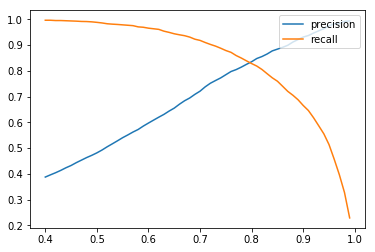

In [114]:
p=[]
r=[]
ts=[]

thresholds=np.arange(0.40, 1.00, 0.01)

y_true=target

for thres in thresholds:
    y_pred=predictions.iloc[:,1].apply(lambda x: 1 if x>=thres else 0 )
    p1=precision_score(y_true=y_true, y_pred=y_pred, average=None)
    r1=recall_score(y_true=y_true, y_pred=y_pred, average=None)
    
    
    p.append(p1[1])
    r.append(r1[1])
    ts.append(thres)

plt.plot(ts,p,label='precision')    
plt.plot(ts,r,label='recall')    
plt.legend(loc='upper right')    

In [95]:
from sklearn.externals import joblib
joblib.dump(cb_clf, new_model, compress=3)

['fraudModelv1.2.pkl']